# Downstream Analysis with flashscenic

This tutorial demonstrates how to use **flashscenic** for gene regulatory network (GRN) analysis and downstream biological interpretation. We use the Immune_ALL_human dataset from the [scIB benchmark](https://doi.org/10.1038/s41592-021-01336-8) (Luecken et al. 2022): 33,506 cells across 16 immune and hematopoietic cell types from 10 batches.

**What you'll learn:**
1. Running the flashscenic pipeline (one function call)
2. Visualizing regulon activity with UMAP -- and why it naturally handles batch effects
3. Identifying cell-type-specific regulons with Regulon Specificity Scores (RSS)
4. Validating results against known immune biology (PAX5 in B cells, SPI1 in monocytes, etc.)
5. Differential regulon activity analysis
6. Exploring TF-target regulatory networks

**Requirements:** `flashscenic[tutorial]` (includes scanpy, matplotlib, seaborn, networkx)

**GPU:** A CUDA-capable GPU is recommended. The pipeline takes ~2 minutes on a modern GPU; downstream analyses are CPU-only.

## 1. Setup and Data Loading

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import anndata
import warnings
warnings.filterwarnings('ignore')

import flashscenic as fs

sc.settings.set_figure_params(dpi=100, frameon=False, figsize=(4, 4))
plt.rcParams['figure.dpi'] = 100

### Load the dataset

We use the **Immune_ALL_human** dataset from the scIB benchmark, containing PBMC and bone marrow cells from 5 studies (10 batches) and 16 annotated cell types spanning lymphoid, myeloid, erythroid, and progenitor populations.

Download from: https://figshare.com/ndownloader/files/25717328

In [2]:
DATA_PATH = '../experiments/data/Immune_ALL_human.h5ad'

adata = sc.read_h5ad(DATA_PATH)
print(f"Dataset: {adata.shape[0]:,} cells x {adata.shape[1]:,} genes")
print(f"Cell types: {adata.obs['final_annotation'].nunique()}")
print(f"Batches: {adata.obs['batch'].nunique()}")
print()
print(adata.obs['final_annotation'].value_counts())

Dataset: 33,506 cells x 12,303 genes
Cell types: 16
Batches: 10

final_annotation
CD4+ T cells                        11011
CD14+ Monocytes                      6483
CD20+ B cells                        2873
NKT cells                            2745
NK cells                             2294
CD8+ T cells                         2183
Erythrocytes                         1502
Monocyte-derived dendritic cells     1012
CD16+ Monocytes                       997
HSPCs                                 473
Erythroid progenitors                 463
Plasmacytoid dendritic cells          436
Monocyte progenitors                  428
Megakaryocyte progenitors             270
CD10+ B cells                         207
Plasma cells                          129
Name: count, dtype: int64


### Preprocessing

flashscenic needs a dense expression matrix with no zero-variance genes. We also filter to genes expressed in at least 10 cells.

In [3]:
from scipy.sparse import issparse

# Filter genes: keep genes expressed in > 10 cells
if issparse(adata.X):
    cells_per_gene = np.array((adata.X > 0).sum(axis=0)).flatten()
else:
    cells_per_gene = (adata.X > 0).sum(axis=0)
gene_mask = cells_per_gene > 10
adata = adata[:, gene_mask].copy()
print(f"After gene filter (>10 cells): {adata.shape}")

# Densify sparse matrix
if issparse(adata.X):
    adata.X = adata.X.toarray()

# Remove zero-variance genes
gene_var = np.var(adata.X, axis=0)
nonzero_mask = gene_var > 0
n_removed = (~nonzero_mask).sum()
if n_removed > 0:
    print(f"Removing {n_removed} zero-variance genes")
    adata = adata[:, nonzero_mask].copy()
print(f"Final shape: {adata.shape}")

gene_names = adata.var_names.tolist()
exp_matrix = adata.X.astype(np.float32)

After gene filter (>10 cells): (33506, 12282)


Final shape: (33506, 12282)


### Compute PCA baseline

We compute a PCA-based UMAP first so we can compare it against the AUCell-based UMAP later.

In [4]:
sc.tl.pca(adata, n_comps=30)
sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_pca')
sc.tl.umap(adata)
adata.obsm['X_umap_pca'] = adata.obsm['X_umap'].copy()

## 2. Running flashscenic

The entire SCENIC pipeline -- GRN inference (RegDiffusion), module filtering, cisTarget pruning, and AUCell scoring -- runs in a single function call.

In [5]:
result = fs.run_flashscenic(
    exp_matrix, gene_names,
    species='human',
    device='cuda',
    seed=42,
    verbose=True,
)

# Unpack results
auc_scores = result['auc_scores']       # (n_cells, n_regulons)
regulon_names = result['regulon_names']  # list of str
regulons = result['regulons']            # list of dicts
regulon_adj = result['regulon_adj']      # (n_regulons, n_genes) binary

print(f"\nFound {len(regulon_names)} regulons")
print(f"AUCell scores shape: {auc_scores.shape}")
print(f"Example regulons: {regulon_names[:10]}")

[flashscenic] Step 0/5: Preparing resources...
  [Human TF list (hg38)] Already cached: allTFs_hg38.txt
  [Human 500bp/100bp ranking database (v10)] Already cached: hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather
  [Human 10kbp ranking database (v10)] Already cached: hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather
  [Human motif annotations (v10)] Already cached: motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl
Download complete.
[flashscenic] Step 1/5: Running RegDiffusion GRN inference (33506 cells, 12282 genes, 1000 steps)...


  0%|          | 0/1000 [00:00<?, ?it/s]

Training loss: 1.576, Change on Adj: -0.020:   0%|          | 0/1000 [00:02<?, ?it/s]

Training loss: 1.576, Change on Adj: -0.020:   0%|          | 1/1000 [00:02<34:39,  2.08s/it]

Training loss: 1.298, Change on Adj: -0.018:   0%|          | 1/1000 [00:03<34:39,  2.08s/it]

Training loss: 1.298, Change on Adj: -0.018:   0%|          | 2/1000 [00:03<26:03,  1.57s/it]

Training loss: 1.140, Change on Adj: -0.016:   0%|          | 2/1000 [00:03<26:03,  1.57s/it]

Training loss: 1.070, Change on Adj: -0.015:   0%|          | 2/1000 [00:03<26:03,  1.57s/it]

Training loss: 1.070, Change on Adj: -0.015:   0%|          | 4/1000 [00:03<10:35,  1.57it/s]

Training loss: 1.039, Change on Adj: -0.015:   0%|          | 4/1000 [00:03<10:35,  1.57it/s]

Training loss: 1.042, Change on Adj: -0.014:   0%|          | 4/1000 [00:03<10:35,  1.57it/s]

Training loss: 1.042, Change on Adj: -0.014:   1%|          | 6/1000 [00:03<06:12,  2.67it/s]

Training loss: 1.061, Change on Adj: -0.014:   1%|          | 6/1000 [00:03<06:12,  2.67it/s]

Training loss: 1.075, Change on Adj: -0.014:   1%|          | 6/1000 [00:03<06:12,  2.67it/s]

Training loss: 1.075, Change on Adj: -0.014:   1%|          | 8/1000 [00:03<04:12,  3.93it/s]

Training loss: 1.065, Change on Adj: -0.014:   1%|          | 8/1000 [00:03<04:12,  3.93it/s]

Training loss: 1.057, Change on Adj: -0.015:   1%|          | 8/1000 [00:03<04:12,  3.93it/s]

Training loss: 1.057, Change on Adj: -0.015:   1%|          | 10/1000 [00:03<03:07,  5.27it/s]

Training loss: 1.055, Change on Adj: -0.015:   1%|          | 10/1000 [00:04<03:07,  5.27it/s]

Training loss: 1.029, Change on Adj: -0.015:   1%|          | 10/1000 [00:04<03:07,  5.27it/s]

Training loss: 1.029, Change on Adj: -0.015:   1%|          | 12/1000 [00:04<02:30,  6.56it/s]

Training loss: 1.004, Change on Adj: -0.014:   1%|          | 12/1000 [00:04<02:30,  6.56it/s]

Training loss: 0.984, Change on Adj: -0.014:   1%|          | 12/1000 [00:04<02:30,  6.56it/s]

Training loss: 0.984, Change on Adj: -0.014:   1%|▏         | 14/1000 [00:04<02:08,  7.67it/s]

Training loss: 0.966, Change on Adj: -0.014:   1%|▏         | 14/1000 [00:04<02:08,  7.67it/s]

Training loss: 0.954, Change on Adj: -0.014:   1%|▏         | 14/1000 [00:04<02:08,  7.67it/s]

Training loss: 0.954, Change on Adj: -0.014:   2%|▏         | 16/1000 [00:04<01:54,  8.62it/s]

Training loss: 0.952, Change on Adj: -0.013:   2%|▏         | 16/1000 [00:04<01:54,  8.62it/s]

Training loss: 0.940, Change on Adj: -0.013:   2%|▏         | 16/1000 [00:04<01:54,  8.62it/s]

Training loss: 0.940, Change on Adj: -0.013:   2%|▏         | 18/1000 [00:04<01:44,  9.41it/s]

Training loss: 0.941, Change on Adj: -0.013:   2%|▏         | 18/1000 [00:04<01:44,  9.41it/s]

Training loss: 0.945, Change on Adj: -0.013:   2%|▏         | 18/1000 [00:04<01:44,  9.41it/s]

Training loss: 0.945, Change on Adj: -0.013:   2%|▏         | 20/1000 [00:04<01:37, 10.03it/s]

Training loss: 0.942, Change on Adj: -0.012:   2%|▏         | 20/1000 [00:04<01:37, 10.03it/s]

Training loss: 0.931, Change on Adj: -0.012:   2%|▏         | 20/1000 [00:04<01:37, 10.03it/s]

Training loss: 0.931, Change on Adj: -0.012:   2%|▏         | 22/1000 [00:04<01:33, 10.51it/s]

Training loss: 0.926, Change on Adj: -0.012:   2%|▏         | 22/1000 [00:05<01:33, 10.51it/s]

Training loss: 0.920, Change on Adj: -0.012:   2%|▏         | 22/1000 [00:05<01:33, 10.51it/s]

Training loss: 0.920, Change on Adj: -0.012:   2%|▏         | 24/1000 [00:05<01:29, 10.86it/s]

Training loss: 0.912, Change on Adj: -0.012:   2%|▏         | 24/1000 [00:05<01:29, 10.86it/s]

Training loss: 0.897, Change on Adj: -0.012:   2%|▏         | 24/1000 [00:05<01:29, 10.86it/s]

Training loss: 0.897, Change on Adj: -0.012:   3%|▎         | 26/1000 [00:05<01:27, 11.12it/s]

Training loss: 0.893, Change on Adj: -0.012:   3%|▎         | 26/1000 [00:05<01:27, 11.12it/s]

Training loss: 0.887, Change on Adj: -0.012:   3%|▎         | 26/1000 [00:05<01:27, 11.12it/s]

Training loss: 0.887, Change on Adj: -0.012:   3%|▎         | 28/1000 [00:05<01:26, 11.30it/s]

Training loss: 0.880, Change on Adj: -0.012:   3%|▎         | 28/1000 [00:05<01:26, 11.30it/s]

Training loss: 0.868, Change on Adj: -0.012:   3%|▎         | 28/1000 [00:05<01:26, 11.30it/s]

Training loss: 0.868, Change on Adj: -0.012:   3%|▎         | 30/1000 [00:05<01:24, 11.43it/s]

Training loss: 0.856, Change on Adj: -0.012:   3%|▎         | 30/1000 [00:05<01:24, 11.43it/s]

Training loss: 0.858, Change on Adj: -0.012:   3%|▎         | 30/1000 [00:05<01:24, 11.43it/s]

Training loss: 0.858, Change on Adj: -0.012:   3%|▎         | 32/1000 [00:05<01:23, 11.53it/s]

Training loss: 0.850, Change on Adj: -0.012:   3%|▎         | 32/1000 [00:05<01:23, 11.53it/s]

Training loss: 0.853, Change on Adj: -0.012:   3%|▎         | 32/1000 [00:05<01:23, 11.53it/s]

Training loss: 0.853, Change on Adj: -0.012:   3%|▎         | 34/1000 [00:05<01:23, 11.59it/s]

Training loss: 0.850, Change on Adj: -0.012:   3%|▎         | 34/1000 [00:06<01:23, 11.59it/s]

Training loss: 0.830, Change on Adj: -0.012:   3%|▎         | 34/1000 [00:06<01:23, 11.59it/s]

Training loss: 0.830, Change on Adj: -0.012:   4%|▎         | 36/1000 [00:06<01:22, 11.64it/s]

Training loss: 0.821, Change on Adj: -0.012:   4%|▎         | 36/1000 [00:06<01:22, 11.64it/s]

Training loss: 0.814, Change on Adj: -0.012:   4%|▎         | 36/1000 [00:06<01:22, 11.64it/s]

Training loss: 0.814, Change on Adj: -0.012:   4%|▍         | 38/1000 [00:06<01:22, 11.67it/s]

Training loss: 0.815, Change on Adj: -0.012:   4%|▍         | 38/1000 [00:06<01:22, 11.67it/s]

Training loss: 0.806, Change on Adj: -0.012:   4%|▍         | 38/1000 [00:06<01:22, 11.67it/s]

Training loss: 0.806, Change on Adj: -0.012:   4%|▍         | 40/1000 [00:06<01:22, 11.69it/s]

Training loss: 0.789, Change on Adj: -0.012:   4%|▍         | 40/1000 [00:06<01:22, 11.69it/s]

Training loss: 0.798, Change on Adj: -0.012:   4%|▍         | 40/1000 [00:06<01:22, 11.69it/s]

Training loss: 0.798, Change on Adj: -0.012:   4%|▍         | 42/1000 [00:06<01:21, 11.71it/s]

Training loss: 0.787, Change on Adj: -0.012:   4%|▍         | 42/1000 [00:06<01:21, 11.71it/s]

Training loss: 0.772, Change on Adj: -0.012:   4%|▍         | 42/1000 [00:06<01:21, 11.71it/s]

Training loss: 0.772, Change on Adj: -0.012:   4%|▍         | 44/1000 [00:06<01:21, 11.74it/s]

Training loss: 0.780, Change on Adj: -0.012:   4%|▍         | 44/1000 [00:06<01:21, 11.74it/s]

Training loss: 0.775, Change on Adj: -0.012:   4%|▍         | 44/1000 [00:06<01:21, 11.74it/s]

Training loss: 0.775, Change on Adj: -0.012:   5%|▍         | 46/1000 [00:06<01:21, 11.75it/s]

Training loss: 0.763, Change on Adj: -0.012:   5%|▍         | 46/1000 [00:07<01:21, 11.75it/s]

Training loss: 0.754, Change on Adj: -0.012:   5%|▍         | 46/1000 [00:07<01:21, 11.75it/s]

Training loss: 0.754, Change on Adj: -0.012:   5%|▍         | 48/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.745, Change on Adj: -0.012:   5%|▍         | 48/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.744, Change on Adj: -0.012:   5%|▍         | 48/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.744, Change on Adj: -0.012:   5%|▌         | 50/1000 [00:07<01:20, 11.77it/s]

Training loss: 0.732, Change on Adj: -0.012:   5%|▌         | 50/1000 [00:07<01:20, 11.77it/s]

Training loss: 0.721, Change on Adj: -0.012:   5%|▌         | 50/1000 [00:07<01:20, 11.77it/s]

Training loss: 0.721, Change on Adj: -0.012:   5%|▌         | 52/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.712, Change on Adj: -0.012:   5%|▌         | 52/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.716, Change on Adj: -0.012:   5%|▌         | 52/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.716, Change on Adj: -0.012:   5%|▌         | 54/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.719, Change on Adj: -0.012:   5%|▌         | 54/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.717, Change on Adj: -0.012:   5%|▌         | 54/1000 [00:07<01:20, 11.76it/s]

Training loss: 0.717, Change on Adj: -0.012:   6%|▌         | 56/1000 [00:07<01:20, 11.78it/s]

Training loss: 0.699, Change on Adj: -0.012:   6%|▌         | 56/1000 [00:07<01:20, 11.78it/s]

Training loss: 0.678, Change on Adj: -0.012:   6%|▌         | 56/1000 [00:08<01:20, 11.78it/s]

Training loss: 0.678, Change on Adj: -0.012:   6%|▌         | 58/1000 [00:08<01:19, 11.78it/s]

Training loss: 0.666, Change on Adj: -0.012:   6%|▌         | 58/1000 [00:08<01:19, 11.78it/s]

Training loss: 0.674, Change on Adj: -0.012:   6%|▌         | 58/1000 [00:08<01:19, 11.78it/s]

Training loss: 0.674, Change on Adj: -0.012:   6%|▌         | 60/1000 [00:08<01:19, 11.79it/s]

Training loss: 0.666, Change on Adj: -0.012:   6%|▌         | 60/1000 [00:08<01:19, 11.79it/s]

Training loss: 0.670, Change on Adj: -0.012:   6%|▌         | 60/1000 [00:08<01:19, 11.79it/s]

Training loss: 0.670, Change on Adj: -0.012:   6%|▌         | 62/1000 [00:08<01:19, 11.80it/s]

Training loss: 0.685, Change on Adj: -0.012:   6%|▌         | 62/1000 [00:08<01:19, 11.80it/s]

Training loss: 0.652, Change on Adj: -0.012:   6%|▌         | 62/1000 [00:08<01:19, 11.80it/s]

Training loss: 0.652, Change on Adj: -0.012:   6%|▋         | 64/1000 [00:08<01:19, 11.81it/s]

Training loss: 0.636, Change on Adj: -0.012:   6%|▋         | 64/1000 [00:08<01:19, 11.81it/s]

Training loss: 0.636, Change on Adj: -0.012:   6%|▋         | 64/1000 [00:08<01:19, 11.81it/s]

Training loss: 0.636, Change on Adj: -0.012:   7%|▋         | 66/1000 [00:08<01:19, 11.81it/s]

Training loss: 0.654, Change on Adj: -0.012:   7%|▋         | 66/1000 [00:08<01:19, 11.81it/s]

Training loss: 0.611, Change on Adj: -0.012:   7%|▋         | 66/1000 [00:08<01:19, 11.81it/s]

Training loss: 0.611, Change on Adj: -0.012:   7%|▋         | 68/1000 [00:08<01:18, 11.81it/s]

Training loss: 0.608, Change on Adj: -0.012:   7%|▋         | 68/1000 [00:08<01:18, 11.81it/s]

Training loss: 0.623, Change on Adj: -0.012:   7%|▋         | 68/1000 [00:09<01:18, 11.81it/s]

Training loss: 0.623, Change on Adj: -0.012:   7%|▋         | 70/1000 [00:09<01:18, 11.81it/s]

Training loss: 0.585, Change on Adj: -0.012:   7%|▋         | 70/1000 [00:09<01:18, 11.81it/s]

Training loss: 0.600, Change on Adj: -0.012:   7%|▋         | 70/1000 [00:09<01:18, 11.81it/s]

Training loss: 0.600, Change on Adj: -0.012:   7%|▋         | 72/1000 [00:09<01:18, 11.82it/s]

Training loss: 0.585, Change on Adj: -0.012:   7%|▋         | 72/1000 [00:09<01:18, 11.82it/s]

Training loss: 0.586, Change on Adj: -0.012:   7%|▋         | 72/1000 [00:09<01:18, 11.82it/s]

Training loss: 0.586, Change on Adj: -0.012:   7%|▋         | 74/1000 [00:09<01:18, 11.82it/s]

Training loss: 0.568, Change on Adj: -0.012:   7%|▋         | 74/1000 [00:09<01:18, 11.82it/s]

Training loss: 0.568, Change on Adj: -0.012:   7%|▋         | 74/1000 [00:09<01:18, 11.82it/s]

Training loss: 0.568, Change on Adj: -0.012:   8%|▊         | 76/1000 [00:09<01:18, 11.83it/s]

Training loss: 0.546, Change on Adj: -0.012:   8%|▊         | 76/1000 [00:09<01:18, 11.83it/s]

Training loss: 0.569, Change on Adj: -0.012:   8%|▊         | 76/1000 [00:09<01:18, 11.83it/s]

Training loss: 0.569, Change on Adj: -0.012:   8%|▊         | 78/1000 [00:09<01:17, 11.82it/s]

Training loss: 0.563, Change on Adj: -0.012:   8%|▊         | 78/1000 [00:09<01:17, 11.82it/s]

Training loss: 0.536, Change on Adj: -0.012:   8%|▊         | 78/1000 [00:09<01:17, 11.82it/s]

Training loss: 0.536, Change on Adj: -0.012:   8%|▊         | 80/1000 [00:09<01:17, 11.83it/s]

Training loss: 0.538, Change on Adj: -0.012:   8%|▊         | 80/1000 [00:09<01:17, 11.83it/s]

Training loss: 0.527, Change on Adj: -0.012:   8%|▊         | 80/1000 [00:10<01:17, 11.83it/s]

Training loss: 0.527, Change on Adj: -0.012:   8%|▊         | 82/1000 [00:10<01:17, 11.82it/s]

Training loss: 0.536, Change on Adj: -0.012:   8%|▊         | 82/1000 [00:10<01:17, 11.82it/s]

Training loss: 0.527, Change on Adj: -0.012:   8%|▊         | 82/1000 [00:10<01:17, 11.82it/s]

Training loss: 0.527, Change on Adj: -0.012:   8%|▊         | 84/1000 [00:10<01:17, 11.82it/s]

Training loss: 0.501, Change on Adj: -0.012:   8%|▊         | 84/1000 [00:10<01:17, 11.82it/s]

Training loss: 0.506, Change on Adj: -0.012:   8%|▊         | 84/1000 [00:10<01:17, 11.82it/s]

Training loss: 0.506, Change on Adj: -0.012:   9%|▊         | 86/1000 [00:10<01:17, 11.83it/s]

Training loss: 0.493, Change on Adj: -0.012:   9%|▊         | 86/1000 [00:10<01:17, 11.83it/s]

Training loss: 0.513, Change on Adj: -0.012:   9%|▊         | 86/1000 [00:10<01:17, 11.83it/s]

Training loss: 0.513, Change on Adj: -0.012:   9%|▉         | 88/1000 [00:10<01:17, 11.80it/s]

Training loss: 0.522, Change on Adj: -0.012:   9%|▉         | 88/1000 [00:10<01:17, 11.80it/s]

Training loss: 0.496, Change on Adj: -0.012:   9%|▉         | 88/1000 [00:10<01:17, 11.80it/s]

Training loss: 0.496, Change on Adj: -0.012:   9%|▉         | 90/1000 [00:10<01:17, 11.74it/s]

Training loss: 0.507, Change on Adj: -0.012:   9%|▉         | 90/1000 [00:10<01:17, 11.74it/s]

Training loss: 0.467, Change on Adj: -0.012:   9%|▉         | 90/1000 [00:10<01:17, 11.74it/s]

Training loss: 0.467, Change on Adj: -0.012:   9%|▉         | 92/1000 [00:10<01:17, 11.76it/s]

Training loss: 0.446, Change on Adj: -0.012:   9%|▉         | 92/1000 [00:10<01:17, 11.76it/s]

Training loss: 0.437, Change on Adj: -0.012:   9%|▉         | 92/1000 [00:11<01:17, 11.76it/s]

Training loss: 0.437, Change on Adj: -0.012:   9%|▉         | 94/1000 [00:11<01:16, 11.78it/s]

Training loss: 0.442, Change on Adj: -0.012:   9%|▉         | 94/1000 [00:11<01:16, 11.78it/s]

Training loss: 0.478, Change on Adj: -0.012:   9%|▉         | 94/1000 [00:11<01:16, 11.78it/s]

Training loss: 0.478, Change on Adj: -0.012:  10%|▉         | 96/1000 [00:11<01:16, 11.76it/s]

Training loss: 0.440, Change on Adj: -0.012:  10%|▉         | 96/1000 [00:11<01:16, 11.76it/s]

Training loss: 0.451, Change on Adj: -0.013:  10%|▉         | 96/1000 [00:11<01:16, 11.76it/s]

Training loss: 0.451, Change on Adj: -0.013:  10%|▉         | 98/1000 [00:11<01:16, 11.75it/s]

Training loss: 0.450, Change on Adj: -0.012:  10%|▉         | 98/1000 [00:11<01:16, 11.75it/s]

Training loss: 0.416, Change on Adj: -0.013:  10%|▉         | 98/1000 [00:11<01:16, 11.75it/s]

Training loss: 0.416, Change on Adj: -0.013:  10%|█         | 100/1000 [00:11<01:16, 11.75it/s]

Training loss: 0.412, Change on Adj: -0.013:  10%|█         | 100/1000 [00:11<01:16, 11.75it/s]

Training loss: 0.400, Change on Adj: -0.012:  10%|█         | 100/1000 [00:11<01:16, 11.75it/s]

Training loss: 0.400, Change on Adj: -0.012:  10%|█         | 102/1000 [00:11<01:16, 11.76it/s]

Training loss: 0.411, Change on Adj: -0.012:  10%|█         | 102/1000 [00:11<01:16, 11.76it/s]

Training loss: 0.398, Change on Adj: -0.013:  10%|█         | 102/1000 [00:11<01:16, 11.76it/s]

Training loss: 0.398, Change on Adj: -0.013:  10%|█         | 104/1000 [00:11<01:16, 11.78it/s]

Training loss: 0.421, Change on Adj: -0.013:  10%|█         | 104/1000 [00:11<01:16, 11.78it/s]

Training loss: 0.372, Change on Adj: -0.013:  10%|█         | 104/1000 [00:12<01:16, 11.78it/s]

Training loss: 0.372, Change on Adj: -0.013:  11%|█         | 106/1000 [00:12<01:16, 11.66it/s]

Training loss: 0.416, Change on Adj: -0.012:  11%|█         | 106/1000 [00:12<01:16, 11.66it/s]

Training loss: 0.383, Change on Adj: -0.012:  11%|█         | 106/1000 [00:12<01:16, 11.66it/s]

Training loss: 0.383, Change on Adj: -0.012:  11%|█         | 108/1000 [00:12<01:17, 11.57it/s]

Training loss: 0.396, Change on Adj: -0.012:  11%|█         | 108/1000 [00:12<01:17, 11.57it/s]

Training loss: 0.347, Change on Adj: -0.012:  11%|█         | 108/1000 [00:12<01:17, 11.57it/s]

Training loss: 0.347, Change on Adj: -0.012:  11%|█         | 110/1000 [00:12<01:16, 11.63it/s]

Training loss: 0.368, Change on Adj: -0.012:  11%|█         | 110/1000 [00:12<01:16, 11.63it/s]

Training loss: 0.373, Change on Adj: -0.012:  11%|█         | 110/1000 [00:12<01:16, 11.63it/s]

Training loss: 0.373, Change on Adj: -0.012:  11%|█         | 112/1000 [00:12<01:16, 11.58it/s]

Training loss: 0.395, Change on Adj: -0.012:  11%|█         | 112/1000 [00:12<01:16, 11.58it/s]

Training loss: 0.387, Change on Adj: -0.012:  11%|█         | 112/1000 [00:12<01:16, 11.58it/s]

Training loss: 0.387, Change on Adj: -0.012:  11%|█▏        | 114/1000 [00:12<01:16, 11.65it/s]

Training loss: 0.330, Change on Adj: -0.012:  11%|█▏        | 114/1000 [00:12<01:16, 11.65it/s]

Training loss: 0.342, Change on Adj: -0.012:  11%|█▏        | 114/1000 [00:12<01:16, 11.65it/s]

Training loss: 0.342, Change on Adj: -0.012:  12%|█▏        | 116/1000 [00:12<01:15, 11.71it/s]

Training loss: 0.331, Change on Adj: -0.012:  12%|█▏        | 116/1000 [00:13<01:15, 11.71it/s]

Training loss: 0.335, Change on Adj: -0.012:  12%|█▏        | 116/1000 [00:13<01:15, 11.71it/s]

Training loss: 0.335, Change on Adj: -0.012:  12%|█▏        | 118/1000 [00:13<01:15, 11.74it/s]

Training loss: 0.320, Change on Adj: -0.012:  12%|█▏        | 118/1000 [00:13<01:15, 11.74it/s]

Training loss: 0.355, Change on Adj: -0.012:  12%|█▏        | 118/1000 [00:13<01:15, 11.74it/s]

Training loss: 0.355, Change on Adj: -0.012:  12%|█▏        | 120/1000 [00:13<01:14, 11.76it/s]

Training loss: 0.308, Change on Adj: -0.012:  12%|█▏        | 120/1000 [00:13<01:14, 11.76it/s]

Training loss: 0.306, Change on Adj: -0.012:  12%|█▏        | 120/1000 [00:13<01:14, 11.76it/s]

Training loss: 0.306, Change on Adj: -0.012:  12%|█▏        | 122/1000 [00:13<01:14, 11.79it/s]

Training loss: 0.331, Change on Adj: -0.012:  12%|█▏        | 122/1000 [00:13<01:14, 11.79it/s]

Training loss: 0.308, Change on Adj: -0.012:  12%|█▏        | 122/1000 [00:13<01:14, 11.79it/s]

Training loss: 0.308, Change on Adj: -0.012:  12%|█▏        | 124/1000 [00:13<01:14, 11.80it/s]

Training loss: 0.309, Change on Adj: -0.012:  12%|█▏        | 124/1000 [00:13<01:14, 11.80it/s]

Training loss: 0.290, Change on Adj: -0.012:  12%|█▏        | 124/1000 [00:13<01:14, 11.80it/s]

Training loss: 0.290, Change on Adj: -0.012:  13%|█▎        | 126/1000 [00:13<01:13, 11.81it/s]

Training loss: 0.330, Change on Adj: -0.012:  13%|█▎        | 126/1000 [00:13<01:13, 11.81it/s]

Training loss: 0.271, Change on Adj: -0.012:  13%|█▎        | 126/1000 [00:13<01:13, 11.81it/s]

Training loss: 0.271, Change on Adj: -0.012:  13%|█▎        | 128/1000 [00:13<01:16, 11.37it/s]

Training loss: 0.304, Change on Adj: -0.012:  13%|█▎        | 128/1000 [00:14<01:16, 11.37it/s]

Training loss: 0.305, Change on Adj: -0.012:  13%|█▎        | 128/1000 [00:14<01:16, 11.37it/s]

Training loss: 0.305, Change on Adj: -0.012:  13%|█▎        | 130/1000 [00:14<01:22, 10.53it/s]

Training loss: 0.301, Change on Adj: -0.012:  13%|█▎        | 130/1000 [00:14<01:22, 10.53it/s]

Training loss: 0.304, Change on Adj: -0.012:  13%|█▎        | 130/1000 [00:14<01:22, 10.53it/s]

Training loss: 0.304, Change on Adj: -0.012:  13%|█▎        | 132/1000 [00:14<01:24, 10.30it/s]

Training loss: 0.297, Change on Adj: -0.012:  13%|█▎        | 132/1000 [00:14<01:24, 10.30it/s]

Training loss: 0.278, Change on Adj: -0.012:  13%|█▎        | 132/1000 [00:14<01:24, 10.30it/s]

Training loss: 0.278, Change on Adj: -0.012:  13%|█▎        | 134/1000 [00:14<01:23, 10.31it/s]

Training loss: 0.283, Change on Adj: -0.012:  13%|█▎        | 134/1000 [00:14<01:23, 10.31it/s]

Training loss: 0.277, Change on Adj: -0.012:  13%|█▎        | 134/1000 [00:14<01:23, 10.31it/s]

Training loss: 0.277, Change on Adj: -0.012:  14%|█▎        | 136/1000 [00:14<01:24, 10.17it/s]

Training loss: 0.296, Change on Adj: -0.012:  14%|█▎        | 136/1000 [00:14<01:24, 10.17it/s]

Training loss: 0.342, Change on Adj: -0.012:  14%|█▎        | 136/1000 [00:14<01:24, 10.17it/s]

Training loss: 0.342, Change on Adj: -0.012:  14%|█▍        | 138/1000 [00:14<01:23, 10.26it/s]

Training loss: 0.271, Change on Adj: -0.012:  14%|█▍        | 138/1000 [00:15<01:23, 10.26it/s]

Training loss: 0.288, Change on Adj: -0.012:  14%|█▍        | 138/1000 [00:15<01:23, 10.26it/s]

Training loss: 0.288, Change on Adj: -0.012:  14%|█▍        | 140/1000 [00:15<01:24, 10.20it/s]

Training loss: 0.266, Change on Adj: -0.012:  14%|█▍        | 140/1000 [00:15<01:24, 10.20it/s]

Training loss: 0.231, Change on Adj: -0.012:  14%|█▍        | 140/1000 [00:15<01:24, 10.20it/s]

Training loss: 0.231, Change on Adj: -0.012:  14%|█▍        | 142/1000 [00:15<01:25,  9.99it/s]

Training loss: 0.252, Change on Adj: -0.011:  14%|█▍        | 142/1000 [00:15<01:25,  9.99it/s]

Training loss: 0.325, Change on Adj: -0.011:  14%|█▍        | 142/1000 [00:15<01:25,  9.99it/s]

Training loss: 0.325, Change on Adj: -0.011:  14%|█▍        | 144/1000 [00:15<01:22, 10.32it/s]

Training loss: 0.258, Change on Adj: -0.011:  14%|█▍        | 144/1000 [00:15<01:22, 10.32it/s]

Training loss: 0.285, Change on Adj: -0.012:  14%|█▍        | 144/1000 [00:15<01:22, 10.32it/s]

Training loss: 0.285, Change on Adj: -0.012:  15%|█▍        | 146/1000 [00:15<01:19, 10.73it/s]

Training loss: 0.298, Change on Adj: -0.012:  15%|█▍        | 146/1000 [00:15<01:19, 10.73it/s]

Training loss: 0.284, Change on Adj: -0.012:  15%|█▍        | 146/1000 [00:15<01:19, 10.73it/s]

Training loss: 0.284, Change on Adj: -0.012:  15%|█▍        | 148/1000 [00:15<01:17, 11.04it/s]

Training loss: 0.327, Change on Adj: -0.012:  15%|█▍        | 148/1000 [00:15<01:17, 11.04it/s]

Training loss: 0.274, Change on Adj: -0.012:  15%|█▍        | 148/1000 [00:16<01:17, 11.04it/s]

Training loss: 0.274, Change on Adj: -0.012:  15%|█▌        | 150/1000 [00:16<01:15, 11.27it/s]

Training loss: 0.241, Change on Adj: -0.012:  15%|█▌        | 150/1000 [00:16<01:15, 11.27it/s]

Training loss: 0.286, Change on Adj: -0.012:  15%|█▌        | 150/1000 [00:16<01:15, 11.27it/s]

Training loss: 0.286, Change on Adj: -0.012:  15%|█▌        | 152/1000 [00:16<01:14, 11.43it/s]

Training loss: 0.270, Change on Adj: -0.012:  15%|█▌        | 152/1000 [00:16<01:14, 11.43it/s]

Training loss: 0.303, Change on Adj: -0.012:  15%|█▌        | 152/1000 [00:16<01:14, 11.43it/s]

Training loss: 0.303, Change on Adj: -0.012:  15%|█▌        | 154/1000 [00:16<01:13, 11.55it/s]

Training loss: 0.326, Change on Adj: -0.012:  15%|█▌        | 154/1000 [00:16<01:13, 11.55it/s]

Training loss: 0.216, Change on Adj: -0.012:  15%|█▌        | 154/1000 [00:16<01:13, 11.55it/s]

Training loss: 0.216, Change on Adj: -0.012:  16%|█▌        | 156/1000 [00:16<01:12, 11.63it/s]

Training loss: 0.315, Change on Adj: -0.011:  16%|█▌        | 156/1000 [00:16<01:12, 11.63it/s]

Training loss: 0.254, Change on Adj: -0.011:  16%|█▌        | 156/1000 [00:16<01:12, 11.63it/s]

Training loss: 0.254, Change on Adj: -0.011:  16%|█▌        | 158/1000 [00:16<01:11, 11.70it/s]

Training loss: 0.243, Change on Adj: -0.011:  16%|█▌        | 158/1000 [00:16<01:11, 11.70it/s]

Training loss: 0.231, Change on Adj: -0.011:  16%|█▌        | 158/1000 [00:16<01:11, 11.70it/s]

Training loss: 0.231, Change on Adj: -0.011:  16%|█▌        | 160/1000 [00:16<01:11, 11.75it/s]

Training loss: 0.255, Change on Adj: -0.011:  16%|█▌        | 160/1000 [00:17<01:11, 11.75it/s]

Training loss: 0.265, Change on Adj: -0.011:  16%|█▌        | 160/1000 [00:17<01:11, 11.75it/s]

Training loss: 0.265, Change on Adj: -0.011:  16%|█▌        | 162/1000 [00:17<01:11, 11.78it/s]

Training loss: 0.298, Change on Adj: -0.011:  16%|█▌        | 162/1000 [00:17<01:11, 11.78it/s]

Training loss: 0.273, Change on Adj: -0.011:  16%|█▌        | 162/1000 [00:17<01:11, 11.78it/s]

Training loss: 0.273, Change on Adj: -0.011:  16%|█▋        | 164/1000 [00:17<01:10, 11.80it/s]

Training loss: 0.288, Change on Adj: -0.011:  16%|█▋        | 164/1000 [00:17<01:10, 11.80it/s]

Training loss: 0.291, Change on Adj: -0.011:  16%|█▋        | 164/1000 [00:17<01:10, 11.80it/s]

Training loss: 0.291, Change on Adj: -0.011:  17%|█▋        | 166/1000 [00:17<01:10, 11.82it/s]

Training loss: 0.276, Change on Adj: -0.011:  17%|█▋        | 166/1000 [00:17<01:10, 11.82it/s]

Training loss: 0.217, Change on Adj: -0.011:  17%|█▋        | 166/1000 [00:17<01:10, 11.82it/s]

Training loss: 0.217, Change on Adj: -0.011:  17%|█▋        | 168/1000 [00:17<01:10, 11.83it/s]

Training loss: 0.312, Change on Adj: -0.011:  17%|█▋        | 168/1000 [00:17<01:10, 11.83it/s]

Training loss: 0.247, Change on Adj: -0.011:  17%|█▋        | 168/1000 [00:17<01:10, 11.83it/s]

Training loss: 0.247, Change on Adj: -0.011:  17%|█▋        | 170/1000 [00:17<01:10, 11.84it/s]

Training loss: 0.251, Change on Adj: -0.011:  17%|█▋        | 170/1000 [00:17<01:10, 11.84it/s]

Training loss: 0.258, Change on Adj: -0.011:  17%|█▋        | 170/1000 [00:17<01:10, 11.84it/s]

Training loss: 0.258, Change on Adj: -0.011:  17%|█▋        | 172/1000 [00:17<01:09, 11.85it/s]

Training loss: 0.262, Change on Adj: -0.010:  17%|█▋        | 172/1000 [00:18<01:09, 11.85it/s]

Training loss: 0.317, Change on Adj: -0.011:  17%|█▋        | 172/1000 [00:18<01:09, 11.85it/s]

Training loss: 0.317, Change on Adj: -0.011:  17%|█▋        | 174/1000 [00:18<01:09, 11.84it/s]

Training loss: 0.233, Change on Adj: -0.011:  17%|█▋        | 174/1000 [00:18<01:09, 11.84it/s]

Training loss: 0.287, Change on Adj: -0.011:  17%|█▋        | 174/1000 [00:18<01:09, 11.84it/s]

Training loss: 0.287, Change on Adj: -0.011:  18%|█▊        | 176/1000 [00:18<01:11, 11.55it/s]

Training loss: 0.258, Change on Adj: -0.010:  18%|█▊        | 176/1000 [00:18<01:11, 11.55it/s]

Training loss: 0.250, Change on Adj: -0.010:  18%|█▊        | 176/1000 [00:18<01:11, 11.55it/s]

Training loss: 0.250, Change on Adj: -0.010:  18%|█▊        | 178/1000 [00:18<01:14, 11.00it/s]

Training loss: 0.210, Change on Adj: -0.011:  18%|█▊        | 178/1000 [00:18<01:14, 11.00it/s]

Training loss: 0.259, Change on Adj: -0.011:  18%|█▊        | 178/1000 [00:18<01:14, 11.00it/s]

Training loss: 0.259, Change on Adj: -0.011:  18%|█▊        | 180/1000 [00:18<01:17, 10.63it/s]

Training loss: 0.244, Change on Adj: -0.011:  18%|█▊        | 180/1000 [00:18<01:17, 10.63it/s]

Training loss: 0.237, Change on Adj: -0.010:  18%|█▊        | 180/1000 [00:18<01:17, 10.63it/s]

Training loss: 0.237, Change on Adj: -0.010:  18%|█▊        | 182/1000 [00:18<01:16, 10.63it/s]

Training loss: 0.243, Change on Adj: -0.010:  18%|█▊        | 182/1000 [00:18<01:16, 10.63it/s]

Training loss: 0.238, Change on Adj: -0.010:  18%|█▊        | 182/1000 [00:19<01:16, 10.63it/s]

Training loss: 0.238, Change on Adj: -0.010:  18%|█▊        | 184/1000 [00:19<01:18, 10.38it/s]

Training loss: 0.224, Change on Adj: -0.010:  18%|█▊        | 184/1000 [00:19<01:18, 10.38it/s]

Training loss: 0.275, Change on Adj: -0.010:  18%|█▊        | 184/1000 [00:19<01:18, 10.38it/s]

Training loss: 0.275, Change on Adj: -0.010:  19%|█▊        | 186/1000 [00:19<01:19, 10.21it/s]

Training loss: 0.314, Change on Adj: -0.010:  19%|█▊        | 186/1000 [00:19<01:19, 10.21it/s]

Training loss: 0.250, Change on Adj: -0.010:  19%|█▊        | 186/1000 [00:19<01:19, 10.21it/s]

Training loss: 0.250, Change on Adj: -0.010:  19%|█▉        | 188/1000 [00:19<01:20, 10.10it/s]

Training loss: 0.211, Change on Adj: -0.010:  19%|█▉        | 188/1000 [00:19<01:20, 10.10it/s]

Training loss: 0.253, Change on Adj: -0.010:  19%|█▉        | 188/1000 [00:19<01:20, 10.10it/s]

Training loss: 0.253, Change on Adj: -0.010:  19%|█▉        | 190/1000 [00:19<01:20, 10.02it/s]

Training loss: 0.260, Change on Adj: -0.010:  19%|█▉        | 190/1000 [00:19<01:20, 10.02it/s]

Training loss: 0.284, Change on Adj: -0.010:  19%|█▉        | 190/1000 [00:19<01:20, 10.02it/s]

Training loss: 0.284, Change on Adj: -0.010:  19%|█▉        | 192/1000 [00:19<01:21,  9.96it/s]

Training loss: 0.276, Change on Adj: -0.010:  19%|█▉        | 192/1000 [00:19<01:21,  9.96it/s]

Training loss: 0.276, Change on Adj: -0.010:  19%|█▉        | 193/1000 [00:20<01:21,  9.94it/s]

Training loss: 0.242, Change on Adj: -0.010:  19%|█▉        | 193/1000 [00:20<01:21,  9.94it/s]

Training loss: 0.242, Change on Adj: -0.010:  19%|█▉        | 194/1000 [00:20<01:21,  9.92it/s]

Training loss: 0.246, Change on Adj: -0.009:  19%|█▉        | 194/1000 [00:20<01:21,  9.92it/s]

Training loss: 0.246, Change on Adj: -0.009:  20%|█▉        | 195/1000 [00:20<01:21,  9.89it/s]

Training loss: 0.212, Change on Adj: -0.009:  20%|█▉        | 195/1000 [00:20<01:21,  9.89it/s]

Training loss: 0.212, Change on Adj: -0.009:  20%|█▉        | 196/1000 [00:20<01:21,  9.87it/s]

Training loss: 0.267, Change on Adj: -0.009:  20%|█▉        | 196/1000 [00:20<01:21,  9.87it/s]

Training loss: 0.267, Change on Adj: -0.009:  20%|█▉        | 197/1000 [00:20<01:21,  9.85it/s]

Training loss: 0.210, Change on Adj: -0.009:  20%|█▉        | 197/1000 [00:20<01:21,  9.85it/s]

Training loss: 0.210, Change on Adj: -0.009:  20%|█▉        | 198/1000 [00:20<01:21,  9.84it/s]

Training loss: 0.220, Change on Adj: -0.009:  20%|█▉        | 198/1000 [00:20<01:21,  9.84it/s]

Training loss: 0.220, Change on Adj: -0.009:  20%|█▉        | 199/1000 [00:20<01:21,  9.83it/s]

Training loss: 0.244, Change on Adj: -0.009:  20%|█▉        | 199/1000 [00:20<01:21,  9.83it/s]

Training loss: 0.244, Change on Adj: -0.009:  20%|██        | 200/1000 [00:20<01:21,  9.83it/s]

Training loss: 0.271, Change on Adj: -0.009:  20%|██        | 200/1000 [00:20<01:21,  9.83it/s]

Training loss: 0.271, Change on Adj: -0.009:  20%|██        | 201/1000 [00:20<01:21,  9.81it/s]

Training loss: 0.228, Change on Adj: -0.009:  20%|██        | 201/1000 [00:20<01:21,  9.81it/s]

Training loss: 0.228, Change on Adj: -0.009:  20%|██        | 202/1000 [00:20<01:21,  9.81it/s]

Training loss: 0.246, Change on Adj: -0.009:  20%|██        | 202/1000 [00:21<01:21,  9.81it/s]

Training loss: 0.246, Change on Adj: -0.009:  20%|██        | 203/1000 [00:21<01:21,  9.80it/s]

Training loss: 0.215, Change on Adj: -0.009:  20%|██        | 203/1000 [00:21<01:21,  9.80it/s]

Training loss: 0.215, Change on Adj: -0.009:  20%|██        | 204/1000 [00:21<01:21,  9.79it/s]

Training loss: 0.246, Change on Adj: -0.009:  20%|██        | 204/1000 [00:21<01:21,  9.79it/s]

Training loss: 0.246, Change on Adj: -0.009:  20%|██        | 205/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.246, Change on Adj: -0.009:  20%|██        | 205/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.246, Change on Adj: -0.009:  21%|██        | 206/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.289, Change on Adj: -0.009:  21%|██        | 206/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.289, Change on Adj: -0.009:  21%|██        | 207/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.238, Change on Adj: -0.009:  21%|██        | 207/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.246, Change on Adj: -0.009:  21%|██        | 207/1000 [00:21<01:21,  9.78it/s]

Training loss: 0.246, Change on Adj: -0.009:  21%|██        | 209/1000 [00:21<01:14, 10.63it/s]

Training loss: 0.240, Change on Adj: -0.009:  21%|██        | 209/1000 [00:21<01:14, 10.63it/s]

Training loss: 0.271, Change on Adj: -0.009:  21%|██        | 209/1000 [00:21<01:14, 10.63it/s]

Training loss: 0.271, Change on Adj: -0.009:  21%|██        | 211/1000 [00:21<01:11, 11.09it/s]

Training loss: 0.202, Change on Adj: -0.009:  21%|██        | 211/1000 [00:21<01:11, 11.09it/s]

Training loss: 0.276, Change on Adj: -0.009:  21%|██        | 211/1000 [00:21<01:11, 11.09it/s]

Training loss: 0.276, Change on Adj: -0.009:  21%|██▏       | 213/1000 [00:21<01:09, 11.35it/s]

Training loss: 0.234, Change on Adj: -0.009:  21%|██▏       | 213/1000 [00:22<01:09, 11.35it/s]

Training loss: 0.199, Change on Adj: -0.009:  21%|██▏       | 213/1000 [00:22<01:09, 11.35it/s]

Training loss: 0.199, Change on Adj: -0.009:  22%|██▏       | 215/1000 [00:22<01:08, 11.51it/s]

Training loss: 0.217, Change on Adj: -0.009:  22%|██▏       | 215/1000 [00:22<01:08, 11.51it/s]

Training loss: 0.213, Change on Adj: -0.009:  22%|██▏       | 215/1000 [00:22<01:08, 11.51it/s]

Training loss: 0.213, Change on Adj: -0.009:  22%|██▏       | 217/1000 [00:22<01:07, 11.62it/s]

Training loss: 0.263, Change on Adj: -0.009:  22%|██▏       | 217/1000 [00:22<01:07, 11.62it/s]

Training loss: 0.223, Change on Adj: -0.008:  22%|██▏       | 217/1000 [00:22<01:07, 11.62it/s]

Training loss: 0.223, Change on Adj: -0.008:  22%|██▏       | 219/1000 [00:22<01:06, 11.69it/s]

Training loss: 0.199, Change on Adj: -0.008:  22%|██▏       | 219/1000 [00:22<01:06, 11.69it/s]

Training loss: 0.231, Change on Adj: -0.008:  22%|██▏       | 219/1000 [00:22<01:06, 11.69it/s]

Training loss: 0.231, Change on Adj: -0.008:  22%|██▏       | 221/1000 [00:22<01:06, 11.65it/s]

Training loss: 0.232, Change on Adj: -0.008:  22%|██▏       | 221/1000 [00:22<01:06, 11.65it/s]

Training loss: 0.284, Change on Adj: -0.009:  22%|██▏       | 221/1000 [00:22<01:06, 11.65it/s]

Training loss: 0.284, Change on Adj: -0.009:  22%|██▏       | 223/1000 [00:22<01:06, 11.71it/s]

Training loss: 0.304, Change on Adj: -0.009:  22%|██▏       | 223/1000 [00:22<01:06, 11.71it/s]

Training loss: 0.217, Change on Adj: -0.009:  22%|██▏       | 223/1000 [00:22<01:06, 11.71it/s]

Training loss: 0.217, Change on Adj: -0.009:  22%|██▎       | 225/1000 [00:22<01:05, 11.75it/s]

Training loss: 0.230, Change on Adj: -0.008:  22%|██▎       | 225/1000 [00:23<01:05, 11.75it/s]

Training loss: 0.239, Change on Adj: -0.008:  22%|██▎       | 225/1000 [00:23<01:05, 11.75it/s]

Training loss: 0.239, Change on Adj: -0.008:  23%|██▎       | 227/1000 [00:23<01:05, 11.79it/s]

Training loss: 0.248, Change on Adj: -0.008:  23%|██▎       | 227/1000 [00:23<01:05, 11.79it/s]

Training loss: 0.243, Change on Adj: -0.008:  23%|██▎       | 227/1000 [00:23<01:05, 11.79it/s]

Training loss: 0.243, Change on Adj: -0.008:  23%|██▎       | 229/1000 [00:23<01:05, 11.82it/s]

Training loss: 0.260, Change on Adj: -0.008:  23%|██▎       | 229/1000 [00:23<01:05, 11.82it/s]

Training loss: 0.270, Change on Adj: -0.008:  23%|██▎       | 229/1000 [00:23<01:05, 11.82it/s]

Training loss: 0.270, Change on Adj: -0.008:  23%|██▎       | 231/1000 [00:23<01:05, 11.82it/s]

Training loss: 0.240, Change on Adj: -0.008:  23%|██▎       | 231/1000 [00:23<01:05, 11.82it/s]

Training loss: 0.246, Change on Adj: -0.008:  23%|██▎       | 231/1000 [00:23<01:05, 11.82it/s]

Training loss: 0.246, Change on Adj: -0.008:  23%|██▎       | 233/1000 [00:23<01:04, 11.84it/s]

Training loss: 0.294, Change on Adj: -0.008:  23%|██▎       | 233/1000 [00:23<01:04, 11.84it/s]

Training loss: 0.244, Change on Adj: -0.008:  23%|██▎       | 233/1000 [00:23<01:04, 11.84it/s]

Training loss: 0.244, Change on Adj: -0.008:  24%|██▎       | 235/1000 [00:23<01:04, 11.84it/s]

Training loss: 0.257, Change on Adj: -0.008:  24%|██▎       | 235/1000 [00:23<01:04, 11.84it/s]

Training loss: 0.255, Change on Adj: -0.008:  24%|██▎       | 235/1000 [00:23<01:04, 11.84it/s]

Training loss: 0.255, Change on Adj: -0.008:  24%|██▎       | 237/1000 [00:23<01:04, 11.74it/s]

Training loss: 0.260, Change on Adj: -0.008:  24%|██▎       | 237/1000 [00:24<01:04, 11.74it/s]

Training loss: 0.273, Change on Adj: -0.008:  24%|██▎       | 237/1000 [00:24<01:04, 11.74it/s]

Training loss: 0.273, Change on Adj: -0.008:  24%|██▍       | 239/1000 [00:24<01:04, 11.77it/s]

Training loss: 0.271, Change on Adj: -0.008:  24%|██▍       | 239/1000 [00:24<01:04, 11.77it/s]

Training loss: 0.249, Change on Adj: -0.008:  24%|██▍       | 239/1000 [00:24<01:04, 11.77it/s]

Training loss: 0.249, Change on Adj: -0.008:  24%|██▍       | 241/1000 [00:24<01:04, 11.80it/s]

Training loss: 0.251, Change on Adj: -0.008:  24%|██▍       | 241/1000 [00:24<01:04, 11.80it/s]

Training loss: 0.211, Change on Adj: -0.008:  24%|██▍       | 241/1000 [00:24<01:04, 11.80it/s]

Training loss: 0.211, Change on Adj: -0.008:  24%|██▍       | 243/1000 [00:24<01:04, 11.81it/s]

Training loss: 0.245, Change on Adj: -0.008:  24%|██▍       | 243/1000 [00:24<01:04, 11.81it/s]

Training loss: 0.266, Change on Adj: -0.008:  24%|██▍       | 243/1000 [00:24<01:04, 11.81it/s]

Training loss: 0.266, Change on Adj: -0.008:  24%|██▍       | 245/1000 [00:24<01:03, 11.82it/s]

Training loss: 0.192, Change on Adj: -0.008:  24%|██▍       | 245/1000 [00:24<01:03, 11.82it/s]

Training loss: 0.230, Change on Adj: -0.008:  24%|██▍       | 245/1000 [00:24<01:03, 11.82it/s]

Training loss: 0.230, Change on Adj: -0.008:  25%|██▍       | 247/1000 [00:24<01:03, 11.84it/s]

Training loss: 0.262, Change on Adj: -0.008:  25%|██▍       | 247/1000 [00:24<01:03, 11.84it/s]

Training loss: 0.222, Change on Adj: -0.008:  25%|██▍       | 247/1000 [00:24<01:03, 11.84it/s]

Training loss: 0.222, Change on Adj: -0.008:  25%|██▍       | 249/1000 [00:24<01:03, 11.84it/s]

Training loss: 0.248, Change on Adj: -0.008:  25%|██▍       | 249/1000 [00:25<01:03, 11.84it/s]

Training loss: 0.290, Change on Adj: -0.008:  25%|██▍       | 249/1000 [00:25<01:03, 11.84it/s]

Training loss: 0.290, Change on Adj: -0.008:  25%|██▌       | 251/1000 [00:25<01:03, 11.85it/s]

Training loss: 0.226, Change on Adj: -0.008:  25%|██▌       | 251/1000 [00:25<01:03, 11.85it/s]

Training loss: 0.250, Change on Adj: -0.008:  25%|██▌       | 251/1000 [00:25<01:03, 11.85it/s]

Training loss: 0.250, Change on Adj: -0.008:  25%|██▌       | 253/1000 [00:25<01:03, 11.85it/s]

Training loss: 0.197, Change on Adj: -0.008:  25%|██▌       | 253/1000 [00:25<01:03, 11.85it/s]

Training loss: 0.251, Change on Adj: -0.008:  25%|██▌       | 253/1000 [00:25<01:03, 11.85it/s]

Training loss: 0.251, Change on Adj: -0.008:  26%|██▌       | 255/1000 [00:25<01:02, 11.83it/s]

Training loss: 0.260, Change on Adj: -0.008:  26%|██▌       | 255/1000 [00:25<01:02, 11.83it/s]

Training loss: 0.259, Change on Adj: -0.007:  26%|██▌       | 255/1000 [00:25<01:02, 11.83it/s]

Training loss: 0.259, Change on Adj: -0.007:  26%|██▌       | 257/1000 [00:25<01:02, 11.84it/s]

Training loss: 0.171, Change on Adj: -0.007:  26%|██▌       | 257/1000 [00:25<01:02, 11.84it/s]

Training loss: 0.222, Change on Adj: -0.007:  26%|██▌       | 257/1000 [00:25<01:02, 11.84it/s]

Training loss: 0.222, Change on Adj: -0.007:  26%|██▌       | 259/1000 [00:25<01:02, 11.83it/s]

Training loss: 0.225, Change on Adj: -0.007:  26%|██▌       | 259/1000 [00:25<01:02, 11.83it/s]

Training loss: 0.203, Change on Adj: -0.007:  26%|██▌       | 259/1000 [00:25<01:02, 11.83it/s]

Training loss: 0.203, Change on Adj: -0.007:  26%|██▌       | 261/1000 [00:25<01:02, 11.85it/s]

Training loss: 0.257, Change on Adj: -0.007:  26%|██▌       | 261/1000 [00:26<01:02, 11.85it/s]

Training loss: 0.233, Change on Adj: -0.007:  26%|██▌       | 261/1000 [00:26<01:02, 11.85it/s]

Training loss: 0.233, Change on Adj: -0.007:  26%|██▋       | 263/1000 [00:26<01:02, 11.85it/s]

Training loss: 0.240, Change on Adj: -0.007:  26%|██▋       | 263/1000 [00:26<01:02, 11.85it/s]

Training loss: 0.259, Change on Adj: -0.007:  26%|██▋       | 263/1000 [00:26<01:02, 11.85it/s]

Training loss: 0.259, Change on Adj: -0.007:  26%|██▋       | 265/1000 [00:26<01:01, 11.86it/s]

Training loss: 0.230, Change on Adj: -0.007:  26%|██▋       | 265/1000 [00:26<01:01, 11.86it/s]

Training loss: 0.224, Change on Adj: -0.007:  26%|██▋       | 265/1000 [00:26<01:01, 11.86it/s]

Training loss: 0.224, Change on Adj: -0.007:  27%|██▋       | 267/1000 [00:26<01:01, 11.87it/s]

Training loss: 0.222, Change on Adj: -0.007:  27%|██▋       | 267/1000 [00:26<01:01, 11.87it/s]

Training loss: 0.270, Change on Adj: -0.007:  27%|██▋       | 267/1000 [00:26<01:01, 11.87it/s]

Training loss: 0.270, Change on Adj: -0.007:  27%|██▋       | 269/1000 [00:26<01:02, 11.71it/s]

Training loss: 0.225, Change on Adj: -0.007:  27%|██▋       | 269/1000 [00:26<01:02, 11.71it/s]

Training loss: 0.225, Change on Adj: -0.007:  27%|██▋       | 269/1000 [00:26<01:02, 11.71it/s]

Training loss: 0.225, Change on Adj: -0.007:  27%|██▋       | 271/1000 [00:26<01:05, 11.06it/s]

Training loss: 0.202, Change on Adj: -0.007:  27%|██▋       | 271/1000 [00:26<01:05, 11.06it/s]

Training loss: 0.252, Change on Adj: -0.007:  27%|██▋       | 271/1000 [00:27<01:05, 11.06it/s]

Training loss: 0.252, Change on Adj: -0.007:  27%|██▋       | 273/1000 [00:27<01:08, 10.56it/s]

Training loss: 0.260, Change on Adj: -0.007:  27%|██▋       | 273/1000 [00:27<01:08, 10.56it/s]

Training loss: 0.227, Change on Adj: -0.007:  27%|██▋       | 273/1000 [00:27<01:08, 10.56it/s]

Training loss: 0.227, Change on Adj: -0.007:  28%|██▊       | 275/1000 [00:27<01:10, 10.28it/s]

Training loss: 0.234, Change on Adj: -0.007:  28%|██▊       | 275/1000 [00:27<01:10, 10.28it/s]

Training loss: 0.227, Change on Adj: -0.007:  28%|██▊       | 275/1000 [00:27<01:10, 10.28it/s]

Training loss: 0.227, Change on Adj: -0.007:  28%|██▊       | 277/1000 [00:27<01:11, 10.10it/s]

Training loss: 0.198, Change on Adj: -0.007:  28%|██▊       | 277/1000 [00:27<01:11, 10.10it/s]

Training loss: 0.257, Change on Adj: -0.007:  28%|██▊       | 277/1000 [00:27<01:11, 10.10it/s]

Training loss: 0.257, Change on Adj: -0.007:  28%|██▊       | 279/1000 [00:27<01:12,  9.97it/s]

Training loss: 0.227, Change on Adj: -0.007:  28%|██▊       | 279/1000 [00:27<01:12,  9.97it/s]

Training loss: 0.240, Change on Adj: -0.007:  28%|██▊       | 279/1000 [00:27<01:12,  9.97it/s]

Training loss: 0.240, Change on Adj: -0.007:  28%|██▊       | 281/1000 [00:27<01:12,  9.87it/s]

Training loss: 0.282, Change on Adj: -0.007:  28%|██▊       | 281/1000 [00:28<01:12,  9.87it/s]

Training loss: 0.282, Change on Adj: -0.007:  28%|██▊       | 282/1000 [00:28<01:12,  9.84it/s]

Training loss: 0.237, Change on Adj: -0.007:  28%|██▊       | 282/1000 [00:28<01:12,  9.84it/s]

Training loss: 0.237, Change on Adj: -0.007:  28%|██▊       | 283/1000 [00:28<01:13,  9.79it/s]

Training loss: 0.233, Change on Adj: -0.007:  28%|██▊       | 283/1000 [00:28<01:13,  9.79it/s]

Training loss: 0.233, Change on Adj: -0.007:  28%|██▊       | 284/1000 [00:28<01:13,  9.72it/s]

Training loss: 0.205, Change on Adj: -0.006:  28%|██▊       | 284/1000 [00:28<01:13,  9.72it/s]

Training loss: 0.205, Change on Adj: -0.006:  28%|██▊       | 285/1000 [00:28<01:13,  9.68it/s]

Training loss: 0.232, Change on Adj: -0.006:  28%|██▊       | 285/1000 [00:28<01:13,  9.68it/s]

Training loss: 0.232, Change on Adj: -0.006:  29%|██▊       | 286/1000 [00:28<01:13,  9.67it/s]

Training loss: 0.248, Change on Adj: -0.006:  29%|██▊       | 286/1000 [00:28<01:13,  9.67it/s]

Training loss: 0.248, Change on Adj: -0.006:  29%|██▊       | 287/1000 [00:28<01:13,  9.64it/s]

Training loss: 0.223, Change on Adj: -0.006:  29%|██▊       | 287/1000 [00:28<01:13,  9.64it/s]

Training loss: 0.223, Change on Adj: -0.006:  29%|██▉       | 288/1000 [00:28<01:13,  9.62it/s]

Training loss: 0.225, Change on Adj: -0.006:  29%|██▉       | 288/1000 [00:28<01:13,  9.62it/s]

Training loss: 0.225, Change on Adj: -0.006:  29%|██▉       | 289/1000 [00:28<01:13,  9.65it/s]

Training loss: 0.240, Change on Adj: -0.006:  29%|██▉       | 289/1000 [00:28<01:13,  9.65it/s]

Training loss: 0.240, Change on Adj: -0.006:  29%|██▉       | 290/1000 [00:28<01:13,  9.63it/s]

Training loss: 0.198, Change on Adj: -0.006:  29%|██▉       | 290/1000 [00:28<01:13,  9.63it/s]

Training loss: 0.198, Change on Adj: -0.006:  29%|██▉       | 291/1000 [00:28<01:13,  9.60it/s]

Training loss: 0.247, Change on Adj: -0.006:  29%|██▉       | 291/1000 [00:29<01:13,  9.60it/s]

Training loss: 0.247, Change on Adj: -0.006:  29%|██▉       | 292/1000 [00:29<01:13,  9.58it/s]

Training loss: 0.229, Change on Adj: -0.006:  29%|██▉       | 292/1000 [00:29<01:13,  9.58it/s]

Training loss: 0.229, Change on Adj: -0.006:  29%|██▉       | 293/1000 [00:29<01:13,  9.60it/s]

Training loss: 0.244, Change on Adj: -0.006:  29%|██▉       | 293/1000 [00:29<01:13,  9.60it/s]

Training loss: 0.244, Change on Adj: -0.006:  29%|██▉       | 294/1000 [00:29<01:13,  9.59it/s]

Training loss: 0.259, Change on Adj: -0.006:  29%|██▉       | 294/1000 [00:29<01:13,  9.59it/s]

Training loss: 0.259, Change on Adj: -0.006:  30%|██▉       | 295/1000 [00:29<01:13,  9.59it/s]

Training loss: 0.180, Change on Adj: -0.006:  30%|██▉       | 295/1000 [00:29<01:13,  9.59it/s]

Training loss: 0.180, Change on Adj: -0.006:  30%|██▉       | 296/1000 [00:29<01:13,  9.63it/s]

Training loss: 0.235, Change on Adj: -0.006:  30%|██▉       | 296/1000 [00:29<01:13,  9.63it/s]

Training loss: 0.235, Change on Adj: -0.006:  30%|██▉       | 297/1000 [00:29<01:13,  9.62it/s]

Training loss: 0.233, Change on Adj: -0.006:  30%|██▉       | 297/1000 [00:29<01:13,  9.62it/s]

Training loss: 0.233, Change on Adj: -0.006:  30%|██▉       | 298/1000 [00:29<01:13,  9.60it/s]

Training loss: 0.263, Change on Adj: -0.006:  30%|██▉       | 298/1000 [00:29<01:13,  9.60it/s]

Training loss: 0.263, Change on Adj: -0.006:  30%|██▉       | 299/1000 [00:29<01:13,  9.57it/s]

Training loss: 0.236, Change on Adj: -0.006:  30%|██▉       | 299/1000 [00:29<01:13,  9.57it/s]

Training loss: 0.236, Change on Adj: -0.006:  30%|███       | 300/1000 [00:29<01:13,  9.58it/s]

Training loss: 0.248, Change on Adj: -0.006:  30%|███       | 300/1000 [00:30<01:13,  9.58it/s]

Training loss: 0.248, Change on Adj: -0.006:  30%|███       | 301/1000 [00:30<01:12,  9.59it/s]

Training loss: 0.222, Change on Adj: -0.006:  30%|███       | 301/1000 [00:30<01:12,  9.59it/s]

Training loss: 0.222, Change on Adj: -0.006:  30%|███       | 302/1000 [00:30<01:12,  9.60it/s]

Training loss: 0.305, Change on Adj: -0.006:  30%|███       | 302/1000 [00:30<01:12,  9.60it/s]

Training loss: 0.305, Change on Adj: -0.006:  30%|███       | 303/1000 [00:30<01:12,  9.62it/s]

Training loss: 0.276, Change on Adj: -0.006:  30%|███       | 303/1000 [00:30<01:12,  9.62it/s]

Training loss: 0.276, Change on Adj: -0.006:  30%|███       | 304/1000 [00:30<01:12,  9.56it/s]

Training loss: 0.269, Change on Adj: -0.006:  30%|███       | 304/1000 [00:30<01:12,  9.56it/s]

Training loss: 0.269, Change on Adj: -0.006:  30%|███       | 305/1000 [00:30<01:12,  9.58it/s]

Training loss: 0.253, Change on Adj: -0.006:  30%|███       | 305/1000 [00:30<01:12,  9.58it/s]

Training loss: 0.253, Change on Adj: -0.006:  31%|███       | 306/1000 [00:30<01:12,  9.54it/s]

Training loss: 0.219, Change on Adj: -0.006:  31%|███       | 306/1000 [00:30<01:12,  9.54it/s]

Training loss: 0.219, Change on Adj: -0.006:  31%|███       | 307/1000 [00:30<01:12,  9.55it/s]

Training loss: 0.241, Change on Adj: -0.005:  31%|███       | 307/1000 [00:30<01:12,  9.55it/s]

Training loss: 0.241, Change on Adj: -0.005:  31%|███       | 308/1000 [00:30<01:12,  9.57it/s]

Training loss: 0.225, Change on Adj: -0.005:  31%|███       | 308/1000 [00:30<01:12,  9.57it/s]

Training loss: 0.225, Change on Adj: -0.005:  31%|███       | 309/1000 [00:30<01:12,  9.54it/s]

Training loss: 0.259, Change on Adj: -0.005:  31%|███       | 309/1000 [00:30<01:12,  9.54it/s]

Training loss: 0.259, Change on Adj: -0.005:  31%|███       | 310/1000 [00:30<01:11,  9.60it/s]

Training loss: 0.226, Change on Adj: -0.005:  31%|███       | 310/1000 [00:31<01:11,  9.60it/s]

Training loss: 0.226, Change on Adj: -0.005:  31%|███       | 311/1000 [00:31<01:11,  9.61it/s]

Training loss: 0.189, Change on Adj: -0.005:  31%|███       | 311/1000 [00:31<01:11,  9.61it/s]

Training loss: 0.189, Change on Adj: -0.005:  31%|███       | 312/1000 [00:31<01:11,  9.61it/s]

Training loss: 0.275, Change on Adj: -0.005:  31%|███       | 312/1000 [00:31<01:11,  9.61it/s]

Training loss: 0.275, Change on Adj: -0.005:  31%|███▏      | 313/1000 [00:31<01:11,  9.59it/s]

Training loss: 0.255, Change on Adj: -0.005:  31%|███▏      | 313/1000 [00:31<01:11,  9.59it/s]

Training loss: 0.255, Change on Adj: -0.005:  31%|███▏      | 314/1000 [00:31<01:11,  9.56it/s]

Training loss: 0.255, Change on Adj: -0.005:  31%|███▏      | 314/1000 [00:31<01:11,  9.56it/s]

Training loss: 0.255, Change on Adj: -0.005:  32%|███▏      | 315/1000 [00:31<01:11,  9.55it/s]

Training loss: 0.221, Change on Adj: -0.005:  32%|███▏      | 315/1000 [00:31<01:11,  9.55it/s]

Training loss: 0.221, Change on Adj: -0.005:  32%|███▏      | 316/1000 [00:31<01:11,  9.53it/s]

Training loss: 0.252, Change on Adj: -0.005:  32%|███▏      | 316/1000 [00:31<01:11,  9.53it/s]

Training loss: 0.252, Change on Adj: -0.005:  32%|███▏      | 317/1000 [00:31<01:11,  9.57it/s]

Training loss: 0.196, Change on Adj: -0.005:  32%|███▏      | 317/1000 [00:31<01:11,  9.57it/s]

Training loss: 0.196, Change on Adj: -0.005:  32%|███▏      | 318/1000 [00:31<01:11,  9.57it/s]

Training loss: 0.250, Change on Adj: -0.005:  32%|███▏      | 318/1000 [00:31<01:11,  9.57it/s]

Training loss: 0.198, Change on Adj: -0.005:  32%|███▏      | 318/1000 [00:31<01:11,  9.57it/s]

Training loss: 0.198, Change on Adj: -0.005:  32%|███▏      | 320/1000 [00:31<01:04, 10.49it/s]

Training loss: 0.205, Change on Adj: -0.005:  32%|███▏      | 320/1000 [00:32<01:04, 10.49it/s]

Training loss: 0.282, Change on Adj: -0.005:  32%|███▏      | 320/1000 [00:32<01:04, 10.49it/s]

Training loss: 0.282, Change on Adj: -0.005:  32%|███▏      | 322/1000 [00:32<01:01, 11.00it/s]

Training loss: 0.220, Change on Adj: -0.005:  32%|███▏      | 322/1000 [00:32<01:01, 11.00it/s]

Training loss: 0.231, Change on Adj: -0.005:  32%|███▏      | 322/1000 [00:32<01:01, 11.00it/s]

Training loss: 0.231, Change on Adj: -0.005:  32%|███▏      | 324/1000 [00:32<01:01, 11.00it/s]

Training loss: 0.217, Change on Adj: -0.005:  32%|███▏      | 324/1000 [00:32<01:01, 11.00it/s]

Training loss: 0.271, Change on Adj: -0.005:  32%|███▏      | 324/1000 [00:32<01:01, 11.00it/s]

Training loss: 0.271, Change on Adj: -0.005:  33%|███▎      | 326/1000 [00:32<01:04, 10.49it/s]

Training loss: 0.236, Change on Adj: -0.005:  33%|███▎      | 326/1000 [00:32<01:04, 10.49it/s]

Training loss: 0.263, Change on Adj: -0.005:  33%|███▎      | 326/1000 [00:32<01:04, 10.49it/s]

Training loss: 0.263, Change on Adj: -0.005:  33%|███▎      | 328/1000 [00:32<01:05, 10.20it/s]

Training loss: 0.216, Change on Adj: -0.005:  33%|███▎      | 328/1000 [00:32<01:05, 10.20it/s]

Training loss: 0.237, Change on Adj: -0.005:  33%|███▎      | 328/1000 [00:32<01:05, 10.20it/s]

Training loss: 0.237, Change on Adj: -0.005:  33%|███▎      | 330/1000 [00:32<01:06, 10.02it/s]

Training loss: 0.227, Change on Adj: -0.004:  33%|███▎      | 330/1000 [00:33<01:06, 10.02it/s]

Training loss: 0.223, Change on Adj: -0.004:  33%|███▎      | 330/1000 [00:33<01:06, 10.02it/s]

Training loss: 0.223, Change on Adj: -0.004:  33%|███▎      | 332/1000 [00:33<01:07,  9.89it/s]

Training loss: 0.203, Change on Adj: -0.004:  33%|███▎      | 332/1000 [00:33<01:07,  9.89it/s]

Training loss: 0.203, Change on Adj: -0.004:  33%|███▎      | 333/1000 [00:33<01:07,  9.84it/s]

Training loss: 0.243, Change on Adj: -0.004:  33%|███▎      | 333/1000 [00:33<01:07,  9.84it/s]

Training loss: 0.243, Change on Adj: -0.004:  33%|███▎      | 334/1000 [00:33<01:08,  9.79it/s]

Training loss: 0.223, Change on Adj: -0.004:  33%|███▎      | 334/1000 [00:33<01:08,  9.79it/s]

Training loss: 0.223, Change on Adj: -0.004:  34%|███▎      | 335/1000 [00:33<01:08,  9.73it/s]

Training loss: 0.220, Change on Adj: -0.004:  34%|███▎      | 335/1000 [00:33<01:08,  9.73it/s]

Training loss: 0.220, Change on Adj: -0.004:  34%|███▎      | 336/1000 [00:33<01:08,  9.69it/s]

Training loss: 0.263, Change on Adj: -0.004:  34%|███▎      | 336/1000 [00:33<01:08,  9.69it/s]

Training loss: 0.263, Change on Adj: -0.004:  34%|███▎      | 337/1000 [00:33<01:08,  9.70it/s]

Training loss: 0.223, Change on Adj: -0.004:  34%|███▎      | 337/1000 [00:33<01:08,  9.70it/s]

Training loss: 0.223, Change on Adj: -0.004:  34%|███▍      | 338/1000 [00:33<01:08,  9.64it/s]

Training loss: 0.243, Change on Adj: -0.004:  34%|███▍      | 338/1000 [00:33<01:08,  9.64it/s]

Training loss: 0.243, Change on Adj: -0.004:  34%|███▍      | 339/1000 [00:33<01:08,  9.66it/s]

Training loss: 0.240, Change on Adj: -0.004:  34%|███▍      | 339/1000 [00:33<01:08,  9.66it/s]

Training loss: 0.240, Change on Adj: -0.004:  34%|███▍      | 340/1000 [00:33<01:08,  9.67it/s]

Training loss: 0.258, Change on Adj: -0.004:  34%|███▍      | 340/1000 [00:34<01:08,  9.67it/s]

Training loss: 0.258, Change on Adj: -0.004:  34%|███▍      | 341/1000 [00:34<01:08,  9.66it/s]

Training loss: 0.226, Change on Adj: -0.004:  34%|███▍      | 341/1000 [00:34<01:08,  9.66it/s]

Training loss: 0.226, Change on Adj: -0.004:  34%|███▍      | 342/1000 [00:34<01:07,  9.68it/s]

Training loss: 0.242, Change on Adj: -0.004:  34%|███▍      | 342/1000 [00:34<01:07,  9.68it/s]

Training loss: 0.242, Change on Adj: -0.004:  34%|███▍      | 343/1000 [00:34<01:07,  9.66it/s]

Training loss: 0.298, Change on Adj: -0.004:  34%|███▍      | 343/1000 [00:34<01:07,  9.66it/s]

Training loss: 0.298, Change on Adj: -0.004:  34%|███▍      | 344/1000 [00:34<01:07,  9.68it/s]

Training loss: 0.285, Change on Adj: -0.004:  34%|███▍      | 344/1000 [00:34<01:07,  9.68it/s]

Training loss: 0.285, Change on Adj: -0.004:  34%|███▍      | 345/1000 [00:34<01:07,  9.66it/s]

Training loss: 0.179, Change on Adj: -0.004:  34%|███▍      | 345/1000 [00:34<01:07,  9.66it/s]

Training loss: 0.179, Change on Adj: -0.004:  35%|███▍      | 346/1000 [00:34<01:07,  9.63it/s]

Training loss: 0.206, Change on Adj: -0.004:  35%|███▍      | 346/1000 [00:34<01:07,  9.63it/s]

Training loss: 0.206, Change on Adj: -0.004:  35%|███▍      | 347/1000 [00:34<01:07,  9.64it/s]

Training loss: 0.270, Change on Adj: -0.004:  35%|███▍      | 347/1000 [00:34<01:07,  9.64it/s]

Training loss: 0.270, Change on Adj: -0.004:  35%|███▍      | 348/1000 [00:34<01:07,  9.63it/s]

Training loss: 0.220, Change on Adj: -0.004:  35%|███▍      | 348/1000 [00:34<01:07,  9.63it/s]

Training loss: 0.220, Change on Adj: -0.004:  35%|███▍      | 349/1000 [00:34<01:07,  9.63it/s]

Training loss: 0.280, Change on Adj: -0.004:  35%|███▍      | 349/1000 [00:34<01:07,  9.63it/s]

Training loss: 0.280, Change on Adj: -0.004:  35%|███▌      | 350/1000 [00:34<01:07,  9.60it/s]

Training loss: 0.178, Change on Adj: -0.004:  35%|███▌      | 350/1000 [00:35<01:07,  9.60it/s]

Training loss: 0.178, Change on Adj: -0.004:  35%|███▌      | 351/1000 [00:35<01:07,  9.62it/s]

Training loss: 0.240, Change on Adj: -0.004:  35%|███▌      | 351/1000 [00:35<01:07,  9.62it/s]

Training loss: 0.240, Change on Adj: -0.004:  35%|███▌      | 352/1000 [00:35<01:07,  9.59it/s]

Training loss: 0.242, Change on Adj: -0.004:  35%|███▌      | 352/1000 [00:35<01:07,  9.59it/s]

Training loss: 0.242, Change on Adj: -0.004:  35%|███▌      | 353/1000 [00:35<01:07,  9.61it/s]

Training loss: 0.280, Change on Adj: -0.004:  35%|███▌      | 353/1000 [00:35<01:07,  9.61it/s]

Training loss: 0.280, Change on Adj: -0.004:  35%|███▌      | 354/1000 [00:35<01:07,  9.58it/s]

Training loss: 0.185, Change on Adj: -0.004:  35%|███▌      | 354/1000 [00:35<01:07,  9.58it/s]

Training loss: 0.185, Change on Adj: -0.004:  36%|███▌      | 355/1000 [00:35<01:07,  9.61it/s]

Training loss: 0.203, Change on Adj: -0.004:  36%|███▌      | 355/1000 [00:35<01:07,  9.61it/s]

Training loss: 0.203, Change on Adj: -0.004:  36%|███▌      | 356/1000 [00:35<01:07,  9.57it/s]

Training loss: 0.287, Change on Adj: -0.003:  36%|███▌      | 356/1000 [00:35<01:07,  9.57it/s]

Training loss: 0.287, Change on Adj: -0.003:  36%|███▌      | 357/1000 [00:35<01:07,  9.59it/s]

Training loss: 0.227, Change on Adj: -0.003:  36%|███▌      | 357/1000 [00:35<01:07,  9.59it/s]

Training loss: 0.227, Change on Adj: -0.003:  36%|███▌      | 358/1000 [00:35<01:06,  9.63it/s]

Training loss: 0.239, Change on Adj: -0.003:  36%|███▌      | 358/1000 [00:35<01:06,  9.63it/s]

Training loss: 0.239, Change on Adj: -0.003:  36%|███▌      | 359/1000 [00:35<01:06,  9.60it/s]

Training loss: 0.238, Change on Adj: -0.003:  36%|███▌      | 359/1000 [00:36<01:06,  9.60it/s]

Training loss: 0.238, Change on Adj: -0.003:  36%|███▌      | 360/1000 [00:36<01:06,  9.58it/s]

Training loss: 0.253, Change on Adj: -0.003:  36%|███▌      | 360/1000 [00:36<01:06,  9.58it/s]

Training loss: 0.253, Change on Adj: -0.003:  36%|███▌      | 361/1000 [00:36<01:06,  9.58it/s]

Training loss: 0.255, Change on Adj: -0.003:  36%|███▌      | 361/1000 [00:36<01:06,  9.58it/s]

Training loss: 0.255, Change on Adj: -0.003:  36%|███▌      | 362/1000 [00:36<01:06,  9.58it/s]

Training loss: 0.184, Change on Adj: -0.003:  36%|███▌      | 362/1000 [00:36<01:06,  9.58it/s]

Training loss: 0.184, Change on Adj: -0.003:  36%|███▋      | 363/1000 [00:36<01:06,  9.53it/s]

Training loss: 0.256, Change on Adj: -0.003:  36%|███▋      | 363/1000 [00:36<01:06,  9.53it/s]

Training loss: 0.256, Change on Adj: -0.003:  36%|███▋      | 364/1000 [00:36<01:06,  9.53it/s]

Training loss: 0.259, Change on Adj: -0.003:  36%|███▋      | 364/1000 [00:36<01:06,  9.53it/s]

Training loss: 0.259, Change on Adj: -0.003:  36%|███▋      | 365/1000 [00:36<01:06,  9.57it/s]

Training loss: 0.247, Change on Adj: -0.003:  36%|███▋      | 365/1000 [00:36<01:06,  9.57it/s]

Training loss: 0.247, Change on Adj: -0.003:  37%|███▋      | 366/1000 [00:36<01:06,  9.56it/s]

Training loss: 0.254, Change on Adj: -0.003:  37%|███▋      | 366/1000 [00:36<01:06,  9.56it/s]

Training loss: 0.254, Change on Adj: -0.003:  37%|███▋      | 367/1000 [00:36<01:06,  9.57it/s]

Training loss: 0.192, Change on Adj: -0.003:  37%|███▋      | 367/1000 [00:36<01:06,  9.57it/s]

Training loss: 0.192, Change on Adj: -0.003:  37%|███▋      | 368/1000 [00:36<01:05,  9.58it/s]

Training loss: 0.253, Change on Adj: -0.003:  37%|███▋      | 368/1000 [00:36<01:05,  9.58it/s]

Training loss: 0.253, Change on Adj: -0.003:  37%|███▋      | 369/1000 [00:36<01:05,  9.60it/s]

Training loss: 0.258, Change on Adj: -0.003:  37%|███▋      | 369/1000 [00:37<01:05,  9.60it/s]

Training loss: 0.258, Change on Adj: -0.003:  37%|███▋      | 370/1000 [00:37<01:05,  9.61it/s]

Training loss: 0.244, Change on Adj: -0.003:  37%|███▋      | 370/1000 [00:37<01:05,  9.61it/s]

Training loss: 0.244, Change on Adj: -0.003:  37%|███▋      | 371/1000 [00:37<01:05,  9.61it/s]

Training loss: 0.201, Change on Adj: -0.003:  37%|███▋      | 371/1000 [00:37<01:05,  9.61it/s]

Training loss: 0.201, Change on Adj: -0.003:  37%|███▋      | 372/1000 [00:37<01:04,  9.68it/s]

Training loss: 0.221, Change on Adj: -0.003:  37%|███▋      | 372/1000 [00:37<01:04,  9.68it/s]

Training loss: 0.221, Change on Adj: -0.003:  37%|███▋      | 373/1000 [00:37<01:04,  9.70it/s]

Training loss: 0.210, Change on Adj: -0.003:  37%|███▋      | 373/1000 [00:37<01:04,  9.70it/s]

Training loss: 0.210, Change on Adj: -0.003:  37%|███▋      | 374/1000 [00:37<01:04,  9.67it/s]

Training loss: 0.207, Change on Adj: -0.003:  37%|███▋      | 374/1000 [00:37<01:04,  9.67it/s]

Training loss: 0.207, Change on Adj: -0.003:  38%|███▊      | 375/1000 [00:37<01:04,  9.66it/s]

Training loss: 0.232, Change on Adj: -0.003:  38%|███▊      | 375/1000 [00:37<01:04,  9.66it/s]

Training loss: 0.232, Change on Adj: -0.003:  38%|███▊      | 376/1000 [00:37<01:04,  9.64it/s]

Training loss: 0.280, Change on Adj: -0.003:  38%|███▊      | 376/1000 [00:37<01:04,  9.64it/s]

Training loss: 0.280, Change on Adj: -0.003:  38%|███▊      | 377/1000 [00:37<01:04,  9.66it/s]

Training loss: 0.227, Change on Adj: -0.003:  38%|███▊      | 377/1000 [00:37<01:04,  9.66it/s]

Training loss: 0.227, Change on Adj: -0.003:  38%|███▊      | 378/1000 [00:37<01:04,  9.64it/s]

Training loss: 0.217, Change on Adj: -0.003:  38%|███▊      | 378/1000 [00:38<01:04,  9.64it/s]

Training loss: 0.217, Change on Adj: -0.003:  38%|███▊      | 379/1000 [00:38<01:04,  9.63it/s]

Training loss: 0.209, Change on Adj: -0.003:  38%|███▊      | 379/1000 [00:38<01:04,  9.63it/s]

Training loss: 0.209, Change on Adj: -0.003:  38%|███▊      | 380/1000 [00:38<01:04,  9.62it/s]

Training loss: 0.205, Change on Adj: -0.003:  38%|███▊      | 380/1000 [00:38<01:04,  9.62it/s]

Training loss: 0.205, Change on Adj: -0.003:  38%|███▊      | 381/1000 [00:38<01:04,  9.63it/s]

Training loss: 0.231, Change on Adj: -0.003:  38%|███▊      | 381/1000 [00:38<01:04,  9.63it/s]

Training loss: 0.231, Change on Adj: -0.003:  38%|███▊      | 382/1000 [00:38<01:04,  9.58it/s]

Training loss: 0.252, Change on Adj: -0.003:  38%|███▊      | 382/1000 [00:38<01:04,  9.58it/s]

Training loss: 0.252, Change on Adj: -0.003:  38%|███▊      | 383/1000 [00:38<01:04,  9.59it/s]

Training loss: 0.199, Change on Adj: -0.003:  38%|███▊      | 383/1000 [00:38<01:04,  9.59it/s]

Training loss: 0.199, Change on Adj: -0.003:  38%|███▊      | 384/1000 [00:38<01:03,  9.65it/s]

Training loss: 0.230, Change on Adj: -0.003:  38%|███▊      | 384/1000 [00:38<01:03,  9.65it/s]

Training loss: 0.230, Change on Adj: -0.003:  38%|███▊      | 385/1000 [00:38<01:04,  9.58it/s]

Training loss: 0.221, Change on Adj: -0.003:  38%|███▊      | 385/1000 [00:38<01:04,  9.58it/s]

Training loss: 0.221, Change on Adj: -0.003:  39%|███▊      | 386/1000 [00:38<01:03,  9.60it/s]

Training loss: 0.237, Change on Adj: -0.003:  39%|███▊      | 386/1000 [00:38<01:03,  9.60it/s]

Training loss: 0.237, Change on Adj: -0.003:  39%|███▊      | 387/1000 [00:38<01:03,  9.59it/s]

Training loss: 0.196, Change on Adj: -0.003:  39%|███▊      | 387/1000 [00:38<01:03,  9.59it/s]

Training loss: 0.196, Change on Adj: -0.003:  39%|███▉      | 388/1000 [00:38<01:03,  9.56it/s]

Training loss: 0.181, Change on Adj: -0.003:  39%|███▉      | 388/1000 [00:39<01:03,  9.56it/s]

Training loss: 0.181, Change on Adj: -0.003:  39%|███▉      | 389/1000 [00:39<01:03,  9.55it/s]

Training loss: 0.235, Change on Adj: -0.003:  39%|███▉      | 389/1000 [00:39<01:03,  9.55it/s]

Training loss: 0.235, Change on Adj: -0.003:  39%|███▉      | 390/1000 [00:39<01:03,  9.60it/s]

Training loss: 0.226, Change on Adj: -0.003:  39%|███▉      | 390/1000 [00:39<01:03,  9.60it/s]

Training loss: 0.226, Change on Adj: -0.003:  39%|███▉      | 391/1000 [00:39<01:03,  9.61it/s]

Training loss: 0.231, Change on Adj: -0.003:  39%|███▉      | 391/1000 [00:39<01:03,  9.61it/s]

Training loss: 0.231, Change on Adj: -0.003:  39%|███▉      | 392/1000 [00:39<01:03,  9.60it/s]

Training loss: 0.218, Change on Adj: -0.003:  39%|███▉      | 392/1000 [00:39<01:03,  9.60it/s]

Training loss: 0.218, Change on Adj: -0.003:  39%|███▉      | 393/1000 [00:39<01:03,  9.55it/s]

Training loss: 0.286, Change on Adj: -0.003:  39%|███▉      | 393/1000 [00:39<01:03,  9.55it/s]

Training loss: 0.286, Change on Adj: -0.003:  39%|███▉      | 394/1000 [00:39<01:03,  9.52it/s]

Training loss: 0.248, Change on Adj: -0.003:  39%|███▉      | 394/1000 [00:39<01:03,  9.52it/s]

Training loss: 0.248, Change on Adj: -0.003:  40%|███▉      | 395/1000 [00:39<01:03,  9.50it/s]

Training loss: 0.279, Change on Adj: -0.002:  40%|███▉      | 395/1000 [00:39<01:03,  9.50it/s]

Training loss: 0.279, Change on Adj: -0.002:  40%|███▉      | 396/1000 [00:39<01:03,  9.53it/s]

Training loss: 0.191, Change on Adj: -0.002:  40%|███▉      | 396/1000 [00:39<01:03,  9.53it/s]

Training loss: 0.191, Change on Adj: -0.002:  40%|███▉      | 397/1000 [00:39<01:03,  9.54it/s]

Training loss: 0.199, Change on Adj: -0.002:  40%|███▉      | 397/1000 [00:40<01:03,  9.54it/s]

Training loss: 0.199, Change on Adj: -0.002:  40%|███▉      | 398/1000 [00:40<01:03,  9.54it/s]

Training loss: 0.254, Change on Adj: -0.002:  40%|███▉      | 398/1000 [00:40<01:03,  9.54it/s]

Training loss: 0.254, Change on Adj: -0.002:  40%|███▉      | 399/1000 [00:40<01:03,  9.49it/s]

Training loss: 0.198, Change on Adj: -0.002:  40%|███▉      | 399/1000 [00:40<01:03,  9.49it/s]

Training loss: 0.198, Change on Adj: -0.002:  40%|████      | 400/1000 [00:40<01:02,  9.56it/s]

Training loss: 0.188, Change on Adj: -0.002:  40%|████      | 400/1000 [00:40<01:02,  9.56it/s]

Training loss: 0.188, Change on Adj: -0.002:  40%|████      | 401/1000 [00:40<01:02,  9.57it/s]

Training loss: 0.191, Change on Adj: -0.002:  40%|████      | 401/1000 [00:40<01:02,  9.57it/s]

Training loss: 0.191, Change on Adj: -0.002:  40%|████      | 402/1000 [00:40<01:02,  9.56it/s]

Training loss: 0.216, Change on Adj: -0.002:  40%|████      | 402/1000 [00:40<01:02,  9.56it/s]

Training loss: 0.216, Change on Adj: -0.002:  40%|████      | 403/1000 [00:40<01:02,  9.55it/s]

Training loss: 0.278, Change on Adj: -0.002:  40%|████      | 403/1000 [00:40<01:02,  9.55it/s]

Training loss: 0.278, Change on Adj: -0.002:  40%|████      | 404/1000 [00:40<01:02,  9.60it/s]

Training loss: 0.245, Change on Adj: -0.002:  40%|████      | 404/1000 [00:40<01:02,  9.60it/s]

Training loss: 0.245, Change on Adj: -0.002:  40%|████      | 405/1000 [00:40<01:02,  9.58it/s]

Training loss: 0.255, Change on Adj: -0.002:  40%|████      | 405/1000 [00:40<01:02,  9.58it/s]

Training loss: 0.255, Change on Adj: -0.002:  41%|████      | 406/1000 [00:40<01:02,  9.57it/s]

Training loss: 0.208, Change on Adj: -0.002:  41%|████      | 406/1000 [00:40<01:02,  9.57it/s]

Training loss: 0.208, Change on Adj: -0.002:  41%|████      | 407/1000 [00:40<01:02,  9.55it/s]

Training loss: 0.216, Change on Adj: -0.002:  41%|████      | 407/1000 [00:41<01:02,  9.55it/s]

Training loss: 0.216, Change on Adj: -0.002:  41%|████      | 408/1000 [00:41<01:02,  9.53it/s]

Training loss: 0.192, Change on Adj: -0.002:  41%|████      | 408/1000 [00:41<01:02,  9.53it/s]

Training loss: 0.192, Change on Adj: -0.002:  41%|████      | 409/1000 [00:41<01:01,  9.58it/s]

Training loss: 0.204, Change on Adj: -0.002:  41%|████      | 409/1000 [00:41<01:01,  9.58it/s]

Training loss: 0.204, Change on Adj: -0.002:  41%|████      | 410/1000 [00:41<01:01,  9.56it/s]

Training loss: 0.224, Change on Adj: -0.002:  41%|████      | 410/1000 [00:41<01:01,  9.56it/s]

Training loss: 0.224, Change on Adj: -0.002:  41%|████      | 411/1000 [00:41<01:01,  9.56it/s]

Training loss: 0.227, Change on Adj: -0.002:  41%|████      | 411/1000 [00:41<01:01,  9.56it/s]

Training loss: 0.227, Change on Adj: -0.002:  41%|████      | 412/1000 [00:41<01:01,  9.53it/s]

Training loss: 0.199, Change on Adj: -0.002:  41%|████      | 412/1000 [00:41<01:01,  9.53it/s]

Training loss: 0.199, Change on Adj: -0.002:  41%|████▏     | 413/1000 [00:41<01:01,  9.57it/s]

Training loss: 0.221, Change on Adj: -0.002:  41%|████▏     | 413/1000 [00:41<01:01,  9.57it/s]

Training loss: 0.221, Change on Adj: -0.002:  41%|████▏     | 414/1000 [00:41<01:01,  9.53it/s]

Training loss: 0.205, Change on Adj: -0.002:  41%|████▏     | 414/1000 [00:41<01:01,  9.53it/s]

Training loss: 0.205, Change on Adj: -0.002:  42%|████▏     | 415/1000 [00:41<01:01,  9.49it/s]

Training loss: 0.267, Change on Adj: -0.002:  42%|████▏     | 415/1000 [00:41<01:01,  9.49it/s]

Training loss: 0.267, Change on Adj: -0.002:  42%|████▏     | 416/1000 [00:41<01:01,  9.53it/s]

Training loss: 0.246, Change on Adj: -0.002:  42%|████▏     | 416/1000 [00:41<01:01,  9.53it/s]

Training loss: 0.246, Change on Adj: -0.002:  42%|████▏     | 417/1000 [00:41<01:00,  9.58it/s]

Training loss: 0.260, Change on Adj: -0.002:  42%|████▏     | 417/1000 [00:42<01:00,  9.58it/s]

Training loss: 0.260, Change on Adj: -0.002:  42%|████▏     | 418/1000 [00:42<01:01,  9.54it/s]

Training loss: 0.215, Change on Adj: -0.002:  42%|████▏     | 418/1000 [00:42<01:01,  9.54it/s]

Training loss: 0.215, Change on Adj: -0.002:  42%|████▏     | 419/1000 [00:42<01:00,  9.53it/s]

Training loss: 0.215, Change on Adj: -0.002:  42%|████▏     | 419/1000 [00:42<01:00,  9.53it/s]

Training loss: 0.215, Change on Adj: -0.002:  42%|████▏     | 420/1000 [00:42<01:00,  9.54it/s]

Training loss: 0.203, Change on Adj: -0.002:  42%|████▏     | 420/1000 [00:42<01:00,  9.54it/s]

Training loss: 0.203, Change on Adj: -0.002:  42%|████▏     | 421/1000 [00:42<01:00,  9.50it/s]

Training loss: 0.230, Change on Adj: -0.002:  42%|████▏     | 421/1000 [00:42<01:00,  9.50it/s]

Training loss: 0.230, Change on Adj: -0.002:  42%|████▏     | 422/1000 [00:42<01:00,  9.53it/s]

Training loss: 0.246, Change on Adj: -0.002:  42%|████▏     | 422/1000 [00:42<01:00,  9.53it/s]

Training loss: 0.246, Change on Adj: -0.002:  42%|████▏     | 423/1000 [00:42<01:00,  9.57it/s]

Training loss: 0.174, Change on Adj: -0.002:  42%|████▏     | 423/1000 [00:42<01:00,  9.57it/s]

Training loss: 0.174, Change on Adj: -0.002:  42%|████▏     | 424/1000 [00:42<01:00,  9.58it/s]

Training loss: 0.236, Change on Adj: -0.002:  42%|████▏     | 424/1000 [00:42<01:00,  9.58it/s]

Training loss: 0.236, Change on Adj: -0.002:  42%|████▎     | 425/1000 [00:42<01:00,  9.53it/s]

Training loss: 0.277, Change on Adj: -0.002:  42%|████▎     | 425/1000 [00:42<01:00,  9.53it/s]

Training loss: 0.277, Change on Adj: -0.002:  43%|████▎     | 426/1000 [00:42<01:00,  9.51it/s]

Training loss: 0.286, Change on Adj: -0.002:  43%|████▎     | 426/1000 [00:43<01:00,  9.51it/s]

Training loss: 0.286, Change on Adj: -0.002:  43%|████▎     | 427/1000 [00:43<01:00,  9.51it/s]

Training loss: 0.222, Change on Adj: -0.002:  43%|████▎     | 427/1000 [00:43<01:00,  9.51it/s]

Training loss: 0.222, Change on Adj: -0.002:  43%|████▎     | 428/1000 [00:43<01:00,  9.49it/s]

Training loss: 0.266, Change on Adj: -0.002:  43%|████▎     | 428/1000 [00:43<01:00,  9.49it/s]

Training loss: 0.266, Change on Adj: -0.002:  43%|████▎     | 429/1000 [00:43<00:59,  9.52it/s]

Training loss: 0.237, Change on Adj: -0.002:  43%|████▎     | 429/1000 [00:43<00:59,  9.52it/s]

Training loss: 0.237, Change on Adj: -0.002:  43%|████▎     | 430/1000 [00:43<01:00,  9.43it/s]

Training loss: 0.313, Change on Adj: -0.002:  43%|████▎     | 430/1000 [00:43<01:00,  9.43it/s]

Training loss: 0.313, Change on Adj: -0.002:  43%|████▎     | 431/1000 [00:43<01:00,  9.45it/s]

Training loss: 0.278, Change on Adj: -0.002:  43%|████▎     | 431/1000 [00:43<01:00,  9.45it/s]

Training loss: 0.278, Change on Adj: -0.002:  43%|████▎     | 432/1000 [00:43<01:00,  9.46it/s]

Training loss: 0.232, Change on Adj: -0.002:  43%|████▎     | 432/1000 [00:43<01:00,  9.46it/s]

Training loss: 0.232, Change on Adj: -0.002:  43%|████▎     | 433/1000 [00:43<00:59,  9.53it/s]

Training loss: 0.257, Change on Adj: -0.002:  43%|████▎     | 433/1000 [00:43<00:59,  9.53it/s]

Training loss: 0.257, Change on Adj: -0.002:  43%|████▎     | 434/1000 [00:43<00:59,  9.50it/s]

Training loss: 0.218, Change on Adj: -0.002:  43%|████▎     | 434/1000 [00:43<00:59,  9.50it/s]

Training loss: 0.218, Change on Adj: -0.002:  44%|████▎     | 435/1000 [00:43<00:59,  9.54it/s]

Training loss: 0.257, Change on Adj: -0.002:  44%|████▎     | 435/1000 [00:43<00:59,  9.54it/s]

Training loss: 0.257, Change on Adj: -0.002:  44%|████▎     | 436/1000 [00:43<00:59,  9.55it/s]

Training loss: 0.219, Change on Adj: -0.002:  44%|████▎     | 436/1000 [00:44<00:59,  9.55it/s]

Training loss: 0.219, Change on Adj: -0.002:  44%|████▎     | 437/1000 [00:44<00:58,  9.55it/s]

Training loss: 0.215, Change on Adj: -0.002:  44%|████▎     | 437/1000 [00:44<00:58,  9.55it/s]

Training loss: 0.215, Change on Adj: -0.002:  44%|████▍     | 438/1000 [00:44<00:58,  9.53it/s]

Training loss: 0.174, Change on Adj: -0.002:  44%|████▍     | 438/1000 [00:44<00:58,  9.53it/s]

Training loss: 0.174, Change on Adj: -0.002:  44%|████▍     | 439/1000 [00:44<00:58,  9.54it/s]

Training loss: 0.190, Change on Adj: -0.002:  44%|████▍     | 439/1000 [00:44<00:58,  9.54it/s]

Training loss: 0.190, Change on Adj: -0.002:  44%|████▍     | 440/1000 [00:44<00:58,  9.55it/s]

Training loss: 0.236, Change on Adj: -0.002:  44%|████▍     | 440/1000 [00:44<00:58,  9.55it/s]

Training loss: 0.236, Change on Adj: -0.002:  44%|████▍     | 441/1000 [00:44<00:58,  9.57it/s]

Training loss: 0.245, Change on Adj: -0.002:  44%|████▍     | 441/1000 [00:44<00:58,  9.57it/s]

Training loss: 0.245, Change on Adj: -0.002:  44%|████▍     | 442/1000 [00:44<00:58,  9.58it/s]

Training loss: 0.248, Change on Adj: -0.002:  44%|████▍     | 442/1000 [00:44<00:58,  9.58it/s]

Training loss: 0.248, Change on Adj: -0.002:  44%|████▍     | 443/1000 [00:44<00:58,  9.54it/s]

Training loss: 0.218, Change on Adj: -0.002:  44%|████▍     | 443/1000 [00:44<00:58,  9.54it/s]

Training loss: 0.218, Change on Adj: -0.002:  44%|████▍     | 444/1000 [00:44<00:58,  9.55it/s]

Training loss: 0.250, Change on Adj: -0.002:  44%|████▍     | 444/1000 [00:44<00:58,  9.55it/s]

Training loss: 0.250, Change on Adj: -0.002:  44%|████▍     | 445/1000 [00:44<00:58,  9.52it/s]

Training loss: 0.212, Change on Adj: -0.002:  44%|████▍     | 445/1000 [00:45<00:58,  9.52it/s]

Training loss: 0.212, Change on Adj: -0.002:  45%|████▍     | 446/1000 [00:45<00:58,  9.52it/s]

Training loss: 0.237, Change on Adj: -0.002:  45%|████▍     | 446/1000 [00:45<00:58,  9.52it/s]

Training loss: 0.237, Change on Adj: -0.002:  45%|████▍     | 447/1000 [00:45<00:58,  9.51it/s]

Training loss: 0.250, Change on Adj: -0.002:  45%|████▍     | 447/1000 [00:45<00:58,  9.51it/s]

Training loss: 0.250, Change on Adj: -0.002:  45%|████▍     | 448/1000 [00:45<00:57,  9.53it/s]

Training loss: 0.202, Change on Adj: -0.002:  45%|████▍     | 448/1000 [00:45<00:57,  9.53it/s]

Training loss: 0.202, Change on Adj: -0.002:  45%|████▍     | 449/1000 [00:45<00:58,  9.50it/s]

Training loss: 0.245, Change on Adj: -0.002:  45%|████▍     | 449/1000 [00:45<00:58,  9.50it/s]

Training loss: 0.245, Change on Adj: -0.002:  45%|████▌     | 450/1000 [00:45<00:57,  9.51it/s]

Training loss: 0.205, Change on Adj: -0.002:  45%|████▌     | 450/1000 [00:45<00:57,  9.51it/s]

Training loss: 0.205, Change on Adj: -0.002:  45%|████▌     | 451/1000 [00:45<00:57,  9.50it/s]

Training loss: 0.245, Change on Adj: -0.002:  45%|████▌     | 451/1000 [00:45<00:57,  9.50it/s]

Training loss: 0.245, Change on Adj: -0.002:  45%|████▌     | 452/1000 [00:45<00:57,  9.51it/s]

Training loss: 0.218, Change on Adj: -0.002:  45%|████▌     | 452/1000 [00:45<00:57,  9.51it/s]

Training loss: 0.218, Change on Adj: -0.002:  45%|████▌     | 453/1000 [00:45<00:57,  9.53it/s]

Training loss: 0.188, Change on Adj: -0.002:  45%|████▌     | 453/1000 [00:45<00:57,  9.53it/s]

Training loss: 0.188, Change on Adj: -0.002:  45%|████▌     | 454/1000 [00:45<00:57,  9.51it/s]

Training loss: 0.234, Change on Adj: -0.002:  45%|████▌     | 454/1000 [00:45<00:57,  9.51it/s]

Training loss: 0.234, Change on Adj: -0.002:  46%|████▌     | 455/1000 [00:45<00:57,  9.52it/s]

Training loss: 0.229, Change on Adj: -0.002:  46%|████▌     | 455/1000 [00:46<00:57,  9.52it/s]

Training loss: 0.229, Change on Adj: -0.002:  46%|████▌     | 456/1000 [00:46<00:57,  9.53it/s]

Training loss: 0.181, Change on Adj: -0.002:  46%|████▌     | 456/1000 [00:46<00:57,  9.53it/s]

Training loss: 0.181, Change on Adj: -0.002:  46%|████▌     | 457/1000 [00:46<00:56,  9.53it/s]

Training loss: 0.251, Change on Adj: -0.002:  46%|████▌     | 457/1000 [00:46<00:56,  9.53it/s]

Training loss: 0.251, Change on Adj: -0.002:  46%|████▌     | 458/1000 [00:46<00:57,  9.50it/s]

Training loss: 0.205, Change on Adj: -0.002:  46%|████▌     | 458/1000 [00:46<00:57,  9.50it/s]

Training loss: 0.205, Change on Adj: -0.002:  46%|████▌     | 459/1000 [00:46<00:56,  9.50it/s]

Training loss: 0.234, Change on Adj: -0.002:  46%|████▌     | 459/1000 [00:46<00:56,  9.50it/s]

Training loss: 0.234, Change on Adj: -0.002:  46%|████▌     | 460/1000 [00:46<00:56,  9.49it/s]

Training loss: 0.255, Change on Adj: -0.002:  46%|████▌     | 460/1000 [00:46<00:56,  9.49it/s]

Training loss: 0.255, Change on Adj: -0.002:  46%|████▌     | 461/1000 [00:46<00:56,  9.49it/s]

Training loss: 0.203, Change on Adj: -0.002:  46%|████▌     | 461/1000 [00:46<00:56,  9.49it/s]

Training loss: 0.203, Change on Adj: -0.002:  46%|████▌     | 462/1000 [00:46<00:56,  9.47it/s]

Training loss: 0.267, Change on Adj: -0.002:  46%|████▌     | 462/1000 [00:46<00:56,  9.47it/s]

Training loss: 0.267, Change on Adj: -0.002:  46%|████▋     | 463/1000 [00:46<00:56,  9.51it/s]

Training loss: 0.209, Change on Adj: -0.002:  46%|████▋     | 463/1000 [00:46<00:56,  9.51it/s]

Training loss: 0.209, Change on Adj: -0.002:  46%|████▋     | 464/1000 [00:46<00:56,  9.50it/s]

Training loss: 0.250, Change on Adj: -0.002:  46%|████▋     | 464/1000 [00:47<00:56,  9.50it/s]

Training loss: 0.250, Change on Adj: -0.002:  46%|████▋     | 465/1000 [00:47<00:56,  9.51it/s]

Training loss: 0.263, Change on Adj: -0.002:  46%|████▋     | 465/1000 [00:47<00:56,  9.51it/s]

Training loss: 0.263, Change on Adj: -0.002:  47%|████▋     | 466/1000 [00:47<00:56,  9.52it/s]

Training loss: 0.292, Change on Adj: -0.002:  47%|████▋     | 466/1000 [00:47<00:56,  9.52it/s]

Training loss: 0.292, Change on Adj: -0.002:  47%|████▋     | 467/1000 [00:47<00:55,  9.53it/s]

Training loss: 0.251, Change on Adj: -0.002:  47%|████▋     | 467/1000 [00:47<00:55,  9.53it/s]

Training loss: 0.251, Change on Adj: -0.002:  47%|████▋     | 468/1000 [00:47<00:55,  9.52it/s]

Training loss: 0.187, Change on Adj: -0.002:  47%|████▋     | 468/1000 [00:47<00:55,  9.52it/s]

Training loss: 0.187, Change on Adj: -0.002:  47%|████▋     | 469/1000 [00:47<00:55,  9.53it/s]

Training loss: 0.193, Change on Adj: -0.002:  47%|████▋     | 469/1000 [00:47<00:55,  9.53it/s]

Training loss: 0.193, Change on Adj: -0.002:  47%|████▋     | 470/1000 [00:47<00:55,  9.52it/s]

Training loss: 0.210, Change on Adj: -0.002:  47%|████▋     | 470/1000 [00:47<00:55,  9.52it/s]

Training loss: 0.210, Change on Adj: -0.002:  47%|████▋     | 471/1000 [00:47<00:55,  9.55it/s]

Training loss: 0.273, Change on Adj: -0.002:  47%|████▋     | 471/1000 [00:47<00:55,  9.55it/s]

Training loss: 0.273, Change on Adj: -0.002:  47%|████▋     | 472/1000 [00:47<00:55,  9.54it/s]

Training loss: 0.247, Change on Adj: -0.002:  47%|████▋     | 472/1000 [00:47<00:55,  9.54it/s]

Training loss: 0.247, Change on Adj: -0.002:  47%|████▋     | 473/1000 [00:47<00:55,  9.52it/s]

Training loss: 0.225, Change on Adj: -0.002:  47%|████▋     | 473/1000 [00:47<00:55,  9.52it/s]

Training loss: 0.225, Change on Adj: -0.002:  47%|████▋     | 474/1000 [00:47<00:55,  9.48it/s]

Training loss: 0.185, Change on Adj: -0.002:  47%|████▋     | 474/1000 [00:48<00:55,  9.48it/s]

Training loss: 0.185, Change on Adj: -0.002:  48%|████▊     | 475/1000 [00:48<00:55,  9.52it/s]

Training loss: 0.220, Change on Adj: -0.002:  48%|████▊     | 475/1000 [00:48<00:55,  9.52it/s]

Training loss: 0.220, Change on Adj: -0.002:  48%|████▊     | 476/1000 [00:48<00:55,  9.52it/s]

Training loss: 0.243, Change on Adj: -0.002:  48%|████▊     | 476/1000 [00:48<00:55,  9.52it/s]

Training loss: 0.243, Change on Adj: -0.002:  48%|████▊     | 477/1000 [00:48<00:54,  9.51it/s]

Training loss: 0.252, Change on Adj: -0.002:  48%|████▊     | 477/1000 [00:48<00:54,  9.51it/s]

Training loss: 0.252, Change on Adj: -0.002:  48%|████▊     | 478/1000 [00:48<00:54,  9.51it/s]

Training loss: 0.213, Change on Adj: -0.002:  48%|████▊     | 478/1000 [00:48<00:54,  9.51it/s]

Training loss: 0.213, Change on Adj: -0.002:  48%|████▊     | 479/1000 [00:48<00:54,  9.52it/s]

Training loss: 0.259, Change on Adj: -0.002:  48%|████▊     | 479/1000 [00:48<00:54,  9.52it/s]

Training loss: 0.259, Change on Adj: -0.002:  48%|████▊     | 480/1000 [00:48<00:54,  9.53it/s]

Training loss: 0.254, Change on Adj: -0.002:  48%|████▊     | 480/1000 [00:48<00:54,  9.53it/s]

Training loss: 0.254, Change on Adj: -0.002:  48%|████▊     | 481/1000 [00:48<00:54,  9.53it/s]

Training loss: 0.270, Change on Adj: -0.002:  48%|████▊     | 481/1000 [00:48<00:54,  9.53it/s]

Training loss: 0.270, Change on Adj: -0.002:  48%|████▊     | 482/1000 [00:48<00:54,  9.53it/s]

Training loss: 0.267, Change on Adj: -0.001:  48%|████▊     | 482/1000 [00:48<00:54,  9.53it/s]

Training loss: 0.267, Change on Adj: -0.001:  48%|████▊     | 483/1000 [00:48<00:54,  9.55it/s]

Training loss: 0.245, Change on Adj: -0.001:  48%|████▊     | 483/1000 [00:49<00:54,  9.55it/s]

Training loss: 0.245, Change on Adj: -0.001:  48%|████▊     | 484/1000 [00:49<00:54,  9.55it/s]

Training loss: 0.212, Change on Adj: -0.001:  48%|████▊     | 484/1000 [00:49<00:54,  9.55it/s]

Training loss: 0.212, Change on Adj: -0.001:  48%|████▊     | 485/1000 [00:49<00:54,  9.52it/s]

Training loss: 0.241, Change on Adj: -0.001:  48%|████▊     | 485/1000 [00:49<00:54,  9.52it/s]

Training loss: 0.241, Change on Adj: -0.001:  49%|████▊     | 486/1000 [00:49<00:53,  9.53it/s]

Training loss: 0.283, Change on Adj: -0.001:  49%|████▊     | 486/1000 [00:49<00:53,  9.53it/s]

Training loss: 0.283, Change on Adj: -0.001:  49%|████▊     | 487/1000 [00:49<00:53,  9.55it/s]

Training loss: 0.226, Change on Adj: -0.001:  49%|████▊     | 487/1000 [00:49<00:53,  9.55it/s]

Training loss: 0.226, Change on Adj: -0.001:  49%|████▉     | 488/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.225, Change on Adj: -0.001:  49%|████▉     | 488/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.225, Change on Adj: -0.001:  49%|████▉     | 489/1000 [00:49<00:53,  9.53it/s]

Training loss: 0.262, Change on Adj: -0.001:  49%|████▉     | 489/1000 [00:49<00:53,  9.53it/s]

Training loss: 0.262, Change on Adj: -0.001:  49%|████▉     | 490/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.249, Change on Adj: -0.001:  49%|████▉     | 490/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.249, Change on Adj: -0.001:  49%|████▉     | 491/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.192, Change on Adj: -0.002:  49%|████▉     | 491/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.192, Change on Adj: -0.002:  49%|████▉     | 492/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.251, Change on Adj: -0.002:  49%|████▉     | 492/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.251, Change on Adj: -0.002:  49%|████▉     | 493/1000 [00:49<00:53,  9.52it/s]

Training loss: 0.249, Change on Adj: -0.002:  49%|████▉     | 493/1000 [00:50<00:53,  9.52it/s]

Training loss: 0.249, Change on Adj: -0.002:  49%|████▉     | 494/1000 [00:50<00:53,  9.51it/s]

Training loss: 0.224, Change on Adj: -0.001:  49%|████▉     | 494/1000 [00:50<00:53,  9.51it/s]

Training loss: 0.224, Change on Adj: -0.001:  50%|████▉     | 495/1000 [00:50<00:53,  9.49it/s]

Training loss: 0.204, Change on Adj: -0.001:  50%|████▉     | 495/1000 [00:50<00:53,  9.49it/s]

Training loss: 0.204, Change on Adj: -0.001:  50%|████▉     | 496/1000 [00:50<00:52,  9.51it/s]

Training loss: 0.221, Change on Adj: -0.001:  50%|████▉     | 496/1000 [00:50<00:52,  9.51it/s]

Training loss: 0.221, Change on Adj: -0.001:  50%|████▉     | 497/1000 [00:50<00:52,  9.51it/s]

Training loss: 0.196, Change on Adj: -0.001:  50%|████▉     | 497/1000 [00:50<00:52,  9.51it/s]

Training loss: 0.196, Change on Adj: -0.001:  50%|████▉     | 498/1000 [00:50<00:52,  9.50it/s]

Training loss: 0.236, Change on Adj: -0.001:  50%|████▉     | 498/1000 [00:50<00:52,  9.50it/s]

Training loss: 0.236, Change on Adj: -0.001:  50%|████▉     | 499/1000 [00:50<00:52,  9.46it/s]

Training loss: 0.217, Change on Adj: -0.001:  50%|████▉     | 499/1000 [00:50<00:52,  9.46it/s]

Training loss: 0.217, Change on Adj: -0.001:  50%|█████     | 500/1000 [00:50<00:52,  9.48it/s]

Training loss: 0.270, Change on Adj: -0.001:  50%|█████     | 500/1000 [00:50<00:52,  9.48it/s]

Training loss: 0.270, Change on Adj: -0.001:  50%|█████     | 501/1000 [00:50<00:52,  9.51it/s]

Training loss: 0.229, Change on Adj: -0.001:  50%|█████     | 501/1000 [00:50<00:52,  9.51it/s]

Training loss: 0.229, Change on Adj: -0.001:  50%|█████     | 502/1000 [00:50<00:52,  9.50it/s]

Training loss: 0.197, Change on Adj: -0.001:  50%|█████     | 502/1000 [00:51<00:52,  9.50it/s]

Training loss: 0.197, Change on Adj: -0.001:  50%|█████     | 503/1000 [00:51<00:52,  9.49it/s]

Training loss: 0.268, Change on Adj: -0.001:  50%|█████     | 503/1000 [00:51<00:52,  9.49it/s]

Training loss: 0.268, Change on Adj: -0.001:  50%|█████     | 504/1000 [00:51<00:52,  9.46it/s]

Training loss: 0.196, Change on Adj: -0.002:  50%|█████     | 504/1000 [00:51<00:52,  9.46it/s]

Training loss: 0.196, Change on Adj: -0.002:  50%|█████     | 505/1000 [00:51<00:52,  9.45it/s]

Training loss: 0.236, Change on Adj: -0.002:  50%|█████     | 505/1000 [00:51<00:52,  9.45it/s]

Training loss: 0.236, Change on Adj: -0.002:  51%|█████     | 506/1000 [00:51<00:52,  9.47it/s]

Training loss: 0.188, Change on Adj: -0.002:  51%|█████     | 506/1000 [00:51<00:52,  9.47it/s]

Training loss: 0.188, Change on Adj: -0.002:  51%|█████     | 507/1000 [00:51<00:52,  9.47it/s]

Training loss: 0.247, Change on Adj: -0.001:  51%|█████     | 507/1000 [00:51<00:52,  9.47it/s]

Training loss: 0.247, Change on Adj: -0.001:  51%|█████     | 508/1000 [00:51<00:52,  9.45it/s]

Training loss: 0.238, Change on Adj: -0.002:  51%|█████     | 508/1000 [00:51<00:52,  9.45it/s]

Training loss: 0.238, Change on Adj: -0.002:  51%|█████     | 509/1000 [00:51<00:51,  9.52it/s]

Training loss: 0.263, Change on Adj: -0.001:  51%|█████     | 509/1000 [00:51<00:51,  9.52it/s]

Training loss: 0.263, Change on Adj: -0.001:  51%|█████     | 510/1000 [00:51<00:51,  9.54it/s]

Training loss: 0.266, Change on Adj: -0.001:  51%|█████     | 510/1000 [00:51<00:51,  9.54it/s]

Training loss: 0.266, Change on Adj: -0.001:  51%|█████     | 511/1000 [00:51<00:51,  9.48it/s]

Training loss: 0.202, Change on Adj: -0.002:  51%|█████     | 511/1000 [00:51<00:51,  9.48it/s]

Training loss: 0.202, Change on Adj: -0.002:  51%|█████     | 512/1000 [00:51<00:51,  9.44it/s]

Training loss: 0.237, Change on Adj: -0.002:  51%|█████     | 512/1000 [00:52<00:51,  9.44it/s]

Training loss: 0.237, Change on Adj: -0.002:  51%|█████▏    | 513/1000 [00:52<00:51,  9.45it/s]

Training loss: 0.259, Change on Adj: -0.002:  51%|█████▏    | 513/1000 [00:52<00:51,  9.45it/s]

Training loss: 0.259, Change on Adj: -0.002:  51%|█████▏    | 514/1000 [00:52<00:51,  9.46it/s]

Training loss: 0.314, Change on Adj: -0.001:  51%|█████▏    | 514/1000 [00:52<00:51,  9.46it/s]

Training loss: 0.314, Change on Adj: -0.001:  52%|█████▏    | 515/1000 [00:52<00:50,  9.51it/s]

Training loss: 0.212, Change on Adj: -0.001:  52%|█████▏    | 515/1000 [00:52<00:50,  9.51it/s]

Training loss: 0.212, Change on Adj: -0.001:  52%|█████▏    | 516/1000 [00:52<00:50,  9.52it/s]

Training loss: 0.227, Change on Adj: -0.001:  52%|█████▏    | 516/1000 [00:52<00:50,  9.52it/s]

Training loss: 0.227, Change on Adj: -0.001:  52%|█████▏    | 517/1000 [00:52<00:50,  9.49it/s]

Training loss: 0.224, Change on Adj: -0.001:  52%|█████▏    | 517/1000 [00:52<00:50,  9.49it/s]

Training loss: 0.224, Change on Adj: -0.001:  52%|█████▏    | 518/1000 [00:52<00:51,  9.44it/s]

Training loss: 0.250, Change on Adj: -0.001:  52%|█████▏    | 518/1000 [00:52<00:51,  9.44it/s]

Training loss: 0.250, Change on Adj: -0.001:  52%|█████▏    | 519/1000 [00:52<00:51,  9.43it/s]

Training loss: 0.218, Change on Adj: -0.001:  52%|█████▏    | 519/1000 [00:52<00:51,  9.43it/s]

Training loss: 0.218, Change on Adj: -0.001:  52%|█████▏    | 520/1000 [00:52<00:50,  9.43it/s]

Training loss: 0.193, Change on Adj: -0.001:  52%|█████▏    | 520/1000 [00:52<00:50,  9.43it/s]

Training loss: 0.193, Change on Adj: -0.001:  52%|█████▏    | 521/1000 [00:52<00:50,  9.43it/s]

Training loss: 0.209, Change on Adj: -0.001:  52%|█████▏    | 521/1000 [00:53<00:50,  9.43it/s]

Training loss: 0.209, Change on Adj: -0.001:  52%|█████▏    | 522/1000 [00:53<00:50,  9.44it/s]

Training loss: 0.234, Change on Adj: -0.001:  52%|█████▏    | 522/1000 [00:53<00:50,  9.44it/s]

Training loss: 0.234, Change on Adj: -0.001:  52%|█████▏    | 523/1000 [00:53<00:50,  9.45it/s]

Training loss: 0.229, Change on Adj: -0.001:  52%|█████▏    | 523/1000 [00:53<00:50,  9.45it/s]

Training loss: 0.229, Change on Adj: -0.001:  52%|█████▏    | 524/1000 [00:53<00:50,  9.45it/s]

Training loss: 0.238, Change on Adj: -0.001:  52%|█████▏    | 524/1000 [00:53<00:50,  9.45it/s]

Training loss: 0.238, Change on Adj: -0.001:  52%|█████▎    | 525/1000 [00:53<00:50,  9.42it/s]

Training loss: 0.240, Change on Adj: -0.001:  52%|█████▎    | 525/1000 [00:53<00:50,  9.42it/s]

Training loss: 0.240, Change on Adj: -0.001:  53%|█████▎    | 526/1000 [00:53<00:50,  9.44it/s]

Training loss: 0.221, Change on Adj: -0.001:  53%|█████▎    | 526/1000 [00:53<00:50,  9.44it/s]

Training loss: 0.221, Change on Adj: -0.001:  53%|█████▎    | 527/1000 [00:53<00:50,  9.43it/s]

Training loss: 0.170, Change on Adj: -0.001:  53%|█████▎    | 527/1000 [00:53<00:50,  9.43it/s]

Training loss: 0.170, Change on Adj: -0.001:  53%|█████▎    | 528/1000 [00:53<00:50,  9.40it/s]

Training loss: 0.211, Change on Adj: -0.001:  53%|█████▎    | 528/1000 [00:53<00:50,  9.40it/s]

Training loss: 0.211, Change on Adj: -0.001:  53%|█████▎    | 529/1000 [00:53<00:49,  9.42it/s]

Training loss: 0.195, Change on Adj: -0.001:  53%|█████▎    | 529/1000 [00:53<00:49,  9.42it/s]

Training loss: 0.195, Change on Adj: -0.001:  53%|█████▎    | 530/1000 [00:53<00:49,  9.45it/s]

Training loss: 0.212, Change on Adj: -0.002:  53%|█████▎    | 530/1000 [00:53<00:49,  9.45it/s]

Training loss: 0.212, Change on Adj: -0.002:  53%|█████▎    | 531/1000 [00:53<00:49,  9.47it/s]

Training loss: 0.241, Change on Adj: -0.001:  53%|█████▎    | 531/1000 [00:54<00:49,  9.47it/s]

Training loss: 0.241, Change on Adj: -0.001:  53%|█████▎    | 532/1000 [00:54<00:49,  9.44it/s]

Training loss: 0.253, Change on Adj: -0.001:  53%|█████▎    | 532/1000 [00:54<00:49,  9.44it/s]

Training loss: 0.253, Change on Adj: -0.001:  53%|█████▎    | 533/1000 [00:54<00:49,  9.43it/s]

Training loss: 0.258, Change on Adj: -0.001:  53%|█████▎    | 533/1000 [00:54<00:49,  9.43it/s]

Training loss: 0.258, Change on Adj: -0.001:  53%|█████▎    | 534/1000 [00:54<00:49,  9.42it/s]

Training loss: 0.227, Change on Adj: -0.001:  53%|█████▎    | 534/1000 [00:54<00:49,  9.42it/s]

Training loss: 0.227, Change on Adj: -0.001:  54%|█████▎    | 535/1000 [00:54<00:49,  9.44it/s]

Training loss: 0.200, Change on Adj: -0.001:  54%|█████▎    | 535/1000 [00:54<00:49,  9.44it/s]

Training loss: 0.200, Change on Adj: -0.001:  54%|█████▎    | 536/1000 [00:54<00:49,  9.45it/s]

Training loss: 0.184, Change on Adj: -0.001:  54%|█████▎    | 536/1000 [00:54<00:49,  9.45it/s]

Training loss: 0.184, Change on Adj: -0.001:  54%|█████▎    | 537/1000 [00:54<00:49,  9.43it/s]

Training loss: 0.208, Change on Adj: -0.002:  54%|█████▎    | 537/1000 [00:54<00:49,  9.43it/s]

Training loss: 0.208, Change on Adj: -0.002:  54%|█████▍    | 538/1000 [00:54<00:48,  9.45it/s]

Training loss: 0.206, Change on Adj: -0.002:  54%|█████▍    | 538/1000 [00:54<00:48,  9.45it/s]

Training loss: 0.206, Change on Adj: -0.002:  54%|█████▍    | 539/1000 [00:54<00:48,  9.47it/s]

Training loss: 0.255, Change on Adj: -0.002:  54%|█████▍    | 539/1000 [00:54<00:48,  9.47it/s]

Training loss: 0.255, Change on Adj: -0.002:  54%|█████▍    | 540/1000 [00:54<00:48,  9.46it/s]

Training loss: 0.240, Change on Adj: -0.001:  54%|█████▍    | 540/1000 [00:55<00:48,  9.46it/s]

Training loss: 0.240, Change on Adj: -0.001:  54%|█████▍    | 541/1000 [00:55<00:48,  9.43it/s]

Training loss: 0.216, Change on Adj: -0.002:  54%|█████▍    | 541/1000 [00:55<00:48,  9.43it/s]

Training loss: 0.216, Change on Adj: -0.002:  54%|█████▍    | 542/1000 [00:55<00:48,  9.45it/s]

Training loss: 0.252, Change on Adj: -0.001:  54%|█████▍    | 542/1000 [00:55<00:48,  9.45it/s]

Training loss: 0.252, Change on Adj: -0.001:  54%|█████▍    | 543/1000 [00:55<00:48,  9.43it/s]

Training loss: 0.169, Change on Adj: -0.001:  54%|█████▍    | 543/1000 [00:55<00:48,  9.43it/s]

Training loss: 0.169, Change on Adj: -0.001:  54%|█████▍    | 544/1000 [00:55<00:48,  9.43it/s]

Training loss: 0.228, Change on Adj: -0.001:  54%|█████▍    | 544/1000 [00:55<00:48,  9.43it/s]

Training loss: 0.228, Change on Adj: -0.001:  55%|█████▍    | 545/1000 [00:55<00:48,  9.41it/s]

Training loss: 0.242, Change on Adj: -0.001:  55%|█████▍    | 545/1000 [00:55<00:48,  9.41it/s]

Training loss: 0.242, Change on Adj: -0.001:  55%|█████▍    | 546/1000 [00:55<00:47,  9.46it/s]

Training loss: 0.247, Change on Adj: -0.001:  55%|█████▍    | 546/1000 [00:55<00:47,  9.46it/s]

Training loss: 0.247, Change on Adj: -0.001:  55%|█████▍    | 547/1000 [00:55<00:48,  9.42it/s]

Training loss: 0.282, Change on Adj: -0.001:  55%|█████▍    | 547/1000 [00:55<00:48,  9.42it/s]

Training loss: 0.282, Change on Adj: -0.001:  55%|█████▍    | 548/1000 [00:55<00:47,  9.44it/s]

Training loss: 0.230, Change on Adj: -0.001:  55%|█████▍    | 548/1000 [00:55<00:47,  9.44it/s]

Training loss: 0.230, Change on Adj: -0.001:  55%|█████▍    | 549/1000 [00:55<00:47,  9.46it/s]

Training loss: 0.180, Change on Adj: -0.001:  55%|█████▍    | 549/1000 [00:56<00:47,  9.46it/s]

Training loss: 0.180, Change on Adj: -0.001:  55%|█████▌    | 550/1000 [00:56<00:47,  9.44it/s]

Training loss: 0.214, Change on Adj: -0.001:  55%|█████▌    | 550/1000 [00:56<00:47,  9.44it/s]

Training loss: 0.214, Change on Adj: -0.001:  55%|█████▌    | 551/1000 [00:56<00:47,  9.44it/s]

Training loss: 0.235, Change on Adj: -0.001:  55%|█████▌    | 551/1000 [00:56<00:47,  9.44it/s]

Training loss: 0.235, Change on Adj: -0.001:  55%|█████▌    | 552/1000 [00:56<00:47,  9.45it/s]

Training loss: 0.231, Change on Adj: -0.001:  55%|█████▌    | 552/1000 [00:56<00:47,  9.45it/s]

Training loss: 0.231, Change on Adj: -0.001:  55%|█████▌    | 553/1000 [00:56<00:47,  9.45it/s]

Training loss: 0.237, Change on Adj: -0.001:  55%|█████▌    | 553/1000 [00:56<00:47,  9.45it/s]

Training loss: 0.237, Change on Adj: -0.001:  55%|█████▌    | 554/1000 [00:56<00:47,  9.42it/s]

Training loss: 0.211, Change on Adj: -0.001:  55%|█████▌    | 554/1000 [00:56<00:47,  9.42it/s]

Training loss: 0.211, Change on Adj: -0.001:  56%|█████▌    | 555/1000 [00:56<00:47,  9.44it/s]

Training loss: 0.238, Change on Adj: -0.001:  56%|█████▌    | 555/1000 [00:56<00:47,  9.44it/s]

Training loss: 0.238, Change on Adj: -0.001:  56%|█████▌    | 556/1000 [00:56<00:46,  9.45it/s]

Training loss: 0.237, Change on Adj: -0.001:  56%|█████▌    | 556/1000 [00:56<00:46,  9.45it/s]

Training loss: 0.237, Change on Adj: -0.001:  56%|█████▌    | 557/1000 [00:56<00:46,  9.47it/s]

Training loss: 0.201, Change on Adj: -0.001:  56%|█████▌    | 557/1000 [00:56<00:46,  9.47it/s]

Training loss: 0.201, Change on Adj: -0.001:  56%|█████▌    | 558/1000 [00:56<00:46,  9.48it/s]

Training loss: 0.207, Change on Adj: -0.001:  56%|█████▌    | 558/1000 [00:56<00:46,  9.48it/s]

Training loss: 0.207, Change on Adj: -0.001:  56%|█████▌    | 559/1000 [00:56<00:46,  9.47it/s]

Training loss: 0.282, Change on Adj: -0.001:  56%|█████▌    | 559/1000 [00:57<00:46,  9.47it/s]

Training loss: 0.282, Change on Adj: -0.001:  56%|█████▌    | 560/1000 [00:57<00:46,  9.49it/s]

Training loss: 0.279, Change on Adj: -0.001:  56%|█████▌    | 560/1000 [00:57<00:46,  9.49it/s]

Training loss: 0.279, Change on Adj: -0.001:  56%|█████▌    | 561/1000 [00:57<00:46,  9.47it/s]

Training loss: 0.171, Change on Adj: -0.001:  56%|█████▌    | 561/1000 [00:57<00:46,  9.47it/s]

Training loss: 0.171, Change on Adj: -0.001:  56%|█████▌    | 562/1000 [00:57<00:46,  9.46it/s]

Training loss: 0.219, Change on Adj: -0.001:  56%|█████▌    | 562/1000 [00:57<00:46,  9.46it/s]

Training loss: 0.219, Change on Adj: -0.001:  56%|█████▋    | 563/1000 [00:57<00:46,  9.44it/s]

Training loss: 0.250, Change on Adj: -0.001:  56%|█████▋    | 563/1000 [00:57<00:46,  9.44it/s]

Training loss: 0.250, Change on Adj: -0.001:  56%|█████▋    | 564/1000 [00:57<00:46,  9.46it/s]

Training loss: 0.224, Change on Adj: -0.001:  56%|█████▋    | 564/1000 [00:57<00:46,  9.46it/s]

Training loss: 0.224, Change on Adj: -0.001:  56%|█████▋    | 565/1000 [00:57<00:46,  9.44it/s]

Training loss: 0.209, Change on Adj: -0.001:  56%|█████▋    | 565/1000 [00:57<00:46,  9.44it/s]

Training loss: 0.258, Change on Adj: -0.001:  56%|█████▋    | 565/1000 [00:57<00:46,  9.44it/s]

Training loss: 0.258, Change on Adj: -0.001:  57%|█████▋    | 567/1000 [00:57<00:41, 10.33it/s]

Training loss: 0.216, Change on Adj: -0.001:  57%|█████▋    | 567/1000 [00:57<00:41, 10.33it/s]

Training loss: 0.176, Change on Adj: -0.001:  57%|█████▋    | 567/1000 [00:57<00:41, 10.33it/s]

Training loss: 0.176, Change on Adj: -0.001:  57%|█████▋    | 569/1000 [00:57<00:39, 10.84it/s]

Training loss: 0.206, Change on Adj: -0.001:  57%|█████▋    | 569/1000 [00:58<00:39, 10.84it/s]

Training loss: 0.200, Change on Adj: -0.001:  57%|█████▋    | 569/1000 [00:58<00:39, 10.84it/s]

Training loss: 0.200, Change on Adj: -0.001:  57%|█████▋    | 571/1000 [00:58<00:38, 11.13it/s]

Training loss: 0.186, Change on Adj: -0.001:  57%|█████▋    | 571/1000 [00:58<00:38, 11.13it/s]

Training loss: 0.256, Change on Adj: -0.001:  57%|█████▋    | 571/1000 [00:58<00:38, 11.13it/s]

Training loss: 0.256, Change on Adj: -0.001:  57%|█████▋    | 573/1000 [00:58<00:37, 11.31it/s]

Training loss: 0.207, Change on Adj: -0.001:  57%|█████▋    | 573/1000 [00:58<00:37, 11.31it/s]

Training loss: 0.204, Change on Adj: -0.001:  57%|█████▋    | 573/1000 [00:58<00:37, 11.31it/s]

Training loss: 0.204, Change on Adj: -0.001:  57%|█████▊    | 575/1000 [00:58<00:37, 11.45it/s]

Training loss: 0.218, Change on Adj: -0.001:  57%|█████▊    | 575/1000 [00:58<00:37, 11.45it/s]

Training loss: 0.271, Change on Adj: -0.001:  57%|█████▊    | 575/1000 [00:58<00:37, 11.45it/s]

Training loss: 0.271, Change on Adj: -0.001:  58%|█████▊    | 577/1000 [00:58<00:36, 11.53it/s]

Training loss: 0.250, Change on Adj: -0.001:  58%|█████▊    | 577/1000 [00:58<00:36, 11.53it/s]

Training loss: 0.226, Change on Adj: -0.001:  58%|█████▊    | 577/1000 [00:58<00:36, 11.53it/s]

Training loss: 0.226, Change on Adj: -0.001:  58%|█████▊    | 579/1000 [00:58<00:36, 11.59it/s]

Training loss: 0.205, Change on Adj: -0.001:  58%|█████▊    | 579/1000 [00:58<00:36, 11.59it/s]

Training loss: 0.182, Change on Adj: -0.001:  58%|█████▊    | 579/1000 [00:58<00:36, 11.59it/s]

Training loss: 0.182, Change on Adj: -0.001:  58%|█████▊    | 581/1000 [00:58<00:36, 11.63it/s]

Training loss: 0.247, Change on Adj: -0.001:  58%|█████▊    | 581/1000 [00:59<00:36, 11.63it/s]

Training loss: 0.274, Change on Adj: -0.001:  58%|█████▊    | 581/1000 [00:59<00:36, 11.63it/s]

Training loss: 0.274, Change on Adj: -0.001:  58%|█████▊    | 583/1000 [00:59<00:35, 11.66it/s]

Training loss: 0.221, Change on Adj: -0.001:  58%|█████▊    | 583/1000 [00:59<00:35, 11.66it/s]

Training loss: 0.217, Change on Adj: -0.001:  58%|█████▊    | 583/1000 [00:59<00:35, 11.66it/s]

Training loss: 0.217, Change on Adj: -0.001:  58%|█████▊    | 585/1000 [00:59<00:35, 11.68it/s]

Training loss: 0.218, Change on Adj: -0.001:  58%|█████▊    | 585/1000 [00:59<00:35, 11.68it/s]

Training loss: 0.259, Change on Adj: -0.001:  58%|█████▊    | 585/1000 [00:59<00:35, 11.68it/s]

Training loss: 0.259, Change on Adj: -0.001:  59%|█████▊    | 587/1000 [00:59<00:35, 11.69it/s]

Training loss: 0.191, Change on Adj: -0.001:  59%|█████▊    | 587/1000 [00:59<00:35, 11.69it/s]

Training loss: 0.212, Change on Adj: -0.001:  59%|█████▊    | 587/1000 [00:59<00:35, 11.69it/s]

Training loss: 0.212, Change on Adj: -0.001:  59%|█████▉    | 589/1000 [00:59<00:35, 11.69it/s]

Training loss: 0.209, Change on Adj: -0.001:  59%|█████▉    | 589/1000 [00:59<00:35, 11.69it/s]

Training loss: 0.258, Change on Adj: -0.001:  59%|█████▉    | 589/1000 [00:59<00:35, 11.69it/s]

Training loss: 0.258, Change on Adj: -0.001:  59%|█████▉    | 591/1000 [00:59<00:34, 11.71it/s]

Training loss: 0.252, Change on Adj: -0.001:  59%|█████▉    | 591/1000 [00:59<00:34, 11.71it/s]

Training loss: 0.207, Change on Adj: -0.001:  59%|█████▉    | 591/1000 [00:59<00:34, 11.71it/s]

Training loss: 0.207, Change on Adj: -0.001:  59%|█████▉    | 593/1000 [00:59<00:34, 11.71it/s]

Training loss: 0.186, Change on Adj: -0.001:  59%|█████▉    | 593/1000 [01:00<00:34, 11.71it/s]

Training loss: 0.201, Change on Adj: -0.001:  59%|█████▉    | 593/1000 [01:00<00:34, 11.71it/s]

Training loss: 0.201, Change on Adj: -0.001:  60%|█████▉    | 595/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.279, Change on Adj: -0.001:  60%|█████▉    | 595/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.226, Change on Adj: -0.001:  60%|█████▉    | 595/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.226, Change on Adj: -0.001:  60%|█████▉    | 597/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.210, Change on Adj: -0.001:  60%|█████▉    | 597/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.238, Change on Adj: -0.001:  60%|█████▉    | 597/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.238, Change on Adj: -0.001:  60%|█████▉    | 599/1000 [01:00<00:34, 11.71it/s]

Training loss: 0.248, Change on Adj: -0.001:  60%|█████▉    | 599/1000 [01:00<00:34, 11.71it/s]

Training loss: 0.237, Change on Adj: -0.001:  60%|█████▉    | 599/1000 [01:00<00:34, 11.71it/s]

Training loss: 0.237, Change on Adj: -0.001:  60%|██████    | 601/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.211, Change on Adj: -0.001:  60%|██████    | 601/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.252, Change on Adj: -0.001:  60%|██████    | 601/1000 [01:00<00:34, 11.72it/s]

Training loss: 0.252, Change on Adj: -0.001:  60%|██████    | 603/1000 [01:00<00:33, 11.72it/s]

Training loss: 0.193, Change on Adj: -0.001:  60%|██████    | 603/1000 [01:00<00:33, 11.72it/s]

Training loss: 0.233, Change on Adj: -0.001:  60%|██████    | 603/1000 [01:01<00:33, 11.72it/s]

Training loss: 0.233, Change on Adj: -0.001:  60%|██████    | 605/1000 [01:01<00:35, 11.16it/s]

Training loss: 0.208, Change on Adj: -0.001:  60%|██████    | 605/1000 [01:01<00:35, 11.16it/s]

Training loss: 0.266, Change on Adj: -0.001:  60%|██████    | 605/1000 [01:01<00:35, 11.16it/s]

Training loss: 0.266, Change on Adj: -0.001:  61%|██████    | 607/1000 [01:01<00:34, 11.33it/s]

Training loss: 0.222, Change on Adj: -0.001:  61%|██████    | 607/1000 [01:01<00:34, 11.33it/s]

Training loss: 0.184, Change on Adj: -0.001:  61%|██████    | 607/1000 [01:01<00:34, 11.33it/s]

Training loss: 0.184, Change on Adj: -0.001:  61%|██████    | 609/1000 [01:01<00:34, 11.44it/s]

Training loss: 0.225, Change on Adj: -0.001:  61%|██████    | 609/1000 [01:01<00:34, 11.44it/s]

Training loss: 0.215, Change on Adj: -0.001:  61%|██████    | 609/1000 [01:01<00:34, 11.44it/s]

Training loss: 0.215, Change on Adj: -0.001:  61%|██████    | 611/1000 [01:01<00:33, 11.53it/s]

Training loss: 0.226, Change on Adj: -0.001:  61%|██████    | 611/1000 [01:01<00:33, 11.53it/s]

Training loss: 0.216, Change on Adj: -0.001:  61%|██████    | 611/1000 [01:01<00:33, 11.53it/s]

Training loss: 0.216, Change on Adj: -0.001:  61%|██████▏   | 613/1000 [01:01<00:33, 11.59it/s]

Training loss: 0.250, Change on Adj: -0.001:  61%|██████▏   | 613/1000 [01:01<00:33, 11.59it/s]

Training loss: 0.253, Change on Adj: -0.001:  61%|██████▏   | 613/1000 [01:01<00:33, 11.59it/s]

Training loss: 0.253, Change on Adj: -0.001:  62%|██████▏   | 615/1000 [01:01<00:33, 11.62it/s]

Training loss: 0.190, Change on Adj: -0.001:  62%|██████▏   | 615/1000 [01:01<00:33, 11.62it/s]

Training loss: 0.268, Change on Adj: -0.001:  62%|██████▏   | 615/1000 [01:02<00:33, 11.62it/s]

Training loss: 0.268, Change on Adj: -0.001:  62%|██████▏   | 617/1000 [01:02<00:32, 11.64it/s]

Training loss: 0.259, Change on Adj: -0.001:  62%|██████▏   | 617/1000 [01:02<00:32, 11.64it/s]

Training loss: 0.236, Change on Adj: -0.001:  62%|██████▏   | 617/1000 [01:02<00:32, 11.64it/s]

Training loss: 0.236, Change on Adj: -0.001:  62%|██████▏   | 619/1000 [01:02<00:32, 11.67it/s]

Training loss: 0.219, Change on Adj: -0.001:  62%|██████▏   | 619/1000 [01:02<00:32, 11.67it/s]

Training loss: 0.252, Change on Adj: -0.001:  62%|██████▏   | 619/1000 [01:02<00:32, 11.67it/s]

Training loss: 0.252, Change on Adj: -0.001:  62%|██████▏   | 621/1000 [01:02<00:32, 11.69it/s]

Training loss: 0.248, Change on Adj: -0.001:  62%|██████▏   | 621/1000 [01:02<00:32, 11.69it/s]

Training loss: 0.198, Change on Adj: -0.001:  62%|██████▏   | 621/1000 [01:02<00:32, 11.69it/s]

Training loss: 0.198, Change on Adj: -0.001:  62%|██████▏   | 623/1000 [01:02<00:32, 11.70it/s]

Training loss: 0.269, Change on Adj: -0.001:  62%|██████▏   | 623/1000 [01:02<00:32, 11.70it/s]

Training loss: 0.220, Change on Adj: -0.001:  62%|██████▏   | 623/1000 [01:02<00:32, 11.70it/s]

Training loss: 0.220, Change on Adj: -0.001:  62%|██████▎   | 625/1000 [01:02<00:32, 11.72it/s]

Training loss: 0.197, Change on Adj: -0.001:  62%|██████▎   | 625/1000 [01:02<00:32, 11.72it/s]

Training loss: 0.266, Change on Adj: -0.001:  62%|██████▎   | 625/1000 [01:02<00:32, 11.72it/s]

Training loss: 0.266, Change on Adj: -0.001:  63%|██████▎   | 627/1000 [01:02<00:31, 11.72it/s]

Training loss: 0.237, Change on Adj: -0.001:  63%|██████▎   | 627/1000 [01:02<00:31, 11.72it/s]

Training loss: 0.212, Change on Adj: -0.001:  63%|██████▎   | 627/1000 [01:03<00:31, 11.72it/s]

Training loss: 0.212, Change on Adj: -0.001:  63%|██████▎   | 629/1000 [01:03<00:31, 11.73it/s]

Training loss: 0.222, Change on Adj: -0.001:  63%|██████▎   | 629/1000 [01:03<00:31, 11.73it/s]

Training loss: 0.221, Change on Adj: -0.001:  63%|██████▎   | 629/1000 [01:03<00:31, 11.73it/s]

Training loss: 0.221, Change on Adj: -0.001:  63%|██████▎   | 631/1000 [01:03<00:31, 11.73it/s]

Training loss: 0.207, Change on Adj: -0.001:  63%|██████▎   | 631/1000 [01:03<00:31, 11.73it/s]

Training loss: 0.211, Change on Adj: -0.001:  63%|██████▎   | 631/1000 [01:03<00:31, 11.73it/s]

Training loss: 0.211, Change on Adj: -0.001:  63%|██████▎   | 633/1000 [01:03<00:31, 11.74it/s]

Training loss: 0.259, Change on Adj: -0.001:  63%|██████▎   | 633/1000 [01:03<00:31, 11.74it/s]

Training loss: 0.209, Change on Adj: -0.001:  63%|██████▎   | 633/1000 [01:03<00:31, 11.74it/s]

Training loss: 0.209, Change on Adj: -0.001:  64%|██████▎   | 635/1000 [01:03<00:31, 11.74it/s]

Training loss: 0.232, Change on Adj: -0.001:  64%|██████▎   | 635/1000 [01:03<00:31, 11.74it/s]

Training loss: 0.216, Change on Adj: -0.001:  64%|██████▎   | 635/1000 [01:03<00:31, 11.74it/s]

Training loss: 0.216, Change on Adj: -0.001:  64%|██████▎   | 637/1000 [01:03<00:30, 11.75it/s]

Training loss: 0.211, Change on Adj: -0.001:  64%|██████▎   | 637/1000 [01:03<00:30, 11.75it/s]

Training loss: 0.247, Change on Adj: -0.001:  64%|██████▎   | 637/1000 [01:03<00:30, 11.75it/s]

Training loss: 0.247, Change on Adj: -0.001:  64%|██████▍   | 639/1000 [01:03<00:30, 11.75it/s]

Training loss: 0.203, Change on Adj: -0.001:  64%|██████▍   | 639/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.235, Change on Adj: -0.001:  64%|██████▍   | 639/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.235, Change on Adj: -0.001:  64%|██████▍   | 641/1000 [01:04<00:30, 11.74it/s]

Training loss: 0.229, Change on Adj: -0.001:  64%|██████▍   | 641/1000 [01:04<00:30, 11.74it/s]

Training loss: 0.241, Change on Adj: -0.001:  64%|██████▍   | 641/1000 [01:04<00:30, 11.74it/s]

Training loss: 0.241, Change on Adj: -0.001:  64%|██████▍   | 643/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.235, Change on Adj: -0.001:  64%|██████▍   | 643/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.210, Change on Adj: -0.001:  64%|██████▍   | 643/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.210, Change on Adj: -0.001:  64%|██████▍   | 645/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.214, Change on Adj: -0.001:  64%|██████▍   | 645/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.233, Change on Adj: -0.001:  64%|██████▍   | 645/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.233, Change on Adj: -0.001:  65%|██████▍   | 647/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.229, Change on Adj: -0.001:  65%|██████▍   | 647/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.246, Change on Adj: -0.001:  65%|██████▍   | 647/1000 [01:04<00:30, 11.75it/s]

Training loss: 0.246, Change on Adj: -0.001:  65%|██████▍   | 649/1000 [01:04<00:29, 11.75it/s]

Training loss: 0.207, Change on Adj: -0.001:  65%|██████▍   | 649/1000 [01:04<00:29, 11.75it/s]

Training loss: 0.215, Change on Adj: -0.001:  65%|██████▍   | 649/1000 [01:04<00:29, 11.75it/s]

Training loss: 0.215, Change on Adj: -0.001:  65%|██████▌   | 651/1000 [01:04<00:29, 11.76it/s]

Training loss: 0.233, Change on Adj: -0.001:  65%|██████▌   | 651/1000 [01:05<00:29, 11.76it/s]

Training loss: 0.261, Change on Adj: -0.001:  65%|██████▌   | 651/1000 [01:05<00:29, 11.76it/s]

Training loss: 0.261, Change on Adj: -0.001:  65%|██████▌   | 653/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.236, Change on Adj: -0.001:  65%|██████▌   | 653/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.271, Change on Adj: -0.001:  65%|██████▌   | 653/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.271, Change on Adj: -0.001:  66%|██████▌   | 655/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.209, Change on Adj: -0.001:  66%|██████▌   | 655/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.285, Change on Adj: -0.001:  66%|██████▌   | 655/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.285, Change on Adj: -0.001:  66%|██████▌   | 657/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.232, Change on Adj: -0.001:  66%|██████▌   | 657/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.259, Change on Adj: -0.001:  66%|██████▌   | 657/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.259, Change on Adj: -0.001:  66%|██████▌   | 659/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.187, Change on Adj: -0.001:  66%|██████▌   | 659/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.245, Change on Adj: -0.001:  66%|██████▌   | 659/1000 [01:05<00:29, 11.75it/s]

Training loss: 0.245, Change on Adj: -0.001:  66%|██████▌   | 661/1000 [01:05<00:28, 11.75it/s]

Training loss: 0.193, Change on Adj: -0.001:  66%|██████▌   | 661/1000 [01:05<00:28, 11.75it/s]

Training loss: 0.200, Change on Adj: -0.001:  66%|██████▌   | 661/1000 [01:05<00:28, 11.75it/s]

Training loss: 0.200, Change on Adj: -0.001:  66%|██████▋   | 663/1000 [01:05<00:28, 11.75it/s]

Training loss: 0.225, Change on Adj: -0.001:  66%|██████▋   | 663/1000 [01:06<00:28, 11.75it/s]

Training loss: 0.232, Change on Adj: -0.001:  66%|██████▋   | 663/1000 [01:06<00:28, 11.75it/s]

Training loss: 0.232, Change on Adj: -0.001:  66%|██████▋   | 665/1000 [01:06<00:28, 11.76it/s]

Training loss: 0.204, Change on Adj: -0.001:  66%|██████▋   | 665/1000 [01:06<00:28, 11.76it/s]

Training loss: 0.229, Change on Adj: -0.001:  66%|██████▋   | 665/1000 [01:06<00:28, 11.76it/s]

Training loss: 0.229, Change on Adj: -0.001:  67%|██████▋   | 667/1000 [01:06<00:28, 11.75it/s]

Training loss: 0.252, Change on Adj: -0.001:  67%|██████▋   | 667/1000 [01:06<00:28, 11.75it/s]

Training loss: 0.201, Change on Adj: -0.001:  67%|██████▋   | 667/1000 [01:06<00:28, 11.75it/s]

Training loss: 0.201, Change on Adj: -0.001:  67%|██████▋   | 669/1000 [01:06<00:28, 11.77it/s]

Training loss: 0.219, Change on Adj: -0.001:  67%|██████▋   | 669/1000 [01:06<00:28, 11.77it/s]

Training loss: 0.244, Change on Adj: -0.001:  67%|██████▋   | 669/1000 [01:06<00:28, 11.77it/s]

Training loss: 0.244, Change on Adj: -0.001:  67%|██████▋   | 671/1000 [01:06<00:27, 11.76it/s]

Training loss: 0.227, Change on Adj: -0.001:  67%|██████▋   | 671/1000 [01:06<00:27, 11.76it/s]

Training loss: 0.172, Change on Adj: -0.001:  67%|██████▋   | 671/1000 [01:06<00:27, 11.76it/s]

Training loss: 0.172, Change on Adj: -0.001:  67%|██████▋   | 673/1000 [01:06<00:27, 11.77it/s]

Training loss: 0.268, Change on Adj: -0.001:  67%|██████▋   | 673/1000 [01:06<00:27, 11.77it/s]

Training loss: 0.242, Change on Adj: -0.001:  67%|██████▋   | 673/1000 [01:06<00:27, 11.77it/s]

Training loss: 0.242, Change on Adj: -0.001:  68%|██████▊   | 675/1000 [01:06<00:27, 11.76it/s]

Training loss: 0.224, Change on Adj: -0.001:  68%|██████▊   | 675/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.211, Change on Adj: -0.001:  68%|██████▊   | 675/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.211, Change on Adj: -0.001:  68%|██████▊   | 677/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.164, Change on Adj: -0.001:  68%|██████▊   | 677/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.203, Change on Adj: -0.001:  68%|██████▊   | 677/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.203, Change on Adj: -0.001:  68%|██████▊   | 679/1000 [01:07<00:27, 11.77it/s]

Training loss: 0.247, Change on Adj: -0.001:  68%|██████▊   | 679/1000 [01:07<00:27, 11.77it/s]

Training loss: 0.294, Change on Adj: -0.001:  68%|██████▊   | 679/1000 [01:07<00:27, 11.77it/s]

Training loss: 0.294, Change on Adj: -0.001:  68%|██████▊   | 681/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.262, Change on Adj: -0.001:  68%|██████▊   | 681/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.251, Change on Adj: -0.001:  68%|██████▊   | 681/1000 [01:07<00:27, 11.76it/s]

Training loss: 0.251, Change on Adj: -0.001:  68%|██████▊   | 683/1000 [01:07<00:26, 11.76it/s]

Training loss: 0.232, Change on Adj: -0.001:  68%|██████▊   | 683/1000 [01:07<00:26, 11.76it/s]

Training loss: 0.254, Change on Adj: -0.001:  68%|██████▊   | 683/1000 [01:07<00:26, 11.76it/s]

Training loss: 0.254, Change on Adj: -0.001:  68%|██████▊   | 685/1000 [01:07<00:26, 11.76it/s]

Training loss: 0.191, Change on Adj: -0.000:  68%|██████▊   | 685/1000 [01:07<00:26, 11.76it/s]

Training loss: 0.203, Change on Adj: -0.000:  68%|██████▊   | 685/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.203, Change on Adj: -0.000:  69%|██████▊   | 687/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.207, Change on Adj: -0.001:  69%|██████▊   | 687/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.227, Change on Adj: -0.001:  69%|██████▊   | 687/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.227, Change on Adj: -0.001:  69%|██████▉   | 689/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.274, Change on Adj: -0.001:  69%|██████▉   | 689/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.220, Change on Adj: -0.001:  69%|██████▉   | 689/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.220, Change on Adj: -0.001:  69%|██████▉   | 691/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.262, Change on Adj: -0.001:  69%|██████▉   | 691/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.255, Change on Adj: -0.001:  69%|██████▉   | 691/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.255, Change on Adj: -0.001:  69%|██████▉   | 693/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.233, Change on Adj: -0.001:  69%|██████▉   | 693/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.228, Change on Adj: -0.001:  69%|██████▉   | 693/1000 [01:08<00:26, 11.76it/s]

Training loss: 0.228, Change on Adj: -0.001:  70%|██████▉   | 695/1000 [01:08<00:25, 11.75it/s]

Training loss: 0.227, Change on Adj: -0.001:  70%|██████▉   | 695/1000 [01:08<00:25, 11.75it/s]

Training loss: 0.225, Change on Adj: -0.001:  70%|██████▉   | 695/1000 [01:08<00:25, 11.75it/s]

Training loss: 0.225, Change on Adj: -0.001:  70%|██████▉   | 697/1000 [01:08<00:25, 11.76it/s]

Training loss: 0.239, Change on Adj: -0.000:  70%|██████▉   | 697/1000 [01:08<00:25, 11.76it/s]

Training loss: 0.239, Change on Adj: -0.000:  70%|██████▉   | 697/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.239, Change on Adj: -0.000:  70%|██████▉   | 699/1000 [01:09<00:25, 11.75it/s]

Training loss: 0.194, Change on Adj: -0.000:  70%|██████▉   | 699/1000 [01:09<00:25, 11.75it/s]

Training loss: 0.221, Change on Adj: -0.000:  70%|██████▉   | 699/1000 [01:09<00:25, 11.75it/s]

Training loss: 0.221, Change on Adj: -0.000:  70%|███████   | 701/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.198, Change on Adj: -0.000:  70%|███████   | 701/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.204, Change on Adj: -0.000:  70%|███████   | 701/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.204, Change on Adj: -0.000:  70%|███████   | 703/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.217, Change on Adj: -0.000:  70%|███████   | 703/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.206, Change on Adj: -0.000:  70%|███████   | 703/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.206, Change on Adj: -0.000:  70%|███████   | 705/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.211, Change on Adj: -0.000:  70%|███████   | 705/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.227, Change on Adj: -0.000:  70%|███████   | 705/1000 [01:09<00:25, 11.76it/s]

Training loss: 0.227, Change on Adj: -0.000:  71%|███████   | 707/1000 [01:09<00:24, 11.76it/s]

Training loss: 0.225, Change on Adj: -0.000:  71%|███████   | 707/1000 [01:09<00:24, 11.76it/s]

Training loss: 0.223, Change on Adj: -0.001:  71%|███████   | 707/1000 [01:09<00:24, 11.76it/s]

Training loss: 0.223, Change on Adj: -0.001:  71%|███████   | 709/1000 [01:09<00:24, 11.77it/s]

Training loss: 0.233, Change on Adj: -0.001:  71%|███████   | 709/1000 [01:09<00:24, 11.77it/s]

Training loss: 0.263, Change on Adj: -0.001:  71%|███████   | 709/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.263, Change on Adj: -0.001:  71%|███████   | 711/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.260, Change on Adj: -0.001:  71%|███████   | 711/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.264, Change on Adj: -0.001:  71%|███████   | 711/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.264, Change on Adj: -0.001:  71%|███████▏  | 713/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.238, Change on Adj: -0.001:  71%|███████▏  | 713/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.258, Change on Adj: -0.001:  71%|███████▏  | 713/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.258, Change on Adj: -0.001:  72%|███████▏  | 715/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.223, Change on Adj: -0.001:  72%|███████▏  | 715/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.237, Change on Adj: -0.001:  72%|███████▏  | 715/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.237, Change on Adj: -0.001:  72%|███████▏  | 717/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.259, Change on Adj: -0.001:  72%|███████▏  | 717/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.254, Change on Adj: -0.000:  72%|███████▏  | 717/1000 [01:10<00:24, 11.77it/s]

Training loss: 0.254, Change on Adj: -0.000:  72%|███████▏  | 719/1000 [01:10<00:23, 11.77it/s]

Training loss: 0.239, Change on Adj: -0.000:  72%|███████▏  | 719/1000 [01:10<00:23, 11.77it/s]

Training loss: 0.245, Change on Adj: -0.000:  72%|███████▏  | 719/1000 [01:10<00:23, 11.77it/s]

Training loss: 0.245, Change on Adj: -0.000:  72%|███████▏  | 721/1000 [01:10<00:23, 11.77it/s]

Training loss: 0.254, Change on Adj: -0.000:  72%|███████▏  | 721/1000 [01:10<00:23, 11.77it/s]

Training loss: 0.250, Change on Adj: -0.000:  72%|███████▏  | 721/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.250, Change on Adj: -0.000:  72%|███████▏  | 723/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.230, Change on Adj: -0.000:  72%|███████▏  | 723/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.226, Change on Adj: -0.000:  72%|███████▏  | 723/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.226, Change on Adj: -0.000:  72%|███████▎  | 725/1000 [01:11<00:23, 11.76it/s]

Training loss: 0.237, Change on Adj: -0.000:  72%|███████▎  | 725/1000 [01:11<00:23, 11.76it/s]

Training loss: 0.251, Change on Adj: -0.000:  72%|███████▎  | 725/1000 [01:11<00:23, 11.76it/s]

Training loss: 0.251, Change on Adj: -0.000:  73%|███████▎  | 727/1000 [01:11<00:23, 11.76it/s]

Training loss: 0.208, Change on Adj: -0.000:  73%|███████▎  | 727/1000 [01:11<00:23, 11.76it/s]

Training loss: 0.211, Change on Adj: -0.000:  73%|███████▎  | 727/1000 [01:11<00:23, 11.76it/s]

Training loss: 0.211, Change on Adj: -0.000:  73%|███████▎  | 729/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.206, Change on Adj: -0.000:  73%|███████▎  | 729/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.324, Change on Adj: -0.001:  73%|███████▎  | 729/1000 [01:11<00:23, 11.77it/s]

Training loss: 0.324, Change on Adj: -0.001:  73%|███████▎  | 731/1000 [01:11<00:22, 11.76it/s]

Training loss: 0.210, Change on Adj: -0.001:  73%|███████▎  | 731/1000 [01:11<00:22, 11.76it/s]

Training loss: 0.163, Change on Adj: -0.001:  73%|███████▎  | 731/1000 [01:11<00:22, 11.76it/s]

Training loss: 0.163, Change on Adj: -0.001:  73%|███████▎  | 733/1000 [01:11<00:22, 11.77it/s]

Training loss: 0.227, Change on Adj: -0.001:  73%|███████▎  | 733/1000 [01:12<00:22, 11.77it/s]

Training loss: 0.247, Change on Adj: -0.001:  73%|███████▎  | 733/1000 [01:12<00:22, 11.77it/s]

Training loss: 0.247, Change on Adj: -0.001:  74%|███████▎  | 735/1000 [01:12<00:22, 11.77it/s]

Training loss: 0.216, Change on Adj: -0.001:  74%|███████▎  | 735/1000 [01:12<00:22, 11.77it/s]

Training loss: 0.227, Change on Adj: -0.001:  74%|███████▎  | 735/1000 [01:12<00:22, 11.77it/s]

Training loss: 0.227, Change on Adj: -0.001:  74%|███████▎  | 737/1000 [01:12<00:22, 11.78it/s]

Training loss: 0.246, Change on Adj: -0.001:  74%|███████▎  | 737/1000 [01:12<00:22, 11.78it/s]

Training loss: 0.248, Change on Adj: -0.001:  74%|███████▎  | 737/1000 [01:12<00:22, 11.78it/s]

Training loss: 0.248, Change on Adj: -0.001:  74%|███████▍  | 739/1000 [01:12<00:22, 11.78it/s]

Training loss: 0.270, Change on Adj: -0.001:  74%|███████▍  | 739/1000 [01:12<00:22, 11.78it/s]

Training loss: 0.264, Change on Adj: -0.000:  74%|███████▍  | 739/1000 [01:12<00:22, 11.78it/s]

Training loss: 0.264, Change on Adj: -0.000:  74%|███████▍  | 741/1000 [01:12<00:21, 11.78it/s]

Training loss: 0.204, Change on Adj: -0.000:  74%|███████▍  | 741/1000 [01:12<00:21, 11.78it/s]

Training loss: 0.200, Change on Adj: -0.000:  74%|███████▍  | 741/1000 [01:12<00:21, 11.78it/s]

Training loss: 0.200, Change on Adj: -0.000:  74%|███████▍  | 743/1000 [01:12<00:21, 11.77it/s]

Training loss: 0.234, Change on Adj: -0.000:  74%|███████▍  | 743/1000 [01:12<00:21, 11.77it/s]

Training loss: 0.204, Change on Adj: -0.000:  74%|███████▍  | 743/1000 [01:12<00:21, 11.77it/s]

Training loss: 0.204, Change on Adj: -0.000:  74%|███████▍  | 745/1000 [01:12<00:21, 11.77it/s]

Training loss: 0.212, Change on Adj: -0.000:  74%|███████▍  | 745/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.231, Change on Adj: -0.000:  74%|███████▍  | 745/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.231, Change on Adj: -0.000:  75%|███████▍  | 747/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.212, Change on Adj: -0.001:  75%|███████▍  | 747/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.191, Change on Adj: -0.000:  75%|███████▍  | 747/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.191, Change on Adj: -0.000:  75%|███████▍  | 749/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.278, Change on Adj: -0.000:  75%|███████▍  | 749/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.194, Change on Adj: -0.001:  75%|███████▍  | 749/1000 [01:13<00:21, 11.77it/s]

Training loss: 0.194, Change on Adj: -0.001:  75%|███████▌  | 751/1000 [01:13<00:21, 11.78it/s]

Training loss: 0.191, Change on Adj: -0.001:  75%|███████▌  | 751/1000 [01:13<00:21, 11.78it/s]

Training loss: 0.210, Change on Adj: -0.001:  75%|███████▌  | 751/1000 [01:13<00:21, 11.78it/s]

Training loss: 0.210, Change on Adj: -0.001:  75%|███████▌  | 753/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.248, Change on Adj: -0.001:  75%|███████▌  | 753/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.264, Change on Adj: -0.001:  75%|███████▌  | 753/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.264, Change on Adj: -0.001:  76%|███████▌  | 755/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.252, Change on Adj: -0.001:  76%|███████▌  | 755/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.272, Change on Adj: -0.001:  76%|███████▌  | 755/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.272, Change on Adj: -0.001:  76%|███████▌  | 757/1000 [01:13<00:20, 11.78it/s]

Training loss: 0.243, Change on Adj: -0.001:  76%|███████▌  | 757/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.248, Change on Adj: -0.001:  76%|███████▌  | 757/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.248, Change on Adj: -0.001:  76%|███████▌  | 759/1000 [01:14<00:20, 11.77it/s]

Training loss: 0.208, Change on Adj: -0.001:  76%|███████▌  | 759/1000 [01:14<00:20, 11.77it/s]

Training loss: 0.213, Change on Adj: -0.000:  76%|███████▌  | 759/1000 [01:14<00:20, 11.77it/s]

Training loss: 0.213, Change on Adj: -0.000:  76%|███████▌  | 761/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.261, Change on Adj: -0.000:  76%|███████▌  | 761/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.230, Change on Adj: -0.000:  76%|███████▌  | 761/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.230, Change on Adj: -0.000:  76%|███████▋  | 763/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.223, Change on Adj: -0.000:  76%|███████▋  | 763/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.216, Change on Adj: -0.000:  76%|███████▋  | 763/1000 [01:14<00:20, 11.78it/s]

Training loss: 0.216, Change on Adj: -0.000:  76%|███████▋  | 765/1000 [01:14<00:19, 11.78it/s]

Training loss: 0.201, Change on Adj: -0.000:  76%|███████▋  | 765/1000 [01:14<00:19, 11.78it/s]

Training loss: 0.261, Change on Adj: -0.000:  76%|███████▋  | 765/1000 [01:14<00:19, 11.78it/s]

Training loss: 0.261, Change on Adj: -0.000:  77%|███████▋  | 767/1000 [01:14<00:19, 11.79it/s]

Training loss: 0.252, Change on Adj: -0.000:  77%|███████▋  | 767/1000 [01:14<00:19, 11.79it/s]

Training loss: 0.237, Change on Adj: -0.000:  77%|███████▋  | 767/1000 [01:14<00:19, 11.79it/s]

Training loss: 0.237, Change on Adj: -0.000:  77%|███████▋  | 769/1000 [01:14<00:19, 11.78it/s]

Training loss: 0.190, Change on Adj: -0.000:  77%|███████▋  | 769/1000 [01:15<00:19, 11.78it/s]

Training loss: 0.270, Change on Adj: -0.000:  77%|███████▋  | 769/1000 [01:15<00:19, 11.78it/s]

Training loss: 0.270, Change on Adj: -0.000:  77%|███████▋  | 771/1000 [01:15<00:19, 11.79it/s]

Training loss: 0.242, Change on Adj: -0.001:  77%|███████▋  | 771/1000 [01:15<00:19, 11.79it/s]

Training loss: 0.173, Change on Adj: -0.001:  77%|███████▋  | 771/1000 [01:15<00:19, 11.79it/s]

Training loss: 0.173, Change on Adj: -0.001:  77%|███████▋  | 773/1000 [01:15<00:19, 11.79it/s]

Training loss: 0.172, Change on Adj: -0.001:  77%|███████▋  | 773/1000 [01:15<00:19, 11.79it/s]

Training loss: 0.209, Change on Adj: -0.001:  77%|███████▋  | 773/1000 [01:15<00:19, 11.79it/s]

Training loss: 0.209, Change on Adj: -0.001:  78%|███████▊  | 775/1000 [01:15<00:19, 11.77it/s]

Training loss: 0.236, Change on Adj: -0.001:  78%|███████▊  | 775/1000 [01:15<00:19, 11.77it/s]

Training loss: 0.212, Change on Adj: -0.001:  78%|███████▊  | 775/1000 [01:15<00:19, 11.77it/s]

Training loss: 0.212, Change on Adj: -0.001:  78%|███████▊  | 777/1000 [01:15<00:18, 11.78it/s]

Training loss: 0.217, Change on Adj: -0.001:  78%|███████▊  | 777/1000 [01:15<00:18, 11.78it/s]

Training loss: 0.181, Change on Adj: -0.001:  78%|███████▊  | 777/1000 [01:15<00:18, 11.78it/s]

Training loss: 0.181, Change on Adj: -0.001:  78%|███████▊  | 779/1000 [01:15<00:18, 11.77it/s]

Training loss: 0.196, Change on Adj: -0.001:  78%|███████▊  | 779/1000 [01:15<00:18, 11.77it/s]

Training loss: 0.216, Change on Adj: -0.001:  78%|███████▊  | 779/1000 [01:15<00:18, 11.77it/s]

Training loss: 0.216, Change on Adj: -0.001:  78%|███████▊  | 781/1000 [01:15<00:18, 11.78it/s]

Training loss: 0.236, Change on Adj: -0.001:  78%|███████▊  | 781/1000 [01:16<00:18, 11.78it/s]

Training loss: 0.171, Change on Adj: -0.001:  78%|███████▊  | 781/1000 [01:16<00:18, 11.78it/s]

Training loss: 0.171, Change on Adj: -0.001:  78%|███████▊  | 783/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.246, Change on Adj: -0.001:  78%|███████▊  | 783/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.227, Change on Adj: -0.001:  78%|███████▊  | 783/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.227, Change on Adj: -0.001:  78%|███████▊  | 785/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.243, Change on Adj: -0.001:  78%|███████▊  | 785/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.264, Change on Adj: -0.001:  78%|███████▊  | 785/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.264, Change on Adj: -0.001:  79%|███████▊  | 787/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.275, Change on Adj: -0.001:  79%|███████▊  | 787/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.233, Change on Adj: -0.001:  79%|███████▊  | 787/1000 [01:16<00:18, 11.79it/s]

Training loss: 0.233, Change on Adj: -0.001:  79%|███████▉  | 789/1000 [01:16<00:17, 11.79it/s]

Training loss: 0.253, Change on Adj: -0.001:  79%|███████▉  | 789/1000 [01:16<00:17, 11.79it/s]

Training loss: 0.249, Change on Adj: -0.001:  79%|███████▉  | 789/1000 [01:16<00:17, 11.79it/s]

Training loss: 0.249, Change on Adj: -0.001:  79%|███████▉  | 791/1000 [01:16<00:17, 11.79it/s]

Training loss: 0.251, Change on Adj: -0.001:  79%|███████▉  | 791/1000 [01:16<00:17, 11.79it/s]

Training loss: 0.220, Change on Adj: -0.001:  79%|███████▉  | 791/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.220, Change on Adj: -0.001:  79%|███████▉  | 793/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.224, Change on Adj: -0.000:  79%|███████▉  | 793/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.188, Change on Adj: -0.000:  79%|███████▉  | 793/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.188, Change on Adj: -0.000:  80%|███████▉  | 795/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.252, Change on Adj: -0.000:  80%|███████▉  | 795/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.234, Change on Adj: -0.000:  80%|███████▉  | 795/1000 [01:17<00:17, 11.79it/s]

Training loss: 0.234, Change on Adj: -0.000:  80%|███████▉  | 797/1000 [01:17<00:17, 11.80it/s]

Training loss: 0.255, Change on Adj: -0.000:  80%|███████▉  | 797/1000 [01:17<00:17, 11.80it/s]

Training loss: 0.215, Change on Adj: -0.000:  80%|███████▉  | 797/1000 [01:17<00:17, 11.80it/s]

Training loss: 0.215, Change on Adj: -0.000:  80%|███████▉  | 799/1000 [01:17<00:17, 11.80it/s]

Training loss: 0.196, Change on Adj: -0.000:  80%|███████▉  | 799/1000 [01:17<00:17, 11.80it/s]

Training loss: 0.238, Change on Adj: -0.000:  80%|███████▉  | 799/1000 [01:17<00:17, 11.80it/s]

Training loss: 0.238, Change on Adj: -0.000:  80%|████████  | 801/1000 [01:17<00:16, 11.80it/s]

Training loss: 0.236, Change on Adj: -0.001:  80%|████████  | 801/1000 [01:17<00:16, 11.80it/s]

Training loss: 0.235, Change on Adj: -0.001:  80%|████████  | 801/1000 [01:17<00:16, 11.80it/s]

Training loss: 0.235, Change on Adj: -0.001:  80%|████████  | 803/1000 [01:17<00:16, 11.80it/s]

Training loss: 0.246, Change on Adj: -0.001:  80%|████████  | 803/1000 [01:17<00:16, 11.80it/s]

Training loss: 0.182, Change on Adj: -0.001:  80%|████████  | 803/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.182, Change on Adj: -0.001:  80%|████████  | 805/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.189, Change on Adj: -0.001:  80%|████████  | 805/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.284, Change on Adj: -0.001:  80%|████████  | 805/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.284, Change on Adj: -0.001:  81%|████████  | 807/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.201, Change on Adj: -0.001:  81%|████████  | 807/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.230, Change on Adj: -0.001:  81%|████████  | 807/1000 [01:18<00:16, 11.80it/s]

Training loss: 0.230, Change on Adj: -0.001:  81%|████████  | 809/1000 [01:18<00:16, 11.79it/s]

Training loss: 0.244, Change on Adj: -0.001:  81%|████████  | 809/1000 [01:18<00:16, 11.79it/s]

Training loss: 0.208, Change on Adj: -0.001:  81%|████████  | 809/1000 [01:18<00:16, 11.79it/s]

Training loss: 0.208, Change on Adj: -0.001:  81%|████████  | 811/1000 [01:18<00:16, 11.79it/s]

Training loss: 0.189, Change on Adj: -0.001:  81%|████████  | 811/1000 [01:18<00:16, 11.79it/s]

Training loss: 0.228, Change on Adj: -0.001:  81%|████████  | 811/1000 [01:18<00:16, 11.79it/s]

Training loss: 0.228, Change on Adj: -0.001:  81%|████████▏ | 813/1000 [01:18<00:15, 11.80it/s]

Training loss: 0.240, Change on Adj: -0.000:  81%|████████▏ | 813/1000 [01:18<00:15, 11.80it/s]

Training loss: 0.235, Change on Adj: -0.001:  81%|████████▏ | 813/1000 [01:18<00:15, 11.80it/s]

Training loss: 0.235, Change on Adj: -0.001:  82%|████████▏ | 815/1000 [01:18<00:15, 11.80it/s]

Training loss: 0.221, Change on Adj: -0.001:  82%|████████▏ | 815/1000 [01:18<00:15, 11.80it/s]

Training loss: 0.217, Change on Adj: -0.000:  82%|████████▏ | 815/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.217, Change on Adj: -0.000:  82%|████████▏ | 817/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.196, Change on Adj: -0.000:  82%|████████▏ | 817/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.249, Change on Adj: -0.000:  82%|████████▏ | 817/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.249, Change on Adj: -0.000:  82%|████████▏ | 819/1000 [01:19<00:15, 11.79it/s]

Training loss: 0.204, Change on Adj: -0.000:  82%|████████▏ | 819/1000 [01:19<00:15, 11.79it/s]

Training loss: 0.216, Change on Adj: -0.000:  82%|████████▏ | 819/1000 [01:19<00:15, 11.79it/s]

Training loss: 0.216, Change on Adj: -0.000:  82%|████████▏ | 821/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.276, Change on Adj: -0.000:  82%|████████▏ | 821/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.276, Change on Adj: -0.000:  82%|████████▏ | 821/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.276, Change on Adj: -0.000:  82%|████████▏ | 823/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.224, Change on Adj: -0.000:  82%|████████▏ | 823/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.213, Change on Adj: -0.000:  82%|████████▏ | 823/1000 [01:19<00:15, 11.80it/s]

Training loss: 0.213, Change on Adj: -0.000:  82%|████████▎ | 825/1000 [01:19<00:14, 11.79it/s]

Training loss: 0.187, Change on Adj: -0.000:  82%|████████▎ | 825/1000 [01:19<00:14, 11.79it/s]

Training loss: 0.238, Change on Adj: -0.000:  82%|████████▎ | 825/1000 [01:19<00:14, 11.79it/s]

Training loss: 0.238, Change on Adj: -0.000:  83%|████████▎ | 827/1000 [01:19<00:14, 11.80it/s]

Training loss: 0.206, Change on Adj: -0.000:  83%|████████▎ | 827/1000 [01:19<00:14, 11.80it/s]

Training loss: 0.243, Change on Adj: -0.000:  83%|████████▎ | 827/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.243, Change on Adj: -0.000:  83%|████████▎ | 829/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.222, Change on Adj: -0.001:  83%|████████▎ | 829/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.222, Change on Adj: -0.000:  83%|████████▎ | 829/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.222, Change on Adj: -0.000:  83%|████████▎ | 831/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.246, Change on Adj: -0.000:  83%|████████▎ | 831/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.264, Change on Adj: -0.000:  83%|████████▎ | 831/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.264, Change on Adj: -0.000:  83%|████████▎ | 833/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.211, Change on Adj: -0.000:  83%|████████▎ | 833/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.252, Change on Adj: -0.000:  83%|████████▎ | 833/1000 [01:20<00:14, 11.80it/s]

Training loss: 0.252, Change on Adj: -0.000:  84%|████████▎ | 835/1000 [01:20<00:13, 11.80it/s]

Training loss: 0.215, Change on Adj: -0.000:  84%|████████▎ | 835/1000 [01:20<00:13, 11.80it/s]

Training loss: 0.196, Change on Adj: -0.000:  84%|████████▎ | 835/1000 [01:20<00:13, 11.80it/s]

Training loss: 0.196, Change on Adj: -0.000:  84%|████████▎ | 837/1000 [01:20<00:13, 11.81it/s]

Training loss: 0.241, Change on Adj: -0.000:  84%|████████▎ | 837/1000 [01:20<00:13, 11.81it/s]

Training loss: 0.184, Change on Adj: -0.000:  84%|████████▎ | 837/1000 [01:20<00:13, 11.81it/s]

Training loss: 0.184, Change on Adj: -0.000:  84%|████████▍ | 839/1000 [01:20<00:13, 11.80it/s]

Training loss: 0.192, Change on Adj: -0.000:  84%|████████▍ | 839/1000 [01:20<00:13, 11.80it/s]

Training loss: 0.208, Change on Adj: -0.000:  84%|████████▍ | 839/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.208, Change on Adj: -0.000:  84%|████████▍ | 841/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.239, Change on Adj: -0.000:  84%|████████▍ | 841/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.265, Change on Adj: -0.000:  84%|████████▍ | 841/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.265, Change on Adj: -0.000:  84%|████████▍ | 843/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.171, Change on Adj: -0.000:  84%|████████▍ | 843/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.281, Change on Adj: -0.000:  84%|████████▍ | 843/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.281, Change on Adj: -0.000:  84%|████████▍ | 845/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.284, Change on Adj: -0.000:  84%|████████▍ | 845/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.253, Change on Adj: -0.000:  84%|████████▍ | 845/1000 [01:21<00:13, 11.80it/s]

Training loss: 0.253, Change on Adj: -0.000:  85%|████████▍ | 847/1000 [01:21<00:12, 11.80it/s]

Training loss: 0.207, Change on Adj: -0.000:  85%|████████▍ | 847/1000 [01:21<00:12, 11.80it/s]

Training loss: 0.219, Change on Adj: -0.000:  85%|████████▍ | 847/1000 [01:21<00:12, 11.80it/s]

Training loss: 0.219, Change on Adj: -0.000:  85%|████████▍ | 849/1000 [01:21<00:12, 11.81it/s]

Training loss: 0.228, Change on Adj: -0.000:  85%|████████▍ | 849/1000 [01:21<00:12, 11.81it/s]

Training loss: 0.201, Change on Adj: -0.000:  85%|████████▍ | 849/1000 [01:21<00:12, 11.81it/s]

Training loss: 0.201, Change on Adj: -0.000:  85%|████████▌ | 851/1000 [01:21<00:12, 11.82it/s]

Training loss: 0.199, Change on Adj: -0.000:  85%|████████▌ | 851/1000 [01:22<00:12, 11.82it/s]

Training loss: 0.245, Change on Adj: -0.000:  85%|████████▌ | 851/1000 [01:22<00:12, 11.82it/s]

Training loss: 0.245, Change on Adj: -0.000:  85%|████████▌ | 853/1000 [01:22<00:12, 11.81it/s]

Training loss: 0.199, Change on Adj: -0.000:  85%|████████▌ | 853/1000 [01:22<00:12, 11.81it/s]

Training loss: 0.215, Change on Adj: -0.000:  85%|████████▌ | 853/1000 [01:22<00:12, 11.81it/s]

Training loss: 0.215, Change on Adj: -0.000:  86%|████████▌ | 855/1000 [01:22<00:12, 11.80it/s]

Training loss: 0.180, Change on Adj: -0.000:  86%|████████▌ | 855/1000 [01:22<00:12, 11.80it/s]

Training loss: 0.258, Change on Adj: -0.000:  86%|████████▌ | 855/1000 [01:22<00:12, 11.80it/s]

Training loss: 0.258, Change on Adj: -0.000:  86%|████████▌ | 857/1000 [01:22<00:12, 11.81it/s]

Training loss: 0.297, Change on Adj: -0.000:  86%|████████▌ | 857/1000 [01:22<00:12, 11.81it/s]

Training loss: 0.194, Change on Adj: -0.000:  86%|████████▌ | 857/1000 [01:22<00:12, 11.81it/s]

Training loss: 0.194, Change on Adj: -0.000:  86%|████████▌ | 859/1000 [01:22<00:11, 11.80it/s]

Training loss: 0.203, Change on Adj: -0.000:  86%|████████▌ | 859/1000 [01:22<00:11, 11.80it/s]

Training loss: 0.231, Change on Adj: -0.000:  86%|████████▌ | 859/1000 [01:22<00:11, 11.80it/s]

Training loss: 0.231, Change on Adj: -0.000:  86%|████████▌ | 861/1000 [01:22<00:11, 11.81it/s]

Training loss: 0.245, Change on Adj: -0.000:  86%|████████▌ | 861/1000 [01:22<00:11, 11.81it/s]

Training loss: 0.255, Change on Adj: -0.000:  86%|████████▌ | 861/1000 [01:22<00:11, 11.81it/s]

Training loss: 0.255, Change on Adj: -0.000:  86%|████████▋ | 863/1000 [01:22<00:11, 11.81it/s]

Training loss: 0.218, Change on Adj: -0.000:  86%|████████▋ | 863/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.266, Change on Adj: -0.000:  86%|████████▋ | 863/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.266, Change on Adj: -0.000:  86%|████████▋ | 865/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.159, Change on Adj: -0.000:  86%|████████▋ | 865/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.182, Change on Adj: -0.000:  86%|████████▋ | 865/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.182, Change on Adj: -0.000:  87%|████████▋ | 867/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.193, Change on Adj: -0.000:  87%|████████▋ | 867/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.231, Change on Adj: -0.000:  87%|████████▋ | 867/1000 [01:23<00:11, 11.81it/s]

Training loss: 0.231, Change on Adj: -0.000:  87%|████████▋ | 869/1000 [01:23<00:11, 11.80it/s]

Training loss: 0.288, Change on Adj: -0.000:  87%|████████▋ | 869/1000 [01:23<00:11, 11.80it/s]

Training loss: 0.248, Change on Adj: -0.000:  87%|████████▋ | 869/1000 [01:23<00:11, 11.80it/s]

Training loss: 0.248, Change on Adj: -0.000:  87%|████████▋ | 871/1000 [01:23<00:10, 11.81it/s]

Training loss: 0.265, Change on Adj: -0.000:  87%|████████▋ | 871/1000 [01:23<00:10, 11.81it/s]

Training loss: 0.228, Change on Adj: -0.000:  87%|████████▋ | 871/1000 [01:23<00:10, 11.81it/s]

Training loss: 0.228, Change on Adj: -0.000:  87%|████████▋ | 873/1000 [01:23<00:10, 11.82it/s]

Training loss: 0.216, Change on Adj: -0.000:  87%|████████▋ | 873/1000 [01:23<00:10, 11.82it/s]

Training loss: 0.243, Change on Adj: -0.000:  87%|████████▋ | 873/1000 [01:23<00:10, 11.82it/s]

Training loss: 0.243, Change on Adj: -0.000:  88%|████████▊ | 875/1000 [01:23<00:10, 11.81it/s]

Training loss: 0.225, Change on Adj: -0.000:  88%|████████▊ | 875/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.174, Change on Adj: -0.000:  88%|████████▊ | 875/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.174, Change on Adj: -0.000:  88%|████████▊ | 877/1000 [01:24<00:10, 11.82it/s]

Training loss: 0.244, Change on Adj: -0.000:  88%|████████▊ | 877/1000 [01:24<00:10, 11.82it/s]

Training loss: 0.192, Change on Adj: -0.000:  88%|████████▊ | 877/1000 [01:24<00:10, 11.82it/s]

Training loss: 0.192, Change on Adj: -0.000:  88%|████████▊ | 879/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.234, Change on Adj: -0.000:  88%|████████▊ | 879/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.202, Change on Adj: -0.000:  88%|████████▊ | 879/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.202, Change on Adj: -0.000:  88%|████████▊ | 881/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.167, Change on Adj: -0.000:  88%|████████▊ | 881/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.245, Change on Adj: -0.000:  88%|████████▊ | 881/1000 [01:24<00:10, 11.81it/s]

Training loss: 0.245, Change on Adj: -0.000:  88%|████████▊ | 883/1000 [01:24<00:09, 11.81it/s]

Training loss: 0.203, Change on Adj: -0.000:  88%|████████▊ | 883/1000 [01:24<00:09, 11.81it/s]

Training loss: 0.264, Change on Adj: -0.000:  88%|████████▊ | 883/1000 [01:24<00:09, 11.81it/s]

Training loss: 0.264, Change on Adj: -0.000:  88%|████████▊ | 885/1000 [01:24<00:09, 11.80it/s]

Training loss: 0.247, Change on Adj: -0.001:  88%|████████▊ | 885/1000 [01:24<00:09, 11.80it/s]

Training loss: 0.286, Change on Adj: -0.000:  88%|████████▊ | 885/1000 [01:24<00:09, 11.80it/s]

Training loss: 0.286, Change on Adj: -0.000:  89%|████████▊ | 887/1000 [01:24<00:09, 11.80it/s]

Training loss: 0.242, Change on Adj: -0.000:  89%|████████▊ | 887/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.247, Change on Adj: -0.000:  89%|████████▊ | 887/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.247, Change on Adj: -0.000:  89%|████████▉ | 889/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.248, Change on Adj: -0.000:  89%|████████▉ | 889/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.248, Change on Adj: -0.000:  89%|████████▉ | 889/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.248, Change on Adj: -0.000:  89%|████████▉ | 891/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.245, Change on Adj: -0.000:  89%|████████▉ | 891/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.174, Change on Adj: -0.000:  89%|████████▉ | 891/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.174, Change on Adj: -0.000:  89%|████████▉ | 893/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.286, Change on Adj: -0.000:  89%|████████▉ | 893/1000 [01:25<00:09, 11.80it/s]

Training loss: 0.270, Change on Adj: 0.000:  89%|████████▉ | 893/1000 [01:25<00:09, 11.80it/s] 

Training loss: 0.270, Change on Adj: 0.000:  90%|████████▉ | 895/1000 [01:25<00:08, 11.81it/s]

Training loss: 0.230, Change on Adj: 0.000:  90%|████████▉ | 895/1000 [01:25<00:08, 11.81it/s]

Training loss: 0.194, Change on Adj: 0.000:  90%|████████▉ | 895/1000 [01:25<00:08, 11.81it/s]

Training loss: 0.194, Change on Adj: 0.000:  90%|████████▉ | 897/1000 [01:25<00:08, 11.81it/s]

Training loss: 0.257, Change on Adj: 0.000:  90%|████████▉ | 897/1000 [01:25<00:08, 11.81it/s]

Training loss: 0.245, Change on Adj: -0.000:  90%|████████▉ | 897/1000 [01:25<00:08, 11.81it/s]

Training loss: 0.245, Change on Adj: -0.000:  90%|████████▉ | 899/1000 [01:25<00:08, 11.82it/s]

Training loss: 0.234, Change on Adj: -0.000:  90%|████████▉ | 899/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.269, Change on Adj: -0.000:  90%|████████▉ | 899/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.269, Change on Adj: -0.000:  90%|█████████ | 901/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.190, Change on Adj: -0.000:  90%|█████████ | 901/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.207, Change on Adj: -0.000:  90%|█████████ | 901/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.207, Change on Adj: -0.000:  90%|█████████ | 903/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.216, Change on Adj: -0.000:  90%|█████████ | 903/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.233, Change on Adj: -0.000:  90%|█████████ | 903/1000 [01:26<00:08, 11.82it/s]

Training loss: 0.233, Change on Adj: -0.000:  90%|█████████ | 905/1000 [01:26<00:08, 11.81it/s]

Training loss: 0.259, Change on Adj: -0.000:  90%|█████████ | 905/1000 [01:26<00:08, 11.81it/s]

Training loss: 0.265, Change on Adj: -0.000:  90%|█████████ | 905/1000 [01:26<00:08, 11.81it/s]

Training loss: 0.265, Change on Adj: -0.000:  91%|█████████ | 907/1000 [01:26<00:07, 11.82it/s]

Training loss: 0.237, Change on Adj: -0.000:  91%|█████████ | 907/1000 [01:26<00:07, 11.82it/s]

Training loss: 0.190, Change on Adj: -0.000:  91%|█████████ | 907/1000 [01:26<00:07, 11.82it/s]

Training loss: 0.190, Change on Adj: -0.000:  91%|█████████ | 909/1000 [01:26<00:07, 11.81it/s]

Training loss: 0.242, Change on Adj: -0.000:  91%|█████████ | 909/1000 [01:26<00:07, 11.81it/s]

Training loss: 0.191, Change on Adj: -0.000:  91%|█████████ | 909/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.191, Change on Adj: -0.000:  91%|█████████ | 911/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.199, Change on Adj: -0.000:  91%|█████████ | 911/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.262, Change on Adj: -0.000:  91%|█████████ | 911/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.262, Change on Adj: -0.000:  91%|█████████▏| 913/1000 [01:27<00:07, 11.80it/s]

Training loss: 0.218, Change on Adj: -0.000:  91%|█████████▏| 913/1000 [01:27<00:07, 11.80it/s]

Training loss: 0.265, Change on Adj: -0.000:  91%|█████████▏| 913/1000 [01:27<00:07, 11.80it/s]

Training loss: 0.265, Change on Adj: -0.000:  92%|█████████▏| 915/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.208, Change on Adj: -0.000:  92%|█████████▏| 915/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.187, Change on Adj: -0.000:  92%|█████████▏| 915/1000 [01:27<00:07, 11.81it/s]

Training loss: 0.187, Change on Adj: -0.000:  92%|█████████▏| 917/1000 [01:27<00:07, 11.82it/s]

Training loss: 0.186, Change on Adj: -0.000:  92%|█████████▏| 917/1000 [01:27<00:07, 11.82it/s]

Training loss: 0.233, Change on Adj: -0.000:  92%|█████████▏| 917/1000 [01:27<00:07, 11.82it/s]

Training loss: 0.233, Change on Adj: -0.000:  92%|█████████▏| 919/1000 [01:27<00:06, 11.81it/s]

Training loss: 0.234, Change on Adj: -0.000:  92%|█████████▏| 919/1000 [01:27<00:06, 11.81it/s]

Training loss: 0.231, Change on Adj: -0.000:  92%|█████████▏| 919/1000 [01:27<00:06, 11.81it/s]

Training loss: 0.231, Change on Adj: -0.000:  92%|█████████▏| 921/1000 [01:27<00:06, 11.82it/s]

Training loss: 0.256, Change on Adj: -0.000:  92%|█████████▏| 921/1000 [01:27<00:06, 11.82it/s]

Training loss: 0.291, Change on Adj: -0.000:  92%|█████████▏| 921/1000 [01:28<00:06, 11.82it/s]

Training loss: 0.291, Change on Adj: -0.000:  92%|█████████▏| 923/1000 [01:28<00:06, 11.82it/s]

Training loss: 0.222, Change on Adj: -0.000:  92%|█████████▏| 923/1000 [01:28<00:06, 11.82it/s]

Training loss: 0.236, Change on Adj: -0.000:  92%|█████████▏| 923/1000 [01:28<00:06, 11.82it/s]

Training loss: 0.236, Change on Adj: -0.000:  92%|█████████▎| 925/1000 [01:28<00:06, 11.81it/s]

Training loss: 0.190, Change on Adj: -0.000:  92%|█████████▎| 925/1000 [01:28<00:06, 11.81it/s]

Training loss: 0.230, Change on Adj: -0.000:  92%|█████████▎| 925/1000 [01:28<00:06, 11.81it/s]

Training loss: 0.230, Change on Adj: -0.000:  93%|█████████▎| 927/1000 [01:28<00:06, 11.82it/s]

Training loss: 0.237, Change on Adj: 0.000:  93%|█████████▎| 927/1000 [01:28<00:06, 11.82it/s] 

Training loss: 0.199, Change on Adj: 0.000:  93%|█████████▎| 927/1000 [01:28<00:06, 11.82it/s]

Training loss: 0.199, Change on Adj: 0.000:  93%|█████████▎| 929/1000 [01:28<00:06, 11.81it/s]

Training loss: 0.184, Change on Adj: -0.000:  93%|█████████▎| 929/1000 [01:28<00:06, 11.81it/s]

Training loss: 0.228, Change on Adj: -0.000:  93%|█████████▎| 929/1000 [01:28<00:06, 11.81it/s]

Training loss: 0.228, Change on Adj: -0.000:  93%|█████████▎| 931/1000 [01:28<00:05, 11.82it/s]

Training loss: 0.246, Change on Adj: -0.000:  93%|█████████▎| 931/1000 [01:28<00:05, 11.82it/s]

Training loss: 0.281, Change on Adj: -0.000:  93%|█████████▎| 931/1000 [01:28<00:05, 11.82it/s]

Training loss: 0.281, Change on Adj: -0.000:  93%|█████████▎| 933/1000 [01:28<00:05, 11.81it/s]

Training loss: 0.217, Change on Adj: -0.000:  93%|█████████▎| 933/1000 [01:28<00:05, 11.81it/s]

Training loss: 0.210, Change on Adj: -0.000:  93%|█████████▎| 933/1000 [01:29<00:05, 11.81it/s]

Training loss: 0.210, Change on Adj: -0.000:  94%|█████████▎| 935/1000 [01:29<00:05, 11.78it/s]

Training loss: 0.238, Change on Adj: -0.000:  94%|█████████▎| 935/1000 [01:29<00:05, 11.78it/s]

Training loss: 0.277, Change on Adj: -0.000:  94%|█████████▎| 935/1000 [01:29<00:05, 11.78it/s]

Training loss: 0.277, Change on Adj: -0.000:  94%|█████████▎| 937/1000 [01:29<00:05, 11.79it/s]

Training loss: 0.242, Change on Adj: -0.000:  94%|█████████▎| 937/1000 [01:29<00:05, 11.79it/s]

Training loss: 0.235, Change on Adj: -0.000:  94%|█████████▎| 937/1000 [01:29<00:05, 11.79it/s]

Training loss: 0.235, Change on Adj: -0.000:  94%|█████████▍| 939/1000 [01:29<00:05, 11.79it/s]

Training loss: 0.226, Change on Adj: -0.000:  94%|█████████▍| 939/1000 [01:29<00:05, 11.79it/s]

Training loss: 0.232, Change on Adj: -0.000:  94%|█████████▍| 939/1000 [01:29<00:05, 11.79it/s]

Training loss: 0.232, Change on Adj: -0.000:  94%|█████████▍| 941/1000 [01:29<00:04, 11.80it/s]

Training loss: 0.208, Change on Adj: -0.000:  94%|█████████▍| 941/1000 [01:29<00:04, 11.80it/s]

Training loss: 0.224, Change on Adj: -0.000:  94%|█████████▍| 941/1000 [01:29<00:04, 11.80it/s]

Training loss: 0.224, Change on Adj: -0.000:  94%|█████████▍| 943/1000 [01:29<00:04, 11.80it/s]

Training loss: 0.288, Change on Adj: -0.000:  94%|█████████▍| 943/1000 [01:29<00:04, 11.80it/s]

Training loss: 0.247, Change on Adj: 0.000:  94%|█████████▍| 943/1000 [01:29<00:04, 11.80it/s] 

Training loss: 0.247, Change on Adj: 0.000:  94%|█████████▍| 945/1000 [01:29<00:04, 11.81it/s]

Training loss: 0.236, Change on Adj: 0.000:  94%|█████████▍| 945/1000 [01:29<00:04, 11.81it/s]

Training loss: 0.209, Change on Adj: 0.000:  94%|█████████▍| 945/1000 [01:30<00:04, 11.81it/s]

Training loss: 0.209, Change on Adj: 0.000:  95%|█████████▍| 947/1000 [01:30<00:04, 11.82it/s]

Training loss: 0.218, Change on Adj: -0.000:  95%|█████████▍| 947/1000 [01:30<00:04, 11.82it/s]

Training loss: 0.226, Change on Adj: -0.000:  95%|█████████▍| 947/1000 [01:30<00:04, 11.82it/s]

Training loss: 0.226, Change on Adj: -0.000:  95%|█████████▍| 949/1000 [01:30<00:04, 11.81it/s]

Training loss: 0.272, Change on Adj: -0.000:  95%|█████████▍| 949/1000 [01:30<00:04, 11.81it/s]

Training loss: 0.210, Change on Adj: -0.000:  95%|█████████▍| 949/1000 [01:30<00:04, 11.81it/s]

Training loss: 0.210, Change on Adj: -0.000:  95%|█████████▌| 951/1000 [01:30<00:04, 11.82it/s]

Training loss: 0.200, Change on Adj: -0.000:  95%|█████████▌| 951/1000 [01:30<00:04, 11.82it/s]

Training loss: 0.221, Change on Adj: -0.000:  95%|█████████▌| 951/1000 [01:30<00:04, 11.82it/s]

Training loss: 0.221, Change on Adj: -0.000:  95%|█████████▌| 953/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.171, Change on Adj: -0.000:  95%|█████████▌| 953/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.220, Change on Adj: -0.000:  95%|█████████▌| 953/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.220, Change on Adj: -0.000:  96%|█████████▌| 955/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.192, Change on Adj: -0.000:  96%|█████████▌| 955/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.220, Change on Adj: -0.001:  96%|█████████▌| 955/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.220, Change on Adj: -0.001:  96%|█████████▌| 957/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.230, Change on Adj: -0.000:  96%|█████████▌| 957/1000 [01:30<00:03, 11.82it/s]

Training loss: 0.309, Change on Adj: -0.000:  96%|█████████▌| 957/1000 [01:31<00:03, 11.82it/s]

Training loss: 0.309, Change on Adj: -0.000:  96%|█████████▌| 959/1000 [01:31<00:03, 11.82it/s]

Training loss: 0.239, Change on Adj: -0.000:  96%|█████████▌| 959/1000 [01:31<00:03, 11.82it/s]

Training loss: 0.257, Change on Adj: -0.000:  96%|█████████▌| 959/1000 [01:31<00:03, 11.82it/s]

Training loss: 0.257, Change on Adj: -0.000:  96%|█████████▌| 961/1000 [01:31<00:03, 11.83it/s]

Training loss: 0.200, Change on Adj: -0.000:  96%|█████████▌| 961/1000 [01:31<00:03, 11.83it/s]

Training loss: 0.208, Change on Adj: -0.000:  96%|█████████▌| 961/1000 [01:31<00:03, 11.83it/s]

Training loss: 0.208, Change on Adj: -0.000:  96%|█████████▋| 963/1000 [01:31<00:03, 11.83it/s]

Training loss: 0.213, Change on Adj: -0.000:  96%|█████████▋| 963/1000 [01:31<00:03, 11.83it/s]

Training loss: 0.260, Change on Adj: 0.000:  96%|█████████▋| 963/1000 [01:31<00:03, 11.83it/s] 

Training loss: 0.260, Change on Adj: 0.000:  96%|█████████▋| 965/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.232, Change on Adj: 0.000:  96%|█████████▋| 965/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.241, Change on Adj: 0.000:  96%|█████████▋| 965/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.241, Change on Adj: 0.000:  97%|█████████▋| 967/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.260, Change on Adj: 0.000:  97%|█████████▋| 967/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.209, Change on Adj: -0.000:  97%|█████████▋| 967/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.209, Change on Adj: -0.000:  97%|█████████▋| 969/1000 [01:31<00:02, 11.83it/s]

Training loss: 0.214, Change on Adj: -0.000:  97%|█████████▋| 969/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.257, Change on Adj: -0.000:  97%|█████████▋| 969/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.257, Change on Adj: -0.000:  97%|█████████▋| 971/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.195, Change on Adj: -0.000:  97%|█████████▋| 971/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.233, Change on Adj: -0.000:  97%|█████████▋| 971/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.233, Change on Adj: -0.000:  97%|█████████▋| 973/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.260, Change on Adj: -0.000:  97%|█████████▋| 973/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.220, Change on Adj: -0.000:  97%|█████████▋| 973/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.220, Change on Adj: -0.000:  98%|█████████▊| 975/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.205, Change on Adj: -0.000:  98%|█████████▊| 975/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.210, Change on Adj: -0.000:  98%|█████████▊| 975/1000 [01:32<00:02, 11.83it/s]

Training loss: 0.210, Change on Adj: -0.000:  98%|█████████▊| 977/1000 [01:32<00:01, 11.83it/s]

Training loss: 0.239, Change on Adj: -0.000:  98%|█████████▊| 977/1000 [01:32<00:01, 11.83it/s]

Training loss: 0.215, Change on Adj: -0.000:  98%|█████████▊| 977/1000 [01:32<00:01, 11.83it/s]

Training loss: 0.215, Change on Adj: -0.000:  98%|█████████▊| 979/1000 [01:32<00:01, 11.82it/s]

Training loss: 0.270, Change on Adj: -0.000:  98%|█████████▊| 979/1000 [01:32<00:01, 11.82it/s]

Training loss: 0.198, Change on Adj: -0.000:  98%|█████████▊| 979/1000 [01:32<00:01, 11.82it/s]

Training loss: 0.198, Change on Adj: -0.000:  98%|█████████▊| 981/1000 [01:32<00:01, 11.83it/s]

Training loss: 0.256, Change on Adj: -0.000:  98%|█████████▊| 981/1000 [01:33<00:01, 11.83it/s]

Training loss: 0.218, Change on Adj: -0.000:  98%|█████████▊| 981/1000 [01:33<00:01, 11.83it/s]

Training loss: 0.218, Change on Adj: -0.000:  98%|█████████▊| 983/1000 [01:33<00:01, 11.83it/s]

Training loss: 0.199, Change on Adj: -0.000:  98%|█████████▊| 983/1000 [01:33<00:01, 11.83it/s]

Training loss: 0.230, Change on Adj: -0.000:  98%|█████████▊| 983/1000 [01:33<00:01, 11.83it/s]

Training loss: 0.230, Change on Adj: -0.000:  98%|█████████▊| 985/1000 [01:33<00:01, 11.82it/s]

Training loss: 0.205, Change on Adj: -0.000:  98%|█████████▊| 985/1000 [01:33<00:01, 11.82it/s]

Training loss: 0.258, Change on Adj: -0.000:  98%|█████████▊| 985/1000 [01:33<00:01, 11.82it/s]

Training loss: 0.258, Change on Adj: -0.000:  99%|█████████▊| 987/1000 [01:33<00:01, 11.82it/s]

Training loss: 0.205, Change on Adj: -0.000:  99%|█████████▊| 987/1000 [01:33<00:01, 11.82it/s]

Training loss: 0.233, Change on Adj: -0.000:  99%|█████████▊| 987/1000 [01:33<00:01, 11.82it/s]

Training loss: 0.233, Change on Adj: -0.000:  99%|█████████▉| 989/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.204, Change on Adj: -0.000:  99%|█████████▉| 989/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.250, Change on Adj: -0.000:  99%|█████████▉| 989/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.250, Change on Adj: -0.000:  99%|█████████▉| 991/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.258, Change on Adj: -0.000:  99%|█████████▉| 991/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.175, Change on Adj: -0.000:  99%|█████████▉| 991/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.175, Change on Adj: -0.000:  99%|█████████▉| 993/1000 [01:33<00:00, 11.83it/s]

Training loss: 0.255, Change on Adj: -0.000:  99%|█████████▉| 993/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.242, Change on Adj: -0.000:  99%|█████████▉| 993/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.242, Change on Adj: -0.000: 100%|█████████▉| 995/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.217, Change on Adj: -0.000: 100%|█████████▉| 995/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.198, Change on Adj: -0.000: 100%|█████████▉| 995/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.198, Change on Adj: -0.000: 100%|█████████▉| 997/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.226, Change on Adj: -0.000: 100%|█████████▉| 997/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.245, Change on Adj: -0.000: 100%|█████████▉| 997/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.245, Change on Adj: -0.000: 100%|█████████▉| 999/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.196, Change on Adj: -0.000: 100%|█████████▉| 999/1000 [01:34<00:00, 11.83it/s]

Training loss: 0.196, Change on Adj: -0.000: 100%|██████████| 1000/1000 [01:34<00:00, 10.58it/s]

[flashscenic]   Adjacency matrix: (12282, 12282)
[flashscenic] Step 2/5: Filtering to known TFs...
[flashscenic]   1376 TFs found, sparsified at threshold=1.5
[flashscenic] Step 3/5: Creating and filtering modules...


[flashscenic]   5 module types: ['top50', 'pct75', 'top5pertarget', 'top10pertarget', 'top50pertarget']
[flashscenic]     top50: 741 TF modules
[flashscenic]     pct75: 427 TF modules
[flashscenic]     top5pertarget: 218 TF modules
[flashscenic]     top10pertarget: 317 TF modules
[flashscenic]     top50pertarget: 594 TF modules
[flashscenic]   2297 total modules across all types
[flashscenic]   Deduplicated: 2297 → 2296 unique modules
[flashscenic] Step 4/5: Running cisTarget pruning (2 databases)...


Loaded database 'hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings': 5876 motifs × 27015 genes


Loaded database 'hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings': 5876 motifs × 27090 genes
Loaded 2 databases
Reading annotation file: flashscenic_data/motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl
Column indices: motif_id=0, gene_name=5, similarity_qvalue=6, ortho_identity=9, description=12


Read 253096 rows, 253096 passed filters


Loaded 177084 motif annotations (27072 unique motifs, 1605 unique TFs)
Loaded motif annotations (filter_for_annotation=True)

Pruning with database 1/2: hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings



Pruning with database 2/2: hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings



Total regulons before merging: 1761
Total regulons after merging: 1107
Total regulons after TF merging: 192
[flashscenic]   192 regulons after pruning
[flashscenic] Step 5/5: Computing AUCell scores...


[flashscenic] Done! 192 regulons, AUCell scores shape: (33506, 192)

Found 192 regulons
AUCell scores shape: (33506, 192)
Example regulons: ['E2F2(+)', 'RUNX3(+)', 'TAL1(+)', 'JUN(+)', 'NFIA(+)', 'RFX5(+)', 'ZBTB7B(+)', 'ELK4(+)', 'ATF3(+)', 'FOSL2(+)']


In [6]:
# Store AUCell scores in AnnData for downstream scanpy functions
adata.obsm['X_aucell'] = auc_scores

# Create a dedicated AnnData for regulon activities
# (scanpy's rank_genes_groups, dotplot, etc. expect features in .X)
adata_regulons = anndata.AnnData(
    X=auc_scores,
    obs=adata.obs.copy(),
)
adata_regulons.var_names = pd.Index(regulon_names)

## 3. AUCell UMAP vs Gene Expression UMAP

A key advantage of regulon-based analysis: cells are represented by their **regulatory program activity** rather than raw gene expression. This often produces cleaner separation of cell types and naturally reduces batch effects, since regulon activity is more biologically stable across experimental conditions.

In [7]:
# Compute neighbors and UMAP on AUCell space
sc.pp.neighbors(adata, use_rep='X_aucell', n_neighbors=15,
                metric='correlation', key_added='aucell_neighbors')
sc.tl.umap(adata, neighbors_key='aucell_neighbors')
adata.obsm['X_umap_aucell'] = adata.obsm['X_umap'].copy()

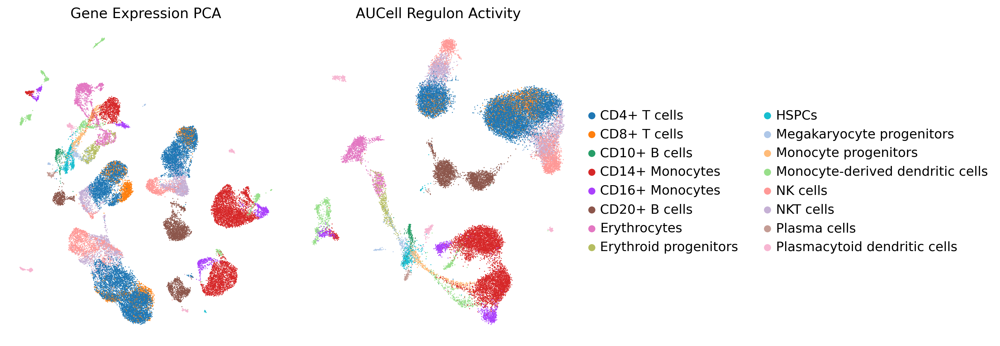

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# PCA UMAP
adata.obsm['X_umap'] = adata.obsm['X_umap_pca']
sc.pl.umap(adata, color='final_annotation', ax=axes[0], show=False,
           title='Gene Expression PCA', legend_loc='none', frameon=False)

# AUCell UMAP
adata.obsm['X_umap'] = adata.obsm['X_umap_aucell']
sc.pl.umap(adata, color='final_annotation', ax=axes[1], show=False,
           title='AUCell Regulon Activity', frameon=False,
           legend_loc='right margin')

plt.tight_layout()
plt.show()

## 4. Batch Effect Comparison

Batch effects are a major challenge in scRNA-seq. Here we show that the AUCell-based UMAP naturally mixes batches while separating cell types -- without any explicit batch correction.

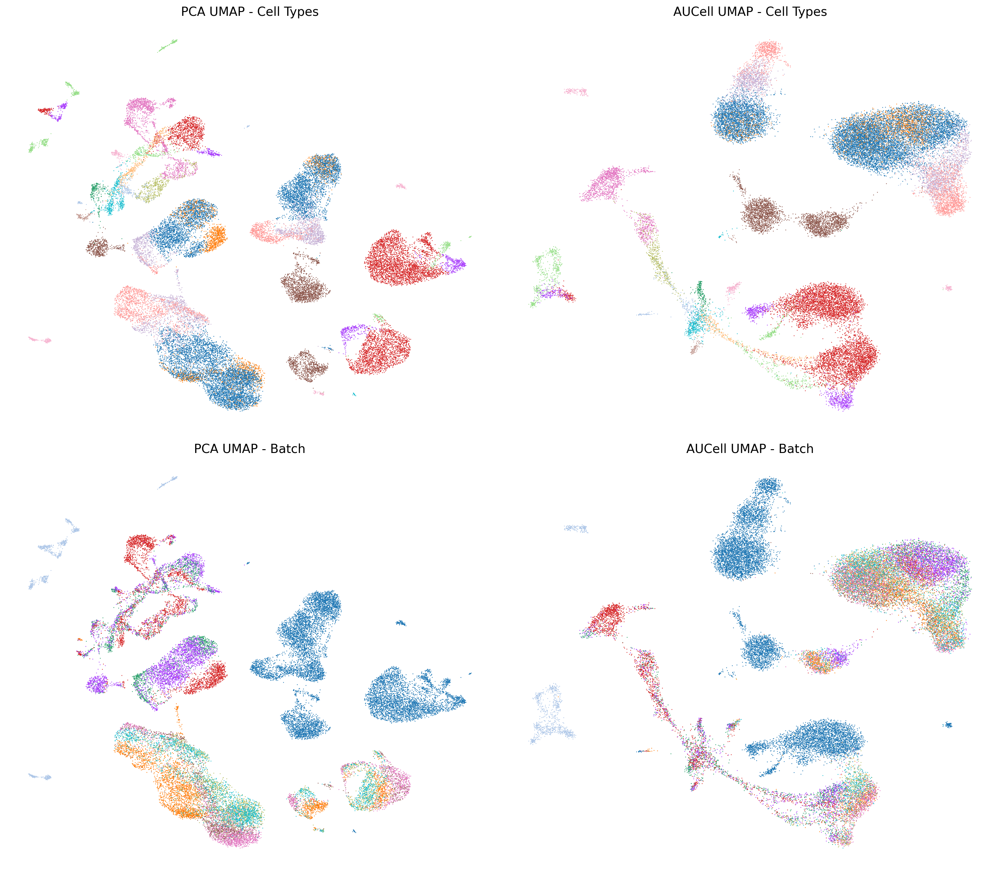

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# Row 1: Colored by cell type
adata.obsm['X_umap'] = adata.obsm['X_umap_pca']
sc.pl.umap(adata, color='final_annotation', ax=axes[0, 0], show=False,
           title='PCA UMAP - Cell Types', legend_loc='none', frameon=False)

adata.obsm['X_umap'] = adata.obsm['X_umap_aucell']
sc.pl.umap(adata, color='final_annotation', ax=axes[0, 1], show=False,
           title='AUCell UMAP - Cell Types', legend_loc='none', frameon=False)

# Row 2: Colored by batch
adata.obsm['X_umap'] = adata.obsm['X_umap_pca']
sc.pl.umap(adata, color='batch', ax=axes[1, 0], show=False,
           title='PCA UMAP - Batch', legend_loc='none', frameon=False)

adata.obsm['X_umap'] = adata.obsm['X_umap_aucell']
sc.pl.umap(adata, color='batch', ax=axes[1, 1], show=False,
           title='AUCell UMAP - Batch', legend_loc='none', frameon=False)

plt.tight_layout()
plt.show()

## 5. Regulon Activity Heatmap

A z-score normalized heatmap of regulon activity reveals which transcription factor programs define each cell type. We select the top 5 most active regulons per cell type.

In [10]:
# Mean AUCell score per cell type
auc_df = pd.DataFrame(auc_scores, columns=regulon_names, index=adata.obs_names)
auc_df['cell_type'] = adata.obs['final_annotation'].values
mean_auc = auc_df.groupby('cell_type')[regulon_names].mean()

# Select top 5 regulons per cell type
top_n = 5
top_regulons = set()
for ct in mean_auc.index:
    top = mean_auc.loc[ct].nlargest(top_n).index.tolist()
    top_regulons.update(top)
top_regulons = sorted(top_regulons)
print(f"Selected {len(top_regulons)} unique regulons across {mean_auc.shape[0]} cell types")

Selected 14 unique regulons across 16 cell types


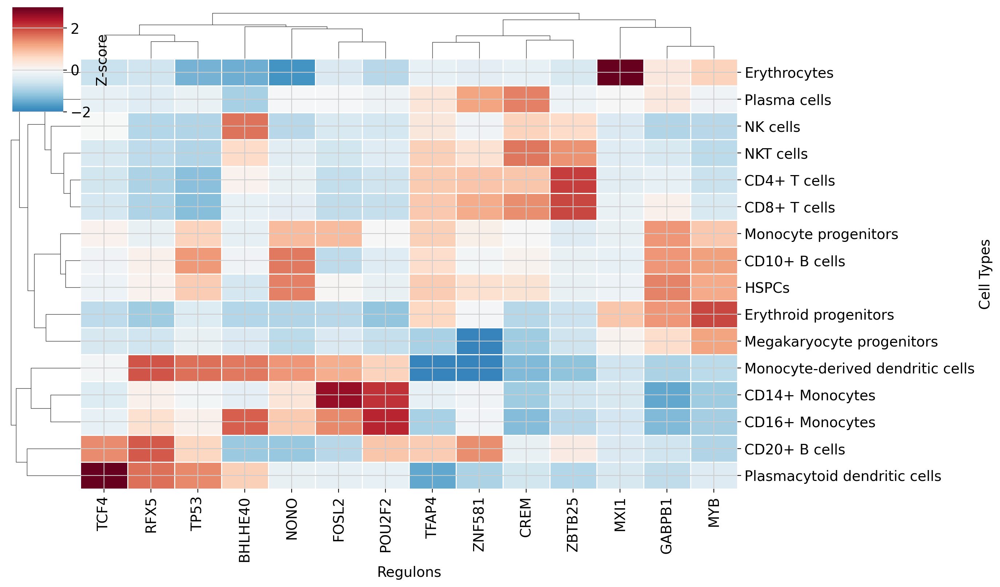

In [11]:
# Z-score normalize
mean_sub = mean_auc[top_regulons]
zscore_df = (mean_sub - mean_sub.mean()) / mean_sub.std()

# Simplify regulon names for display (e.g., "PAX5(+)" -> "PAX5")
display_names = [r.split('(')[0] if '(' in r else r for r in zscore_df.columns]
zscore_display = zscore_df.copy()
zscore_display.columns = display_names

g = sns.clustermap(
    zscore_display,
    cmap='RdBu_r', center=0, vmin=-2, vmax=3,
    figsize=(max(14, len(top_regulons) * 0.4), max(8, len(mean_auc) * 0.5)),
    row_cluster=True, col_cluster=True,
    xticklabels=True, yticklabels=True,
    linewidths=0.5, dendrogram_ratio=0.1,
    cbar_kws={'label': 'Z-score'},
)
g.ax_heatmap.set_xlabel('Regulons')
g.ax_heatmap.set_ylabel('Cell Types')
plt.show()

## 6. Regulon Specificity Scores (RSS)

The Regulon Specificity Score (RSS) quantifies how specific each regulon is to each cell type using Jensen-Shannon divergence ([Suo et al. 2018](https://doi.org/10.1016/j.celrep.2018.10.045)). An RSS close to 1 means the regulon is exclusively active in that cell type.

flashscenic provides `regulon_specificity_scores()` for this.

In [12]:
rss_result = fs.regulon_specificity_scores(
    auc_scores, adata.obs['final_annotation'].values, regulon_names
)
rss = pd.DataFrame(
    rss_result['rss'],
    index=rss_result['cell_types'],
    columns=rss_result['regulon_names'],
)
print(f"RSS matrix: {rss.shape[0]} cell types x {rss.shape[1]} regulons")

RSS matrix: 16 cell types x 192 regulons


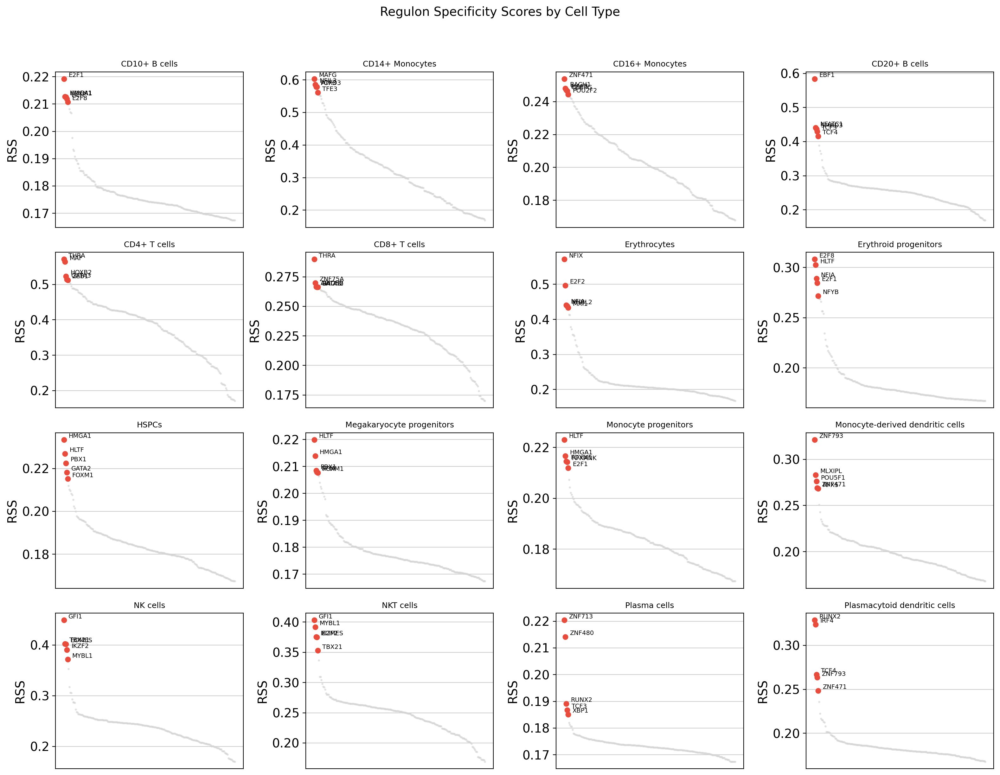

In [13]:
def plot_rss(rss_df, cell_type, ax, top_n=5):
    """Plot RSS for a single cell type, highlighting top regulons."""
    scores = rss_df.loc[cell_type].sort_values(ascending=False)
    ax.plot(range(len(scores)), scores.values, '.', color='lightgray',
            markersize=3, alpha=0.5)
    top = scores.head(top_n)
    top_idx = [scores.index.tolist().index(r) for r in top.index]
    ax.scatter(top_idx, top.values, color='#e74c3c', s=30, zorder=5)
    for idx, name in zip(top_idx, top.index):
        tf_name = name.split('(')[0] if '(' in name else name
        ax.annotate(tf_name, (idx, scores[name]), fontsize=7,
                    textcoords='offset points', xytext=(5, 2))
    ax.set_title(cell_type, fontsize=9)
    ax.set_ylabel('RSS')
    ax.set_xticks([])

cell_types = sorted(adata.obs['final_annotation'].unique())
n_cols = 4
n_rows = (len(cell_types) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 3))
axes_flat = axes.flatten()

for i, ct in enumerate(cell_types):
    plot_rss(rss, ct, axes_flat[i], top_n=5)

for j in range(i + 1, len(axes_flat)):
    axes_flat[j].set_visible(False)

plt.suptitle('Regulon Specificity Scores by Cell Type', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## 7. Known Biology Validation

A critical sanity check: do the discovered regulons match known biology? The immune dataset contains well-characterized cell types with known master regulators:

| TF | Expected Cell Type | Role |
|----|-------------------|------|
| PAX5 | B cells | B cell lineage commitment |
| SPI1 (PU.1) | Monocytes | Myeloid differentiation |
| GATA1 | Erythrocytes | Erythroid commitment |
| TBX21 (T-bet) | NK cells, CD8+ T cells | Th1/cytotoxic response |
| EOMES | NK cells, NKT cells | Effector lymphocyte function |
| IRF4 | Plasma cells, DCs | Plasma cell differentiation |
| IRF8 | pDCs, Monocytes | DC and monocyte development |
| CEBPA | Monocytes, HSPCs | Myeloid progenitor differentiation |
| TCF7 | T cells | T cell identity/stemness |

In [14]:
# Check which known TFs were found as regulons
known_tfs = ['PAX5', 'SPI1', 'GATA1', 'TBX21', 'EOMES', 'IRF4', 'IRF8',
             'CEBPA', 'TCF7']

tf_to_regulon = {}
for tf in known_tfs:
    matches = [r for r in regulon_names if r.startswith(tf + '(') or r == tf]
    if matches:
        tf_to_regulon[tf] = matches[0]

found_tfs = list(tf_to_regulon.keys())
print(f"Found {len(found_tfs)}/{len(known_tfs)} known marker TFs as regulons:")
for tf, reg in tf_to_regulon.items():
    idx = regulon_names.index(reg)
    n_genes = len(regulons[idx]['genes'])
    print(f"  {tf} -> {reg} ({n_genes} target genes)")

Found 7/9 known marker TFs as regulons:
  SPI1 -> SPI1(+) (1468 target genes)
  GATA1 -> GATA1(+) (315 target genes)
  TBX21 -> TBX21(+) (122 target genes)
  EOMES -> EOMES(+) (112 target genes)
  IRF4 -> IRF4(+) (23 target genes)
  IRF8 -> IRF8(+) (835 target genes)
  CEBPA -> CEBPA(+) (408 target genes)


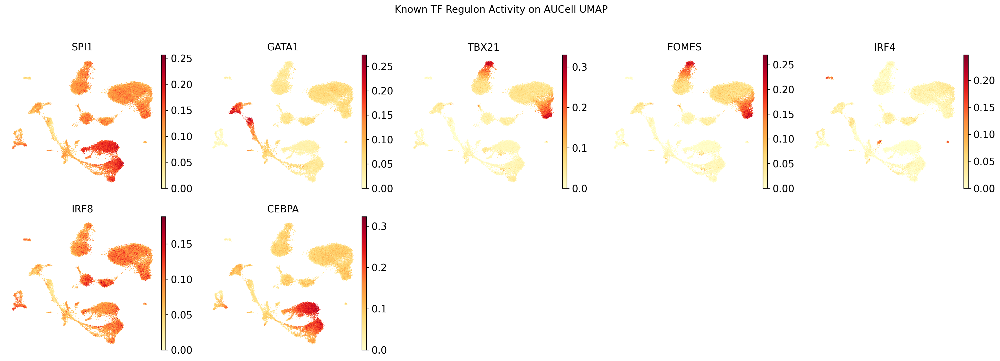

In [15]:
# Feature plots: regulon activity on the AUCell UMAP
adata.obsm['X_umap'] = adata.obsm['X_umap_aucell']
for tf, reg in tf_to_regulon.items():
    idx = regulon_names.index(reg)
    adata.obs[f'regulon_{tf}'] = auc_scores[:, idx]

n_tfs = len(found_tfs)
n_cols = min(5, n_tfs)
n_rows = (n_tfs + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3.5 * n_rows))
axes_flat = np.array(axes).flatten()

for i, tf in enumerate(found_tfs):
    sc.pl.umap(adata, color=f'regulon_{tf}', ax=axes_flat[i], show=False,
               title=f'{tf}', frameon=False, color_map='YlOrRd', vmin=0)

for j in range(i + 1, len(axes_flat)):
    axes_flat[j].set_visible(False)

plt.suptitle('Known TF Regulon Activity on AUCell UMAP', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

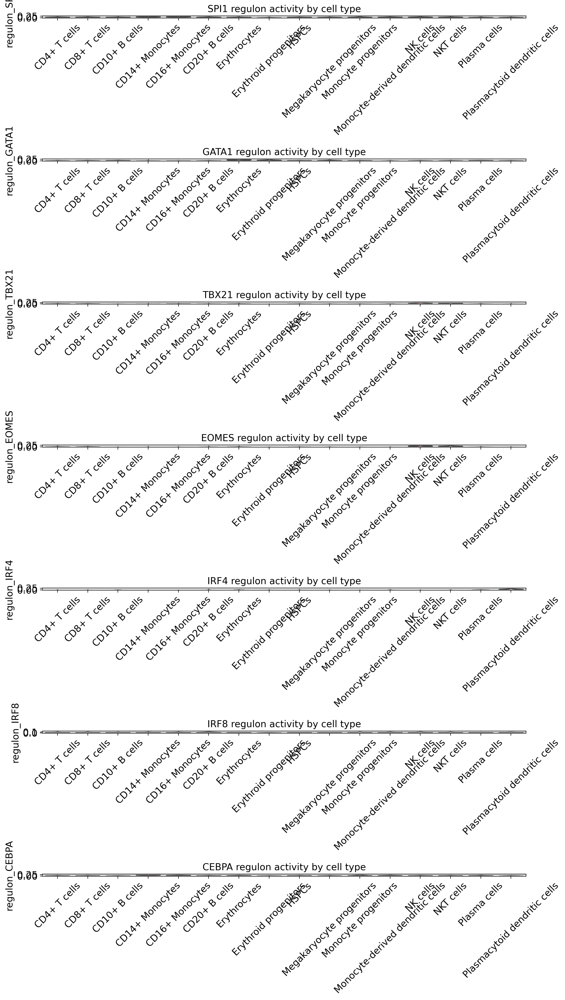

In [16]:
# Violin plots: regulon activity by cell type
fig, axes = plt.subplots(len(found_tfs), 1,
                         figsize=(12, 3 * len(found_tfs)))
if len(found_tfs) == 1:
    axes = [axes]

for i, tf in enumerate(found_tfs):
    sc.pl.violin(adata, keys=f'regulon_{tf}', groupby='final_annotation',
                 ax=axes[i], show=False, rotation=45, stripplot=False)
    axes[i].set_title(f'{tf} regulon activity by cell type')
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

## 8. Binary Regulon Activity

AUCell scores are continuous, but it's often useful to binarize them -- classifying each regulon as "on" or "off" in each cell. We threshold at the 75th percentile of each regulon's AUCell score distribution. This lets us ask: what fraction of cells in each type have a given regulon active?

In [17]:
# Binarize AUCell scores
threshold_pct = 75
thresholds = np.percentile(auc_scores, threshold_pct, axis=0)
binary_auc = (auc_scores > thresholds[np.newaxis, :]).astype(np.float32)

print(f"Mean fraction active per regulon: {binary_auc.mean(axis=0).mean():.3f}")

Mean fraction active per regulon: 0.232


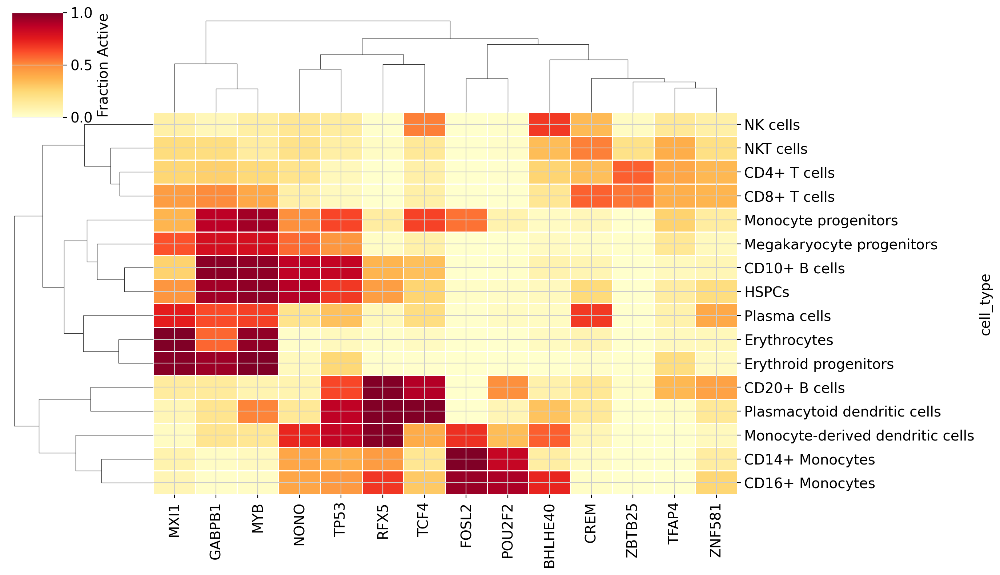

In [18]:
# Fraction-active heatmap per cell type
binary_df = pd.DataFrame(binary_auc, columns=regulon_names, index=adata.obs_names)
binary_df['cell_type'] = adata.obs['final_annotation'].values
pct_active = binary_df.groupby('cell_type')[regulon_names].mean()

# Subset to the top regulons from section 5
pct_sub = pct_active[top_regulons]
pct_display = pct_sub.copy()
pct_display.columns = [r.split('(')[0] if '(' in r else r for r in pct_sub.columns]

g = sns.clustermap(
    pct_display,
    cmap='YlOrRd', vmin=0, vmax=1,
    figsize=(max(14, len(top_regulons) * 0.4), max(8, len(cell_types) * 0.5)),
    row_cluster=True, col_cluster=True,
    xticklabels=True, yticklabels=True,
    linewidths=0.5,
    cbar_kws={'label': 'Fraction Active'},
)
plt.show()

## 9. Dot Plot

Scanpy's dot plot combines two dimensions: dot **size** shows the fraction of cells with a regulon active, and dot **color** shows the mean activity level. We use the top 3 regulons per cell type by RSS.

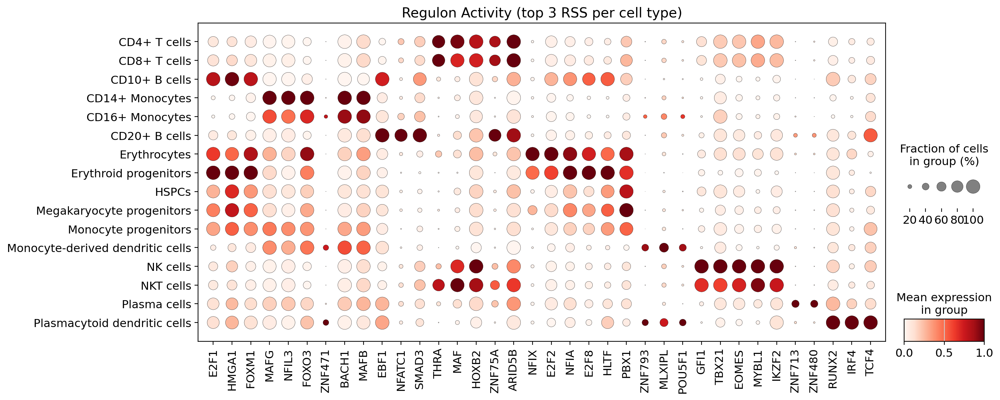

In [19]:
# Select top 3 regulons per cell type by RSS
top_rss_regulons = []
for ct in sorted(rss.index):
    top3 = rss.loc[ct].nlargest(3).index.tolist()
    top_rss_regulons.extend(top3)
top_rss_regulons = list(dict.fromkeys(top_rss_regulons))  # deduplicate

# Create subset with simplified names
adata_dot = adata_regulons[:, top_rss_regulons].copy()
adata_dot.var_names = pd.Index(
    [r.split('(')[0] if '(' in r else r for r in top_rss_regulons]
)

sc.pl.dotplot(
    adata_dot,
    var_names=adata_dot.var_names.tolist(),
    groupby='final_annotation',
    standard_scale='var',
    title='Regulon Activity (top 3 RSS per cell type)',
    figsize=(max(12, len(top_rss_regulons) * 0.4), 6),
)
plt.show()

## 10. Differential Regulon Activity

We can use scanpy's `rank_genes_groups` on the AUCell scores to find regulons that are statistically differentially active between cell types. This is analogous to differential expression analysis, but for regulatory programs.

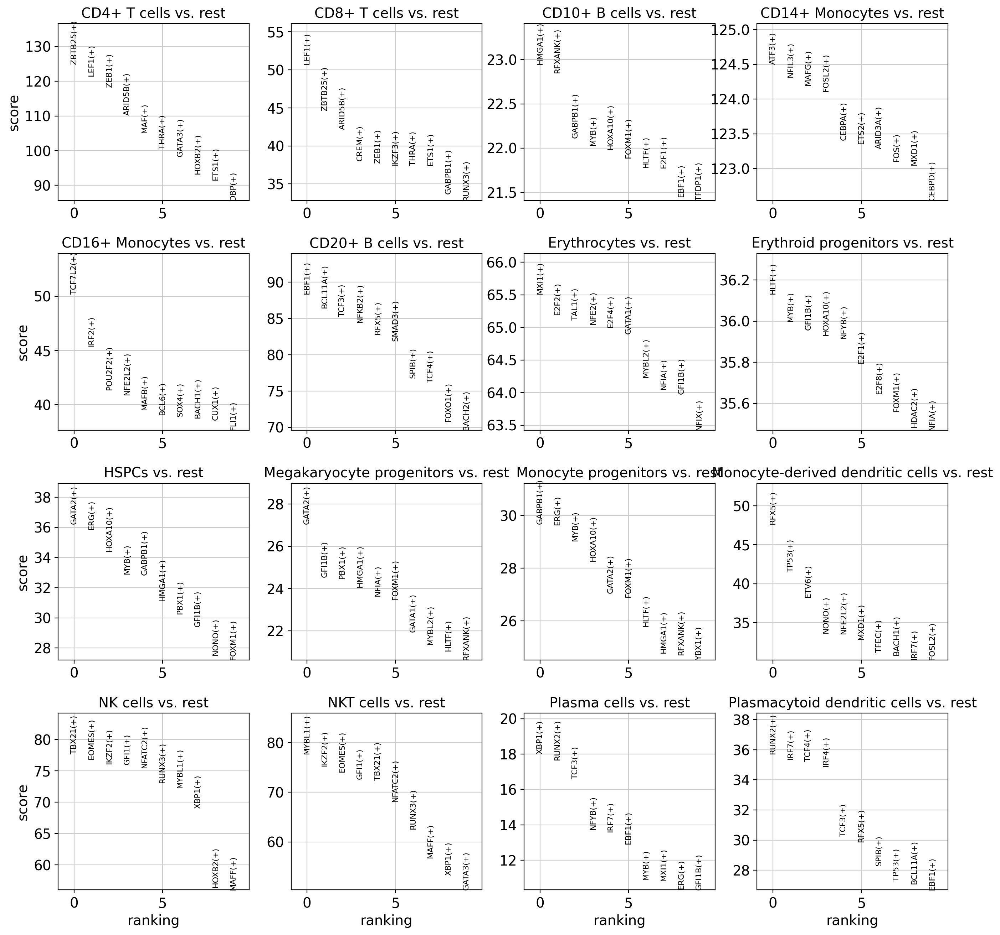

In [20]:
# Find differentially active regulons per cell type
sc.tl.rank_genes_groups(adata_regulons, groupby='final_annotation',
                        method='wilcoxon', use_raw=False)
sc.pl.rank_genes_groups(adata_regulons, n_genes=10, sharey=False,
                        fontsize=8, figsize=(16, 4))
plt.show()

In [21]:
# Focused comparison: CD4+ T cells vs CD8+ T cells
sc.tl.rank_genes_groups(adata_regulons, groupby='final_annotation',
                        groups=['CD4+ T cells'], reference='CD8+ T cells',
                        method='wilcoxon', use_raw=False, key_added='cd4_vs_cd8')

result_df = sc.get.rank_genes_groups_df(
    adata_regulons, group='CD4+ T cells', key='cd4_vs_cd8'
)
result_df['tf'] = result_df['names'].apply(
    lambda x: x.split('(')[0] if '(' in x else x
)
print("Top 10 regulons enriched in CD4+ T cells vs CD8+ T cells:")
result_df.head(10)[['tf', 'names', 'scores', 'pvals_adj', 'logfoldchanges']]

Top 10 regulons enriched in CD4+ T cells vs CD8+ T cells:


,tf,names,scores,pvals_adj,logfoldchanges
0,MAF,MAF(+),23.021828,5.410760e-115,0.457621
1,FLI1,FLI1(+),19.457815,6.005364e-83,0.143068
2,ZNF467,ZNF467(+),16.820351,2.374377e-62,0.220426
3,IRF2,IRF2(+),16.530512,2.832068e-60,0.149056
4,NFKB2,NFKB2(+),16.312944,9.581768e-59,0.228235
5,HOXB2,HOXB2(+),14.680341,9.730587e-48,0.153528
6,BCL6,BCL6(+),14.352610,1.094430e-45,0.126546
7,IRF5,IRF5(+),14.165979,1.428279e-44,0.132637
8,NFATC2,NFATC2(+),13.659850,1.539023e-41,0.164607
9,RELA,RELA(+),13.239033,4.358992e-39,0.175988


## 11. TF-Target Network Visualization

For any regulon of interest, we can visualize its target genes as a network graph. The TF is shown at the center with edges to target genes, sized by expression correlation.

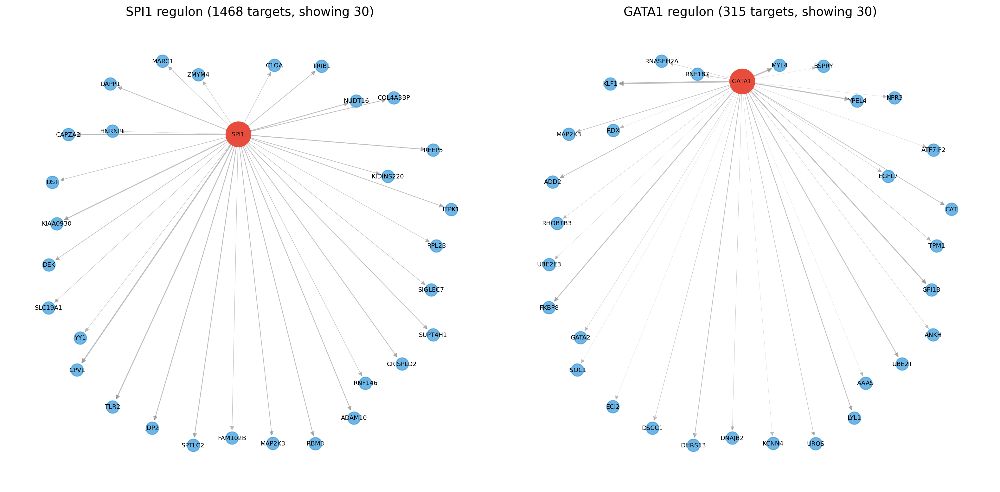

In [22]:
import networkx as nx

def plot_regulon_network(regulon_dict, exp_matrix, gene_names, ax=None,
                         max_targets=30):
    """Plot a TF-target network for a single regulon."""
    tf = regulon_dict['tf']
    targets = regulon_dict['genes'][:max_targets]

    G = nx.DiGraph()
    G.add_node(tf, node_type='tf')

    tf_expr = None
    if tf in gene_names:
        tf_expr = exp_matrix[:, gene_names.index(tf)]

    for target in targets:
        corr = 0.1
        if tf_expr is not None and target in gene_names:
            c = np.corrcoef(tf_expr, exp_matrix[:, gene_names.index(target)])[0, 1]
            corr = max(0.05, c) if not np.isnan(c) else 0.1
        G.add_node(target, node_type='target')
        G.add_edge(tf, target, weight=corr)

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 10))

    pos = nx.spring_layout(G, k=2, seed=42)

    tf_nodes = [n for n, d in G.nodes(data=True) if d.get('node_type') == 'tf']
    target_nodes = [n for n, d in G.nodes(data=True)
                    if d.get('node_type') == 'target']

    nx.draw_networkx_nodes(G, pos, nodelist=tf_nodes, node_color='#e74c3c',
                           node_size=800, ax=ax)
    nx.draw_networkx_nodes(G, pos, nodelist=target_nodes, node_color='#3498db',
                           node_size=200, alpha=0.7, ax=ax)

    edges = G.edges(data=True)
    widths = [d['weight'] * 3 for _, _, d in edges]
    nx.draw_networkx_edges(G, pos, width=widths, alpha=0.5,
                           edge_color='gray', arrows=True, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=7, ax=ax)

    n_total = len(regulon_dict['genes'])
    shown = min(max_targets, n_total)
    ax.set_title(f"{tf} regulon ({n_total} targets, showing {shown})")
    ax.axis('off')


# Plot networks for a few interesting regulons
interesting_tfs = [tf for tf in ['PAX5', 'SPI1', 'GATA1'] if tf in tf_to_regulon]

if interesting_tfs:
    fig, axes = plt.subplots(1, len(interesting_tfs),
                             figsize=(8 * len(interesting_tfs), 8))
    if len(interesting_tfs) == 1:
        axes = [axes]

    for i, tf in enumerate(interesting_tfs):
        reg_name = tf_to_regulon[tf]
        reg_idx = regulon_names.index(reg_name)
        plot_regulon_network(regulons[reg_idx], exp_matrix, gene_names,
                             ax=axes[i])

    plt.tight_layout()
    plt.show()

## 12. Regulon Co-Activity Analysis

Regulons don't act in isolation -- TFs form regulatory circuits and cascades. A correlation heatmap of regulon activities reveals which TF programs are co-activated (suggesting cooperative regulation) or mutually exclusive (suggesting alternative cell fate programs).

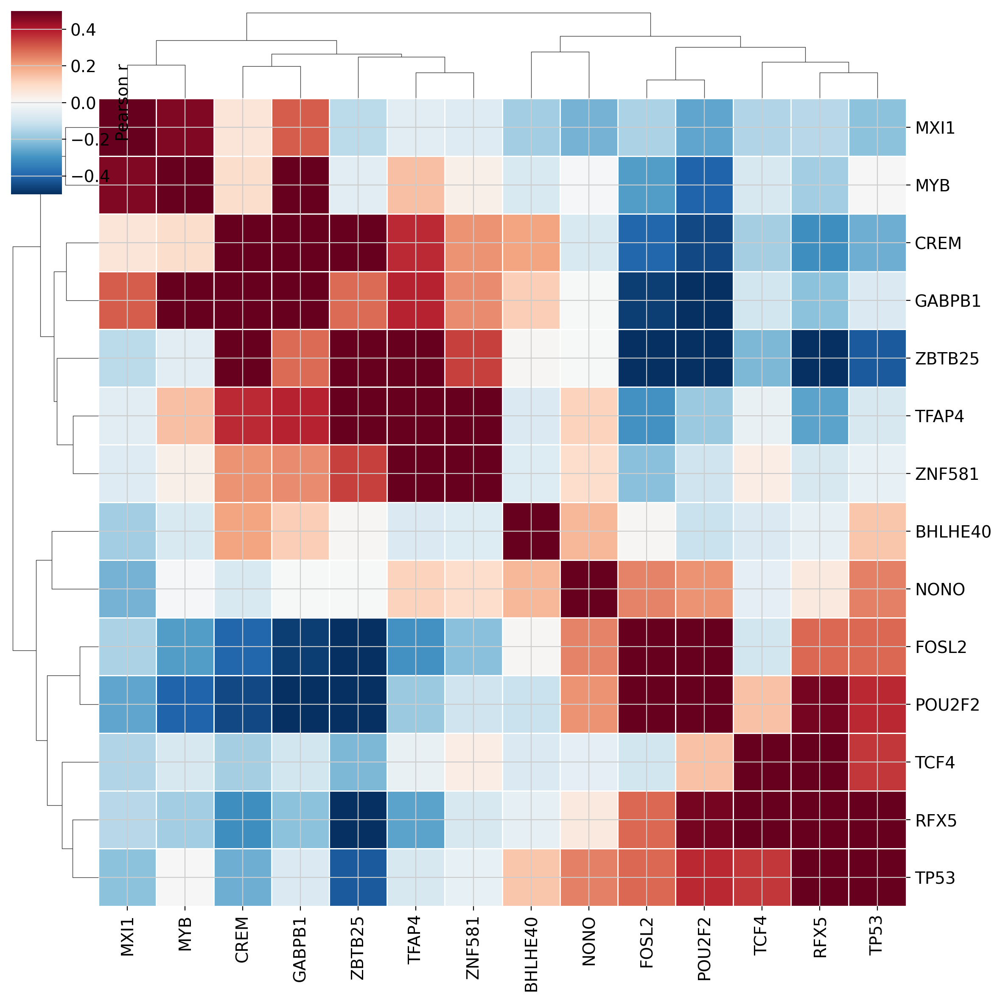

In [23]:
# Pearson correlation of regulon AUCell scores (top regulons)
auc_top = auc_df[top_regulons]
corr_matrix = auc_top.corr()

# Simplified names
display = {r: r.split('(')[0] if '(' in r else r for r in top_regulons}
corr_display = corr_matrix.copy()
corr_display.index = [display[r] for r in corr_display.index]
corr_display.columns = [display[r] for r in corr_display.columns]

g = sns.clustermap(
    corr_display,
    cmap='RdBu_r', center=0, vmin=-0.5, vmax=0.5,
    figsize=(max(12, len(top_regulons) * 0.35),
             max(12, len(top_regulons) * 0.35)),
    linewidths=0.5,
    xticklabels=True, yticklabels=True,
    dendrogram_ratio=0.1,
    cbar_kws={'label': 'Pearson r'},
)
plt.show()

## Summary

| Analysis | Key Insight |
|----------|------------|
| AUCell UMAP | Regulon-based embedding naturally handles batch effects |
| Regulon heatmap | Z-score visualization reveals cell-type-defining TF programs |
| RSS scores | Principled identification of cell-type-specific regulons |
| Biology validation | Known TF-cell type associations are recovered |
| Binary activity | Fraction-active analysis shows regulatory penetrance |
| Dot plot | Combined view of activity strength and breadth |
| Differential activity | Statistical identification of TFs distinguishing cell types |
| TF-target networks | Visualization of regulatory targets for any TF |
| Co-activity analysis | Discovery of cooperative and antagonistic TF programs |

### Next Steps

- **Custom TF lists**: Pass `tf_list_path` to use curated TF lists (e.g., Lambert 2018)
- **Multi-species**: Use `species='mouse'` for mouse data
- **Parameter tuning**: Adjust `module_k`, `pruning_nes_threshold`, etc. -- see the [Pipeline Guide](pipeline.md)
- **Integration comparison**: Compare AUCell embedding against Harmony, scVI, or Scanorama